# Time series analysis

For time series analysis may be few ideas: (updated in time)

1. number of sessions done in a day by all of the users - doesn't include demographics of the users - to see how it can change based on the day (if it is Monday, Tuesday, etc.),
2. number of sessions done in a month/week by all of the users - doesn't include demographics of the users,
    - grouped by f.e. activity_level, gender etc.
3. number of users that done a session in a day - also doesn't include demographics,
4. number of users that done a session in a day - but may include users demographics - f.e. mean age of users that did the workout,
4. ...

In [1]:
# libraries

import pandas as pd
import numpy as np
import bz2
pd.set_option('display.max_columns', None)
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
import math
import pingouin as pg
import statsmodels.api as sm
import matplotlib as mpl
from scipy import stats
from distfit import distfit
import scikit_posthocs as sp
import datetime as dt

pd.options.display.float_format = '{:.2f}'.format

import warnings
warnings.filterwarnings('ignore')

plt.rcParams["image.cmap"] = "Pastel2"

/home/evida-monika/anaconda3/envs/mhunters/lib/python3.10/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [2]:
# planting seed

import random

random.seed(10)

In [3]:
# importing data

df = pd.read_csv("/home/evida-monika/mhunters/final_data_5.csv.bz2", compression="bz2", sep=",")

#df = pd.read_csv("C:/Users/admin/Desktop/mhunters/final_data_5.csv.bz2", compression="bz2", sep=",")


# this is cleaned dataset
# we need to delete another user - ID = 235, because it has 274 sessions in 4 weeks - impossible.

df = df[df['id_users'] != 235]

In [4]:
# changing types of data

cols = ['name_en_exercises','discarded_session_execution', 'code_name_sessions', 
        'name_en_sessions', 'active_user_programs', 'completed_user_programs',
        'pro_programs', 'available_programs', 'name_en_programs', 
        'gender', 'cluster',
        'activity_level', 'goal', 'body_type', 'newsletter_subscription', 'notifications_setting',
        'language', 'scientific_data_usage', 'BMI_category', 'name_en_implements']

for col in cols:
    df[col] = df[col].astype('category')
    
col_date = ['updated_at_ex_ex', 'created_at_exercises', 'updated_at_exercises',
            'updated_at_session_execution', 'created_at_user_programs', 'updated_at_user_programs',
            'created_at_programs', 'updated_at_programs', 'created_at_users', 'updated_at_users',
            'date_of_birth']

for col in col_date:
    df[col] = pd.to_datetime(df[col])#.dt.strftime("%Y-%m-%d %H:%M:%S")

cat_names = {
    'gender': {1: 'male', 0: 'female'},
    'activity_level': {0: 'very active', 1: 'active', 2: 'sedentary'},
    'goal': {0: 'lose', 1: 'gain', 2: 'antiaging'},
    'body_type': {0: 'thin', 1: 'mid', 2: 'strong'}
}

df = df.replace(cat_names)


In [5]:
# dataset only for users

df_users_only_once = df.drop_duplicates(subset=['id_users'], keep='first')

In [6]:
# here dropping all of the columns that are not relevant for users

df_users_only = df_users_only_once.loc[:, ['id_users', 'created_at_users', 'updated_at_users', 'gender',
       'date_of_birth', 'height', 'weight', 'activity_level', 'goal',
       'body_type', 'body_fat', 'newsletter_subscription',
       'notifications_setting', 'training_days_setting', 'language', 'points', 'cluster',
       'scientific_data_usage', 'best_weekly_streak_users', 'BMI', 'BMI_category', 'total_sessions_users2',
                                          'total_time_users2', 'total_reps_users2', 'reps_per_session_users2',
                                          'total_calories_users2', 'kcal_per_session_users2', 
                                           'exercises_per_user', 'exercises_without_rest_per_user', 'cluster']]

In [7]:
# dataset for only one of id_session_execution

df_session_exe_only_once = df.drop_duplicates(subset=['id_session_execution'], keep='first')

In [8]:
# here dropping all of the columns that are not relevant for session_execution

df_session_exe = df_session_exe_only_once.loc[:, ['id_session_execution', 
                                                  'difficulty_feedback_session_execution',
       'enjoyment_feedback_session_execution',
       'reps_executed_session_execution', 'updated_at_session_execution',
       'discarded_session_execution', 'id_sessions', 'order_sessions',
       'time_duration_sessions', 'code_name_sessions', 'name_en_sessions',
       'id_user_programs', 'created_at_user_programs',
       'updated_at_user_programs', 'active_user_programs',
       'current_session_id_user_programs', 'completed_user_programs',
       'id_programs', 'created_at_programs', 'updated_at_programs',
       'pro_programs', 'available_programs', 'strength_programs',
       'endurance_programs', 'technique_programs', 'flexibility_programs',
       'intensity_programs', 'name_en_programs', 'description_en_programs',
       'id_users', 'created_at_users', 'updated_at_users', 'gender',
       'date_of_birth', 'height', 'weight', 'activity_level', 'goal',
       'body_type', 'body_fat', 'newsletter_subscription', 'cluster',
       'notifications_setting', 'training_days_setting', 'language', 'points',
       'scientific_data_usage', 'best_weekly_streak_users', 'BMI', 'BMI_category', 'total_sessions_users2',
       'total_time_session_execution', 'total_reps_session_execution',
       'total_time_users2', 'total_reps_users2', 'reps_per_session_users2',
       'total_time_session_execution_min', 'reps_per_min_session_execution',
       'exercise_execution_time_min', 'calories_session_execution',
       'total_calories_users2', 'kcal_per_session_users2',
                                          'YYYY/WW',
                                                 'number_exercises_in_session',
       'number_exercises_without_rest_in_session']]

In [9]:
df_session_exe.head()

,id_session_execution,difficulty_feedback_session_execution,enjoyment_feedback_session_execution,reps_executed_session_execution,updated_at_session_execution,discarded_session_execution,id_sessions,order_sessions,time_duration_sessions,code_name_sessions,name_en_sessions,id_user_programs,created_at_user_programs,updated_at_user_programs,active_user_programs,current_session_id_user_programs,completed_user_programs,id_programs,created_at_programs,updated_at_programs,pro_programs,available_programs,strength_programs,endurance_programs,technique_programs,flexibility_programs,intensity_programs,name_en_programs,description_en_programs,id_users,created_at_users,updated_at_users,gender,date_of_birth,height,weight,activity_level,goal,body_type,body_fat,newsletter_subscription,cluster,notifications_setting,training_days_setting,language,points,scientific_data_usage,best_weekly_streak_users,BMI,BMI_category,total_sessions_users2,total_time_session_execution,total_reps_session_execution,total_time_users2,total_reps_users2,reps_per_session_users2,total_time_session_execution_min,reps_per_min_session_execution,exercise_execution_time_min,calories_session_execution,total_calories_users2,kcal_per_session_users2,YYYY/WW,number_exercises_in_session,number_exercises_without_rest_in_session
0,6132.00,4.00,3.00,368.00,2021-11-01 12:05:40.078024,False,710.00,2.00,1105.00,PM1.2_V2,Session 2,7181.00,2021-10-25 11:04:40.657070,2021-11-28 11:26:22.131395,False,713.00,True,10.00,2020-11-23 13:41:46.587265,2021-09-29 14:53:34.897432,False,True,1.00,3.00,1.00,2.00,2.00,Get motivated!,The ultimate beginner’s program designed to he...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,988.00,368.00,46208.00,9680.00,189.80,16.47,22.35,0.03,50.95,2463.91,48.31,2021/44,55,32
55,7495.00,5.00,3.00,150.00,2021-11-06 13:52:37.632519,False,711.00,3.00,386.00,PM1.3_V2,Session 3,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00,False,34.00,2020-11-23 14:15:43.775009,2021-09-29 14:54:09.125824,True,True,5.00,4.00,3.00,3.00,5.00,Muscle Hunters Initiation 1,Muscle Hunters is a program created for you to...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,635.00,150.00,46208.00,9680.00,189.80,10.58,14.17,0.68,38.32,2463.91,48.31,2021/44,15,15
70,9800.00,8.00,4.00,286.00,2021-11-14 13:44:04.327400,False,320.00,7.00,962.00,MuHu7.1,Session 6,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00,False,34.00,2020-11-23 14:15:43.775009,2021-09-29 14:54:09.125824,True,True,5.00,4.00,3.00,3.00,5.00,Muscle Hunters Initiation 1,Muscle Hunters is a program created for you to...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,1322.00,286.00,46208.00,9680.00,189.80,22.03,12.98,0.33,72.86,2463.91,48.31,2021/45,57,34
127,8444.00,7.00,4.00,72.00,2021-11-09 18:47:45.480112,False,713.00,5.00,662.00,PM1.5_V2,Session 5,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00,False,34.00,2020-11-23 14:15:43.775009,2021-09-29 14:54:09.125824,True,True,5.00,4.00,3.00,3.00,5.00,Muscle Hunters Initiation 1,Muscle Hunters is a program created for you to...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,685.00,80.00,46208.00,9680.00,189.80,11.42,7.01,0.00,37.74,2463.91,48.31,2021/45,17,17
144,8075.00,6.00,4.00,150.00,2021-11-08 19:29:14.727155,False,634.00,1.00,1140.00,Descanso Activo 1,Regenerative,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00,False,34.00,2020-11-23 14:15:43.775009,2021-09-29 14:54:09.125824,

## Intoduction

**Augmented Dickey Fuller test** or (**ADF Test**) is the most commonly used test to detect stationarity. Here, the hypothesis are:
* $H_0$: The time series possesses a unit root and is non-stationary.
* $H_A$: The time series is stationary.

So, if we find that the p-value in ADF test is less than the significance level (0.05), we reject the null hypothesis.

**Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test** can be used to determine if a time series is trend stationary.This test uses the following null and alternative hypothesis:
* $H_0$: The time series is trend stationary.
* $H_A$: The time series is not trend stationary.

If the p-value of the test is less than some significance level (e.g. $\alpha = 0.05$) then we reject the null hypothesis and conclude that the time series is not trend stationary.


**Autocorrelation** is simply the correlation of a series with its own lags. If a series is significantly autocorrelated, that means, the previous values of the series (lags) may be helpful in predicting the current value.

**Partial Autocorrelation** also conveys similar information but it conveys the pure correlation of a series and its lag, excluding the correlation contributions from the intermediate lags.


(https://www.kaggle.com/code/prashant111/complete-guide-on-time-series-analysis-in-python, https://www.statology.org/kpss-test-in-python/)

## Data preparation

In [10]:
df_session_exe_copy = df_session_exe.copy()

In [11]:
from datetime import datetime

In [12]:
df_session_exe_copy['date_session_execution'] = pd.to_datetime(df_session_exe_copy['updated_at_session_execution']).dt.date


In [13]:
df_session_exe_copy.head()

,id_session_execution,difficulty_feedback_session_execution,enjoyment_feedback_session_execution,reps_executed_session_execution,updated_at_session_execution,discarded_session_execution,id_sessions,order_sessions,time_duration_sessions,code_name_sessions,name_en_sessions,id_user_programs,created_at_user_programs,updated_at_user_programs,active_user_programs,current_session_id_user_programs,completed_user_programs,id_programs,created_at_programs,updated_at_programs,pro_programs,available_programs,strength_programs,endurance_programs,technique_programs,flexibility_programs,intensity_programs,name_en_programs,description_en_programs,id_users,created_at_users,updated_at_users,gender,date_of_birth,height,weight,activity_level,goal,body_type,body_fat,newsletter_subscription,cluster,notifications_setting,training_days_setting,language,points,scientific_data_usage,best_weekly_streak_users,BMI,BMI_category,total_sessions_users2,total_time_session_execution,total_reps_session_execution,total_time_users2,total_reps_users2,reps_per_session_users2,total_time_session_execution_min,reps_per_min_session_execution,exercise_execution_time_min,calories_session_execution,total_calories_users2,kcal_per_session_users2,YYYY/WW,number_exercises_in_session,number_exercises_without_rest_in_session,date_session_execution
0,6132.00,4.00,3.00,368.00,2021-11-01 12:05:40.078024,False,710.00,2.00,1105.00,PM1.2_V2,Session 2,7181.00,2021-10-25 11:04:40.657070,2021-11-28 11:26:22.131395,False,713.00,True,10.00,2020-11-23 13:41:46.587265,2021-09-29 14:53:34.897432,False,True,1.00,3.00,1.00,2.00,2.00,Get motivated!,The ultimate beginner’s program designed to he...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,988.00,368.00,46208.00,9680.00,189.80,16.47,22.35,0.03,50.95,2463.91,48.31,2021/44,55,32,2021-11-01
55,7495.00,5.00,3.00,150.00,2021-11-06 13:52:37.632519,False,711.00,3.00,386.00,PM1.3_V2,Session 3,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00,False,34.00,2020-11-23 14:15:43.775009,2021-09-29 14:54:09.125824,True,True,5.00,4.00,3.00,3.00,5.00,Muscle Hunters Initiation 1,Muscle Hunters is a program created for you to...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,635.00,150.00,46208.00,9680.00,189.80,10.58,14.17,0.68,38.32,2463.91,48.31,2021/44,15,15,2021-11-06
70,9800.00,8.00,4.00,286.00,2021-11-14 13:44:04.327400,False,320.00,7.00,962.00,MuHu7.1,Session 6,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00,False,34.00,2020-11-23 14:15:43.775009,2021-09-29 14:54:09.125824,True,True,5.00,4.00,3.00,3.00,5.00,Muscle Hunters Initiation 1,Muscle Hunters is a program created for you to...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,1322.00,286.00,46208.00,9680.00,189.80,22.03,12.98,0.33,72.86,2463.91,48.31,2021/45,57,34,2021-11-14
127,8444.00,7.00,4.00,72.00,2021-11-09 18:47:45.480112,False,713.00,5.00,662.00,PM1.5_V2,Session 5,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00,False,34.00,2020-11-23 14:15:43.775009,2021-09-29 14:54:09.125824,True,True,5.00,4.00,3.00,3.00,5.00,Muscle Hunters Initiation 1,Muscle Hunters is a program created for you to...,2273.00,2021-10-25 11:04:40.560589,2022-09-07 12:39:46.135605,female,1981-12-31,163.00,66.00,active,lose,mid,15.00,False,9,True,3.00,es,439070.00,True,8.00,24.84,Normal,51.00,685.00,80.00,46208.00,9680.00,189.80,11.42,7.01,0.00,37.74,2463.91,48.31,2021/45,17,17,2021-11-09
144,8075.00,6.00,4.00,150.00,2021-11-08 19:29:14.727155,False,634.00,1.00,1140.00,Descanso Activo 1,Regenerative,35844.00,2021-11-03 10:24:44.496283,2022-07-11 12:39:18.024392,True,315.00

In [14]:
sessions_a_day = df_session_exe_copy.groupby(['date_session_execution'])['id_session_execution'].nunique().reset_index()

In [15]:
sessions_a_day = pd.DataFrame(sessions_a_day)

Now we get the number of unique session ids (number of sessions done) in a day by all users.

In [16]:
sessions_a_day.head()

,date_session_execution,id_session_execution
0,2021-11-01,207
1,2021-11-02,230
2,2021-11-03,256
3,2021-11-04,239
4,2021-11-05,209


In [17]:
sessions_a_day.rename(columns = {'id_session_execution': 'number_of_sessions'}, 
                      inplace = True)

In [18]:
def plot_df(df, x, y, title="", xlabel='Date', ylabel='Number of sessions', dpi=100, tick_rot = 0):
    plt.figure(figsize=(15,4), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.xticks(rotation = tick_rot)
    plt.show()

In [19]:
 sessions_a_week = df_session_exe_copy.groupby(['YYYY/WW'])['id_session_execution'].nunique().reset_index()

In [20]:
sessions_a_week.rename(columns = {'id_session_execution': 'number_of_sessions'}, 
                      inplace = True)

## First approach - number of sessions done in a day by all of the users

First approach is number of sessions done in a day by all of the users. The data is the sum of unique sessions executions ids in each day.

Below there is a plot how the data looks over time. The plot doesn't show clear trend.

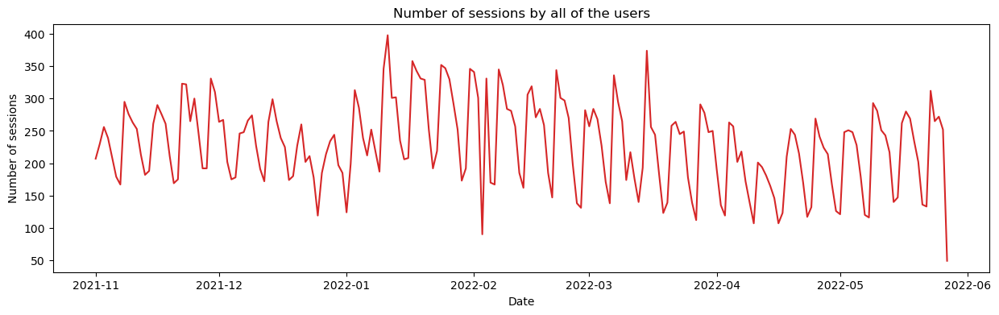

In [21]:
plot_df(sessions_a_day, x=sessions_a_day['date_session_execution'], y=sessions_a_day['number_of_sessions'], title='Number of sessions by all of the users')


### Stationarity check

Below there is a time series plot with rolling mean and standard deviation of 7 days (a week) and conduct the ADF Test to check stationarity.

In [22]:
from statsmodels.tsa.stattools import adfuller, kpss

In [23]:
sessions_a_day_i = sessions_a_day.set_index('date_session_execution')

In [24]:
def check_stationarity(df, win = 7, data_label = 'Original', tick_rot = 0):
    # rolling statistics 
    rolling_mean = df.rolling(window = win).mean() 
    rolling_std = df.rolling(window = win).std() 

    #rolling statistics plot 
    plt.figure(figsize=(15, 4), dpi = 100) 
    plt.plot(df, color = 'black', label = data_label) 
    plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean') 
    plt.plot(rolling_std, color = 'magenta', label = 'Rolling Std') 
    plt.legend(loc = 'best') 
    plt.title('Rolling Mean & Rolling Standard Deviation') 
    plt.xlabel('Date') 
    plt.ylabel('Number of sessions') 
    plt.legend(loc = 'best')
    plt.xticks(rotation = tick_rot)

    # Augmented Dickey–Fuller test: 
    adf_test = adfuller(df, autolag="AIC") 
    print('ADF Statistic: {}'.format(adf_test[0].round(3))) 
    print('p-value: {}'.format(adf_test[1].round(3))) 
    print('Critical Values:') 
    for key, value in adf_test[4].items(): 
        print('Critical Values Over {}: {}'.format(key, value.round(3)))

In [25]:
def check_stationarity_trend(df): # for thrend stationarity

    # Kwiatkowski-Phillips-Schmidt-Shin test: 
    kpss_test = kpss(df, regression="ct") 
    print('KPSS Statistic: {}'.format(kpss_test[0].round(3))) 
    print('p-value: {}'.format(kpss_test[1].round(3))) 
    print('Critical Values:') 
    for key, value in kpss_test[3].items(): 
        print('Critical Values Over {}: {}'.format(key, round(value, 3)))

ADF Statistic: -1.547
p-value: 0.51
Critical Values:
Critical Values Over 1%: -3.465
Critical Values Over 5%: -2.877
Critical Values Over 10%: -2.575


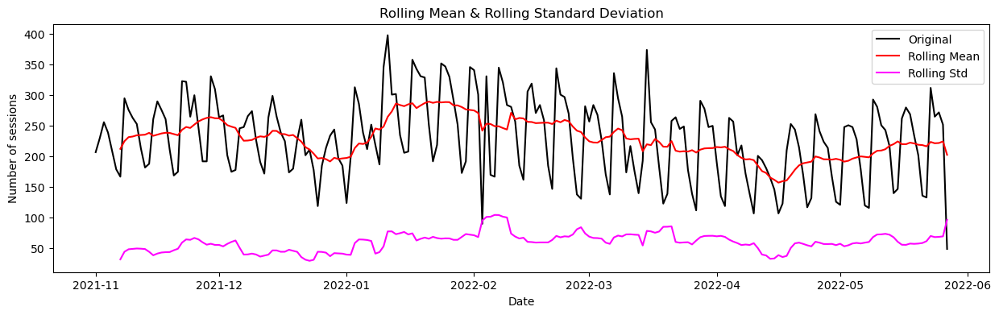

In [26]:
check_stationarity(sessions_a_day_i)

P-value is bigger than significance level ($\alpha = 0.05$) and the ADF statistic is higher than any of the critical values. There is no reason to reject the null hypothesis, so the time series can be assumed to be non-stationary. We need to do some data transforming to make the data stationary.

In [27]:
check_stationarity_trend(sessions_a_day_i)

KPSS Statistic: 0.284
p-value: 0.01
Critical Values:
Critical Values Over 10%: 0.119
Critical Values Over 5%: 0.146
Critical Values Over 2.5%: 0.176
Critical Values Over 1%: 0.216


P-value is lower than significance level and KPSS statistic is bigger than the critical values, so the time series is not trend stationary.

### ACF and PACF

Here we will check for autocorrelation and partial autocorrelation function values.

Below there is autocorrelation plot. The values of autocorrelation are still significant for big lags.

In [28]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot

<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

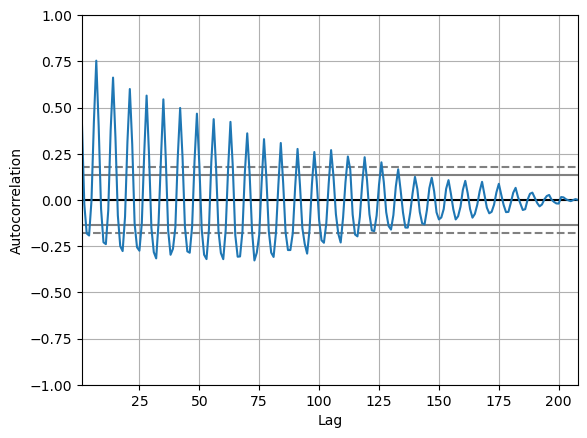

In [29]:
autocorrelation_plot(sessions_a_day_i)

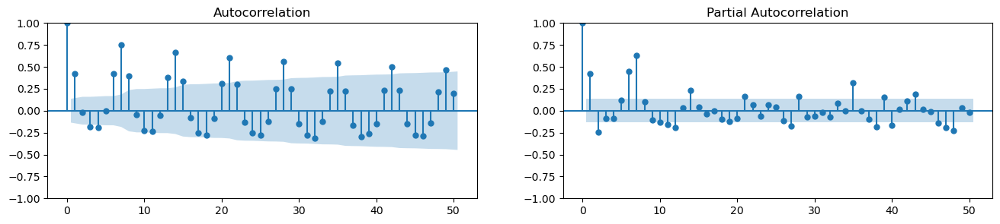

In [30]:
# Calculate ACF and PACF upto 50 lags
# acf_50 = acf(df.value, nlags=50)
# pacf_50 = pacf(df.value, nlags=50)

# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(sessions_a_day_i['number_of_sessions'].tolist(), lags=50, ax=axes[0]);
plot_pacf(sessions_a_day_i['number_of_sessions'].tolist(), lags=50, ax=axes[1]);

### Decomposition check

In [31]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse


Below we can see decomposition of time series by season, trend and residuals by additive and multiplicative decomposition.

In [32]:
multiplicative_decomposition = seasonal_decompose(sessions_a_day_i, model='multiplicative', period=7)


In [33]:
additive_decomposition = seasonal_decompose(sessions_a_day_i, model='additive', period=7)


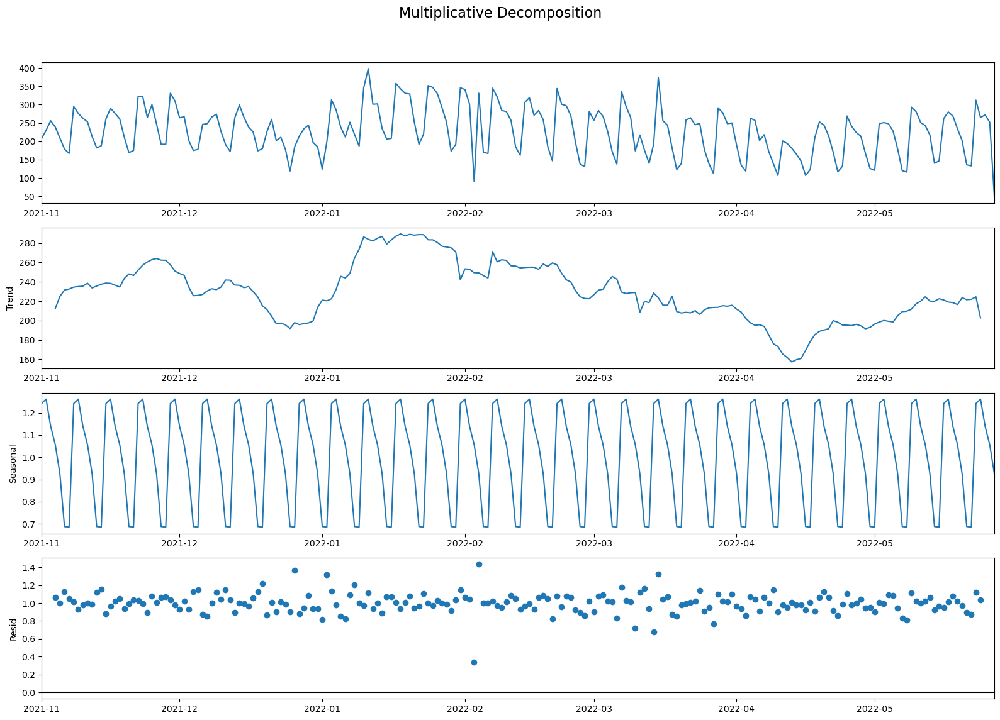

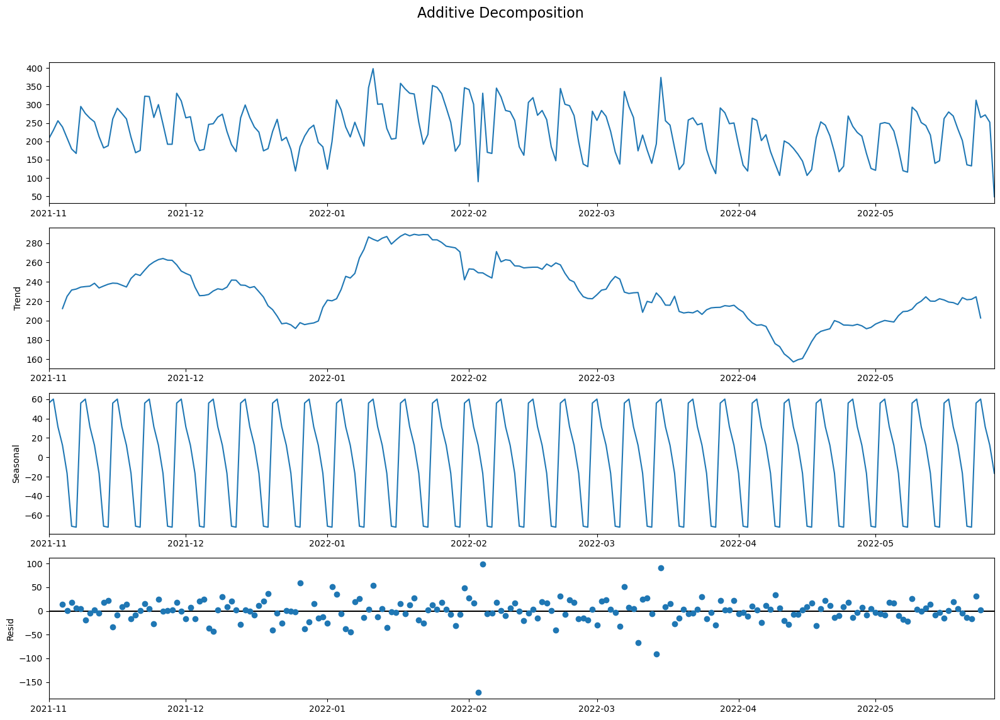

In [34]:
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()


On both sides, the residuals looks pretty random, so it's difficult to say which decomposition method is better. But also we can see that there is a seasonality but not "clear one way" trend. It looks like every week numbers of trainings done was lower and then rose up again.

### ARIMA on non-stationary data

Here, we will use ARIMA model. With this model, making the data stationary is not important, because the model will do it for us.

First we will split the data into train and test set (85% of the data is train data - about 6 months, 15% is a test data - the last month).

In [35]:
train_day_arima = sessions_a_day_i[sessions_a_day_i.index < pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

test_day_arima = sessions_a_day_i[sessions_a_day_i.index >= pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

In [36]:
def test_train_split_plot(train, test, plt_title = 'Train/Test split', y_lab = 'Session execution number'):
    plt.figure(figsize=(15, 4), dpi = 100) 
    plt.plot(train, color = "black", label = 'Train data')
    plt.plot(test, color = "red", label = 'Test data')
    plt.title("{}".format(plt_title))
    plt.ylabel(y_lab)
    plt.xlabel('Date')
    sns.set()
    plt.legend(loc = 'best')
    plt.show()

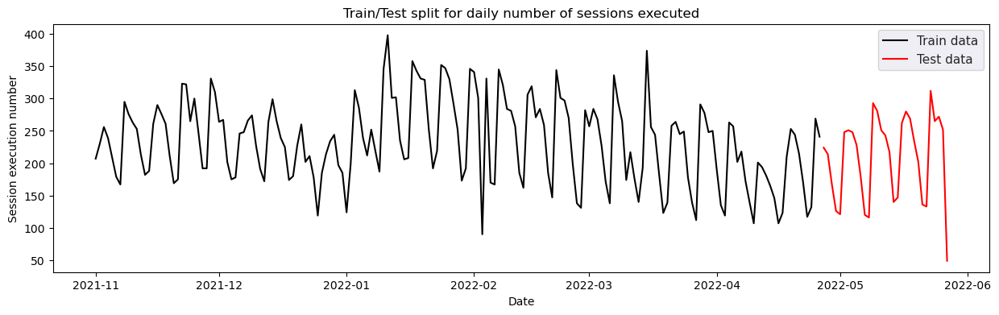

In [37]:
test_train_split_plot(train_day_arima, test_day_arima, plt_title = 'Train/Test split for daily number of sessions executed')

In [38]:
from pmdarima.arima import auto_arima

In [39]:
model_days = auto_arima(train_day_arima, trace=True, error_action='ignore', suppress_warnings=True)
model_days.fit(train_day_arima)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1891.143, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1990.654, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1990.682, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1960.417, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1988.655, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1930.443, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1921.961, Time=0.11 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1882.159, Time=0.29 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1916.130, Time=0.12 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=1842.733, Time=0.35 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=1897.893, Time=0.20 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=1804.715, Time=0.35 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=1854.904, Time=0.29 sec
 ARIMA(5,1,3)(0,0,0)[0] intercept   : AIC=1812.164, Time=0.43 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept

ARIMA(order=(5, 1, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [40]:
model_days.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  177
Model:               SARIMAX(5, 1, 2)   Log Likelihood                -893.457
Date:                Wed, 10 May 2023   AIC                           1802.914
Time:                        09:55:58   BIC                           1828.278
Sample:                             0   HQIC                          1813.202
                                - 177                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2085      0.077      2.691      0.007       0.057       0.360
ar.L2         -0.6787      0.093     -7.333      0.000      -0.860      -0.497
ar.L3         -0.3186      0.100     -3.179      0.001      -0.515      -0.122
ar.L4         -0.3496      0.062     -5.678      0.000      -0.470      -0.229
ar.L5         -0.4960      0.066     -7.497      0.000      -0.626      -0.366
ma.L1         -1.1224      0.053    -21.149      0.000      -1.226      -1.018
ma.L2          0.8604      0.057     15.087      0.000       0.749       0.972
sigma2      1574.4771    151.405     10.399      0.000    1277.729    1871.225
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               107.27
Prob(Q):                              0.87   Prob(JB):                         0.00
Heteroskedasticity (H):               1.76   Skew:                            -0.60
Prob(H) (two-sided):                  0.03   Kurtosis:                         6.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

According to the model summary, the model meets the condition of independence in the residuals (no correlation) because the p-value of the Ljung-Box test (Prob(Q)) is greater than 0.05. On the other hand, we cannot say that the residual distribution is homoscedastic (has constant variance) because the p-value of the Heteroskedasticity test (Prob(H)) is smaller than 0.05.

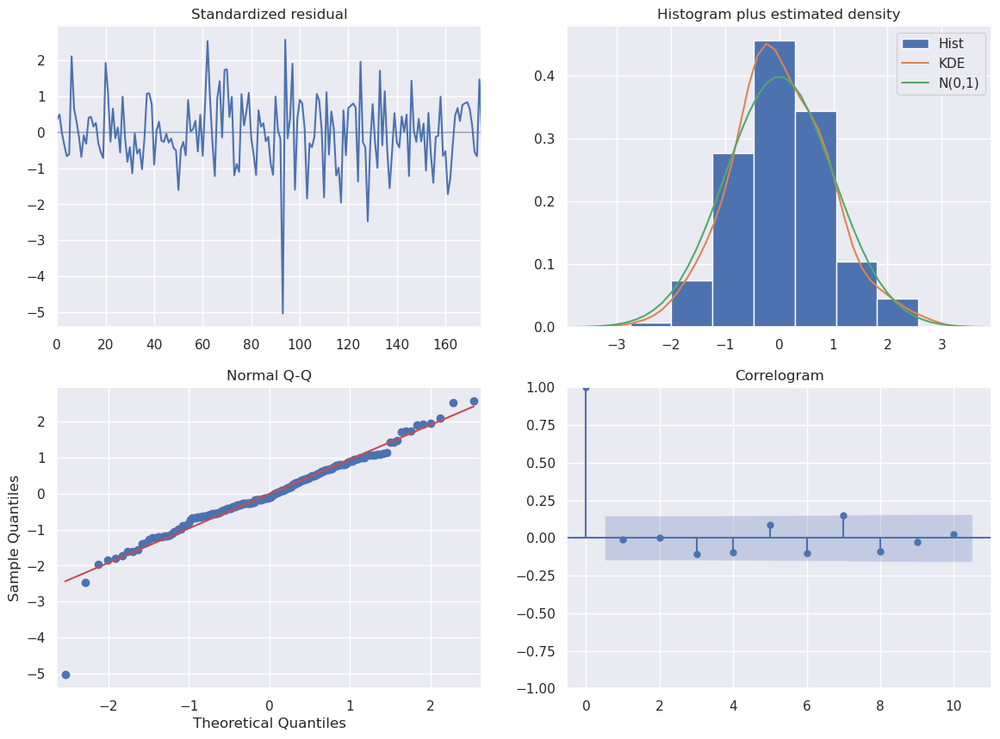

In [41]:
model_days.plot_diagnostics(figsize=(14,10))
plt.show()

Above there is a diagnostics of a model in plots. The correlogram shows only one borderline significant correlation in the residuals, so here we should think if all the data was captured by the model. Standardized residuals plot shows that there is no obvious pattern, so model should work correctly. The histogram with estimated density says that there are small differences between residuals distribution and normal distribution, qq-plot confirms it. 

Now, let's get to the forecasting.

In [42]:
forecast_days_arima = model_days.predict(n_periods=len(test_day_arima))
forecast_days_arima = pd.DataFrame(forecast_days_arima, index = test_day_arima.index, columns=['Predicted'])

In [43]:
arima_day_results = pd.concat([test_day_arima, forecast_days_arima], axis = 1)
arima_day_results.rename(columns = {'number_of_sessions': 'Actual'},
                         inplace = True)

In [44]:
arima_day_results

,Actual,Predicted
date_session_execution,,
2022-04-27,224,234.40
2022-04-28,214,224.71
2022-04-29,167,180.75
2022-04-30,126,122.11
2022-05-01,121,159.00
2022-05-02,248,227.15
2022-05-03,251,255.18
2022-05-04,248,245.32
2022-05-05,228,218.72


In [45]:
def prediction_plot(train, test, predicted, plt_title = 'Prediction', y_lab = "Session execution number"):
    plt.figure(figsize=(15, 4), dpi = 100) 
    plt.plot(train, color = "black", label = 'Train')
    plt.plot(test, color = "orange", label = 'Test')
    plt.plot(predicted, color = "green", label = 'Predicted')
    plt.title("{}".format(plt_title))
    plt.ylabel(y_lab)
    plt.xlabel('Date')
    sns.set()
    plt.legend(loc = 'best')
    plt.show()

Below there is time series plot with train, test (actual values) and predicted.

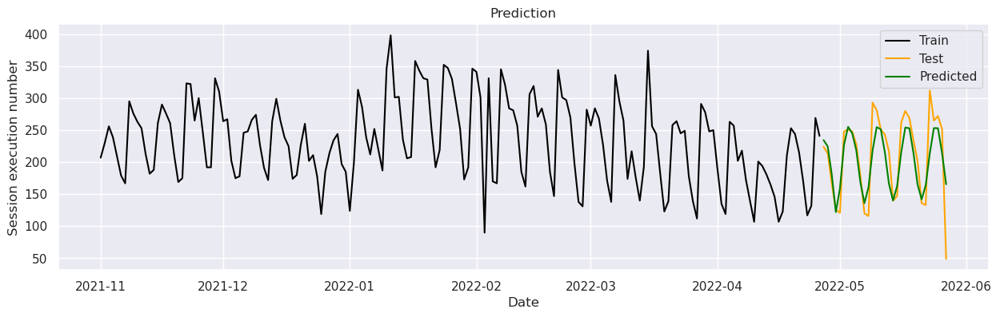

In [46]:
prediction_plot(train_day_arima, test_day_arima, forecast_days_arima)

In [47]:
from math import sqrt
from sklearn.metrics import mean_absolute_error, mean_squared_error, median_absolute_error

In [274]:
def calcsmape(actual, forecast):
    return round(1/len(actual) * np.sum(2 * np.abs(forecast-actual) / (np.abs(actual) + np.abs(forecast))), 4)

def rmse(actual, forecast):
    return round(sqrt(mean_squared_error(actual,forecast)), 4)

def mape(actual, forecast):
    mape = np.mean(np.abs((actual - forecast)/actual))
    return mape

 
def eval_metrics(test, pred):
    print('RMSE: {} \n MSE: {}, \n MAE: {},\n MedAE:{}, \n MAPE: {}, \n SMAPE: {}.'.format(
    round(rmse(test,pred),3), 
    round(mean_squared_error(test,pred),3),
    round(mean_absolute_error(test,pred),3),
    round(median_absolute_error(test,pred),3),
    round(mape(test,pred),3),
    round(calcsmape(test,pred),3)))

Now we will calculate evaluation metrics.

In [49]:
eval_metrics(test_day_arima['number_of_sessions'], forecast_days_arima['Predicted'])

RMSE: 38.346 
 MSE: 1470.423, 
 MAE: 27.271, 
 MAPE: 0.19, 
 SMAPE: 0.15.


RMSE is not that big for the data, but the closer to 0, the better the model would be. MSE is quite big, MAE also. MAPE between predicted number of sessions in a month and actual number of sessions is 19%. It is big difference. SMAPE says that there is 15% relative difference between forecasts and actual values.

We can also try to give another number of test set. Now, we will split the data into train and test set (93% of the data is train data - about 6,5 months, 7% is a test data - the last two weeks).

In [50]:
train_day_arima_2 = sessions_a_day_i[sessions_a_day_i.index < pd.to_datetime('2022-05-13', format = '%Y-%m-%d')]

test_day_arima_2 = sessions_a_day_i[sessions_a_day_i.index >= pd.to_datetime('2022-05-13', format = '%Y-%m-%d')]

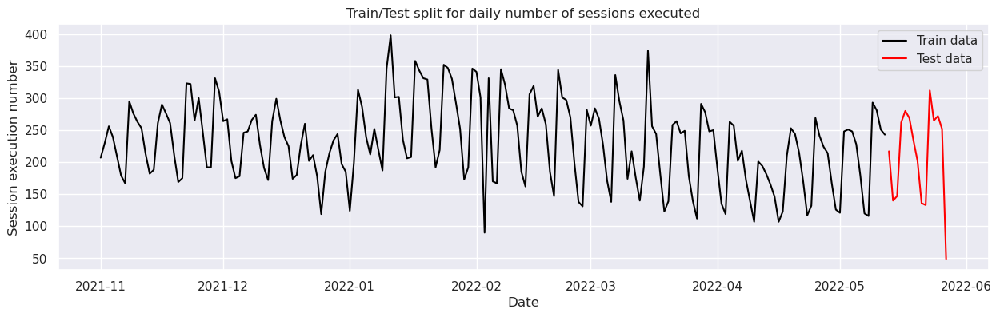

In [51]:
test_train_split_plot(train_day_arima_2, test_day_arima_2, plt_title = 'Train/Test split for daily number of sessions executed')

In [52]:
model_days_2 = auto_arima(train_day_arima_2, trace=True, error_action='ignore', suppress_warnings=True)
model_days_2.fit(train_day_arima_2)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2056.698, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2167.890, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2168.227, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2137.430, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2165.892, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2101.924, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2092.684, Time=0.11 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2045.308, Time=0.27 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2085.742, Time=0.15 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=2001.172, Time=0.37 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2063.351, Time=0.21 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=1958.644, Time=0.37 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=2014.648, Time=0.31 sec
 ARIMA(5,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : 

ARIMA(order=(5, 1, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [53]:
model_days_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  193
Model:               SARIMAX(5, 1, 2)   Log Likelihood                -970.007
Date:                Wed, 10 May 2023   AIC                           1956.013
Time:                        09:56:06   BIC                           1982.073
Sample:                             0   HQIC                          1966.568
                                - 193                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2212      0.073      3.023      0.003       0.078       0.365
ar.L2         -0.6748      0.087     -7.723      0.000      -0.846      -0.504
ar.L3         -0.3145      0.095     -3.311      0.001      -0.501      -0.128
ar.L4         -0.3493      0.058     -6.003      0.000      -0.463      -0.235
ar.L5         -0.4812      0.063     -7.637      0.000      -0.605      -0.358
ma.L1         -1.1273      0.052    -21.484      0.000      -1.230      -1.024
ma.L2          0.8527      0.056     15.126      0.000       0.742       0.963
sigma2      1488.6959    133.340     11.165      0.000    1227.355    1750.037
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):               117.86
Prob(Q):                              0.73   Prob(JB):                         0.00
Heteroskedasticity (H):               1.20   Skew:                            -0.55
Prob(H) (two-sided):                  0.47   Kurtosis:                         6.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

According to the model summary, the model meets the condition of independence in the residuals (no correlation) because the p-value of the Ljung-Box test (Prob(Q)) is greater than 0.05. The residual distribution is homoscedastic (has constant variance) because the p-value of the Heteroskedasticity test (Prob(H)) is bigger than 0.05.

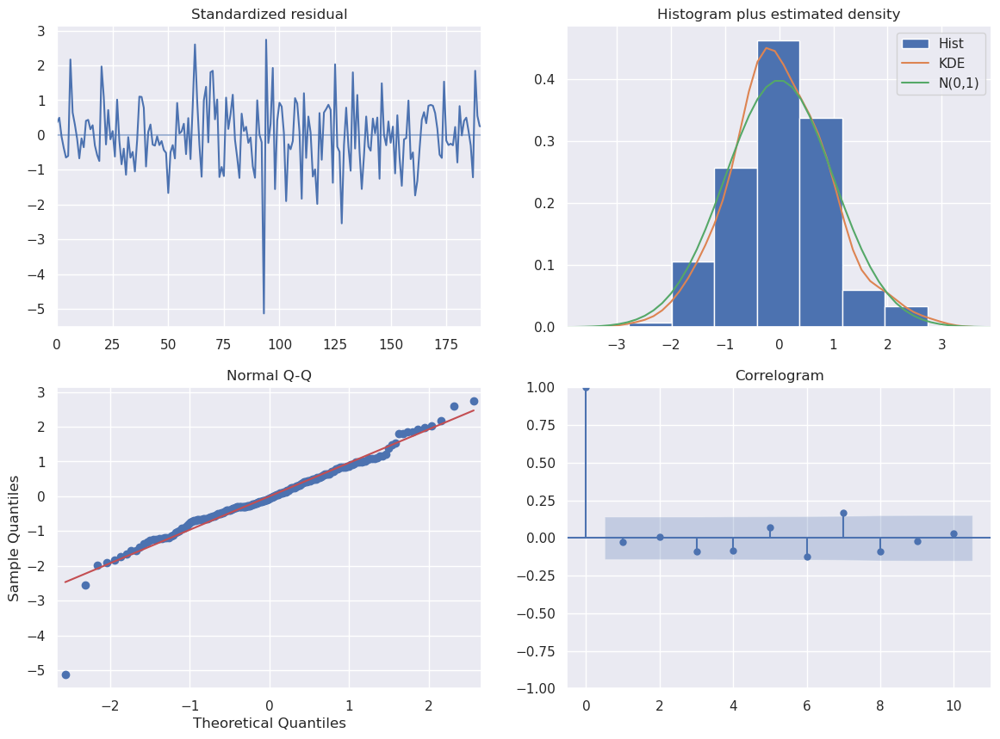

In [54]:
model_days_2.plot_diagnostics(figsize=(14,10))
plt.show()

Above there is a diagnostics of a model in plots. The correlogram shows only one significant correlation in the residuals, so here we should think if all the data was captured by the model. Standardized residuals plot shows that there is no obvious pattern, so model should work correctly. The histogram with estimated density says that there are small differences between residuals distribution and normal distribution, qq-plot confirms it. The plots are really similar to the previous model.

Now, forecasting.

In [55]:
forecast_days_arima_2 = model_days_2.predict(n_periods=len(test_day_arima_2))
forecast_days_arima_2 = pd.DataFrame(forecast_days_arima_2, index = test_day_arima_2.index, columns=['Predicted'])

Below there is time series plot with train, test (actual values) and predicted.

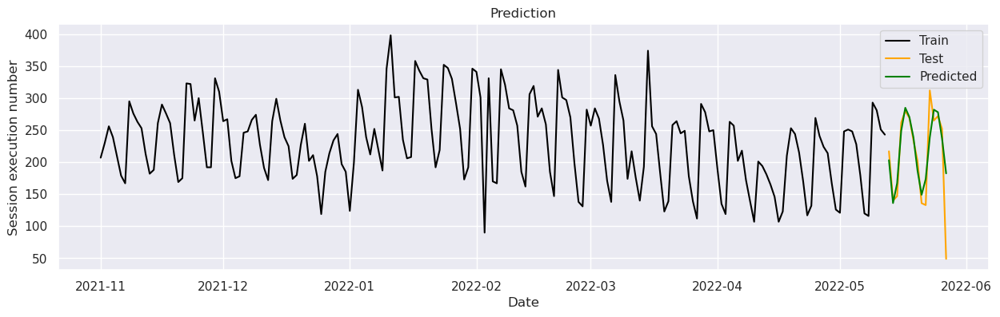

In [56]:
prediction_plot(train_day_arima_2, test_day_arima_2, forecast_days_arima_2)

Below there are evaluation metrics.

In [57]:
eval_metrics(test_day_arima_2['number_of_sessions'], forecast_days_arima_2['Predicted'])

RMSE: 42.13 
 MSE: 1774.924, 
 MAE: 25.062, 
 MAPE: 0.26, 
 SMAPE: 0.154.


All of the evaluation metrics say that thin model is worse than the previous one.

### Holt-Winters Exponential Smoothing on non-stationary data

In [58]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

Here, we will use the same testing and training set as in ARIMA model.

In [59]:
model_days_holt_1 = ExponentialSmoothing(train_day_arima['number_of_sessions'], seasonal='add',seasonal_periods=7).fit()

In [60]:
model_days_holt_1.summary()

Dep. Variable:,number_of_sessions,No. Observations:,177
Model:,ExponentialSmoothing,SSE,191088.683
Optimized:,True,AIC,1254.229
Trend:,None,BIC,1282.814
Seasonal:,Additive,AICC,1255.829
Seasonal Periods:,7,Date:,"Wed, 10 May 2023"
Box-Cox:,False,Time:,09:56:07
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.2404607,alpha,True
smoothing_seasonal,0.0058359,gamma,True


In [61]:
holt_pred_1 = pd.DataFrame(model_days_holt_1.forecast(31), columns = ['Predicted'])

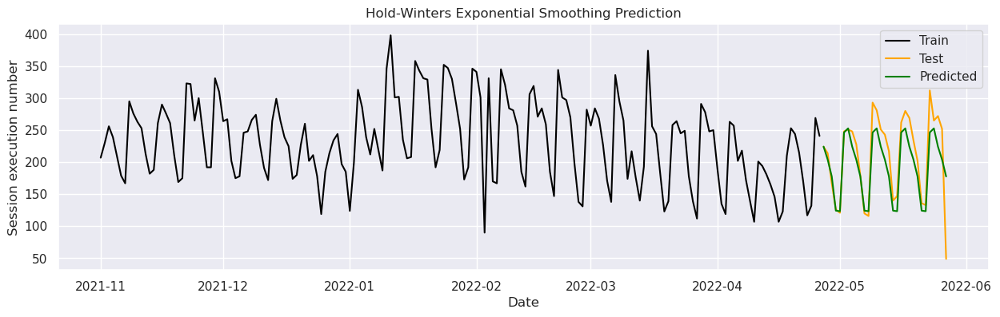

In [62]:
prediction_plot(train_day_arima, test_day_arima, holt_pred_1, plt_title = 'Hold-Winters Exponential Smoothing Prediction')

Below there are evaluation metrics for the predictions.

In [63]:
eval_metrics(test_day_arima['number_of_sessions'], holt_pred_1['Predicted'])

RMSE: 35.584 
 MSE: 1266.209, 
 MAE: 24.937, 
 MAPE: 0.175, 
 SMAPE: 0.133.


The values are better for every metric than in the ARIMA(5,1,2) model. So we can assume, that this model is better for this dataset.

### Making data stationary

#### Usually differenced data

For another models we need to make the data as a stationary series. We will difference the data and check for the stationarity. If needed, it will be done again.

In [64]:
sessions_a_day_i_diff = pd.DataFrame(np.diff(sessions_a_day_i['number_of_sessions'], n = 1), columns = ['Differenced'])

In [65]:
sessions_a_day_i_diff.set_index(sessions_a_day_i[1:209].index, inplace = True)

ADF Statistic: -5.349
p-value: 0.0
Critical Values:
Critical Values Over 1%: -3.465
Critical Values Over 5%: -2.877
Critical Values Over 10%: -2.575


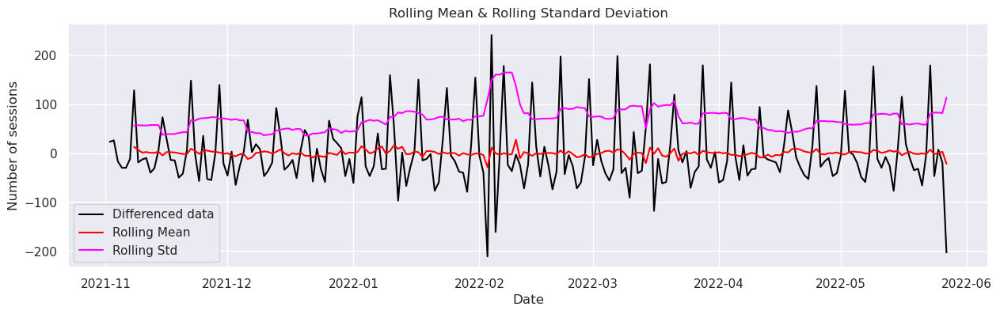

In [66]:
check_stationarity(sessions_a_day_i_diff, data_label = 'Differenced data')

The data is in fact stationary after one differencing (p-val of ADF test is <0.05 and statistic is lower than critical values). The rolling mean is close to constant, rolling standard deviation is still not constant.

In [67]:
check_stationarity_trend(sessions_a_day_i_diff)

KPSS Statistic: 0.14
p-value: 0.062
Critical Values:
Critical Values Over 10%: 0.119
Critical Values Over 5%: 0.146
Critical Values Over 2.5%: 0.176
Critical Values Over 1%: 0.216


Now, by the KPSS p-value we know that the trend is stationary.

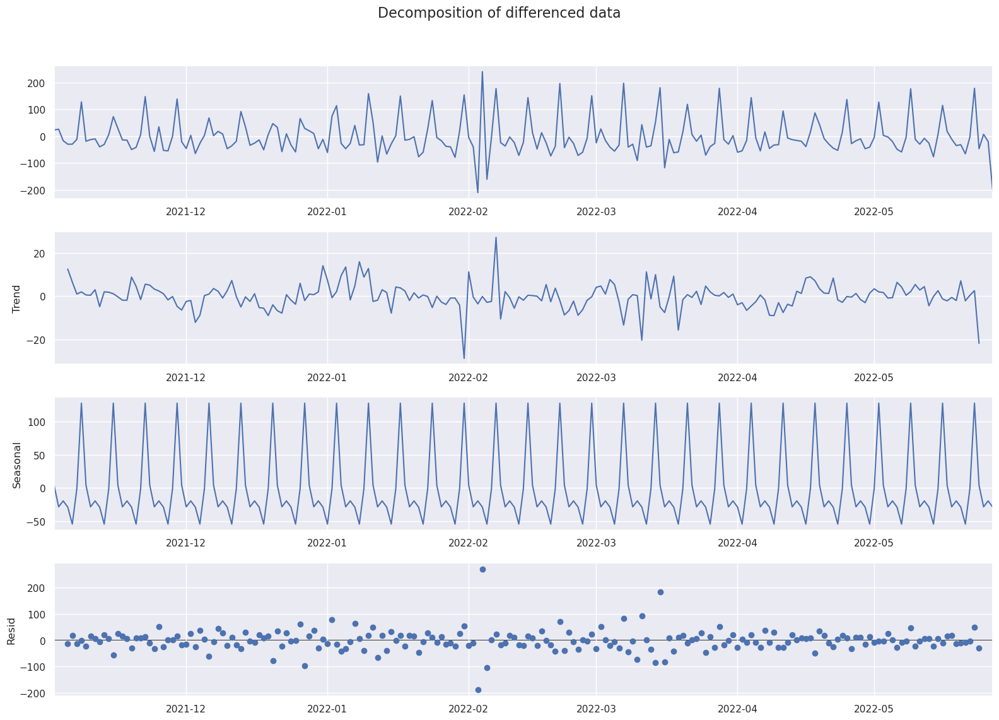

In [68]:
decomposition_diff = seasonal_decompose(sessions_a_day_i_diff, period=7)
plt.rcParams.update({'figure.figsize': (16,12)})
decomposition_diff.plot().suptitle('Decomposition of differenced data', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

We still have weekly seasonality

<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

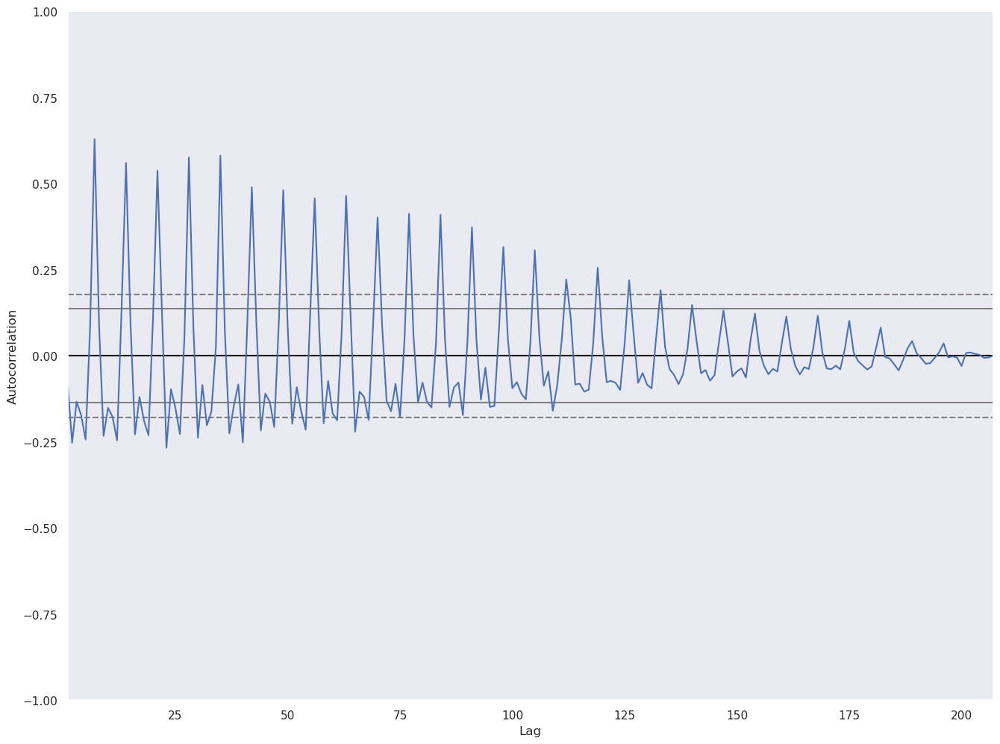

In [69]:
autocorrelation_plot(sessions_a_day_i_diff)

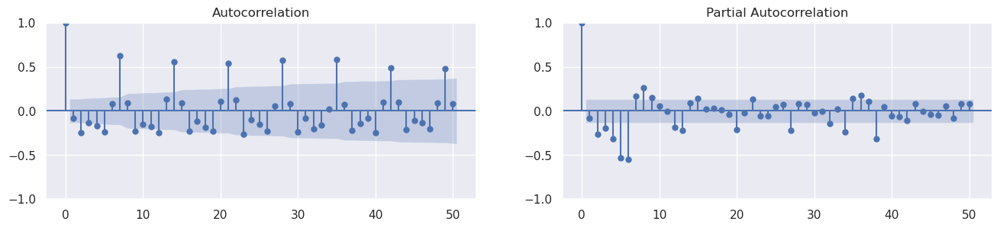

In [70]:
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(sessions_a_day_i_diff['Differenced'].tolist(), lags=50, ax=axes[0]);
plot_pacf(sessions_a_day_i_diff['Differenced'].tolist(), lags=50, ax=axes[1]);

#### Seasonal differencing - weekly

Now, we'll check with seasonal differencing (7 days - weekly).

In [71]:
sessions_a_day_i_diff_7 = pd.DataFrame(np.diff(sessions_a_day_i['number_of_sessions'], n = 7), columns = ['Differenced'])
sessions_a_day_i_diff_7.set_index(sessions_a_day_i[7:209].index, inplace = True)


ADF Statistic: -16.099
p-value: 0.0
Critical Values:
Critical Values Over 1%: -3.466
Critical Values Over 5%: -2.877
Critical Values Over 10%: -2.575


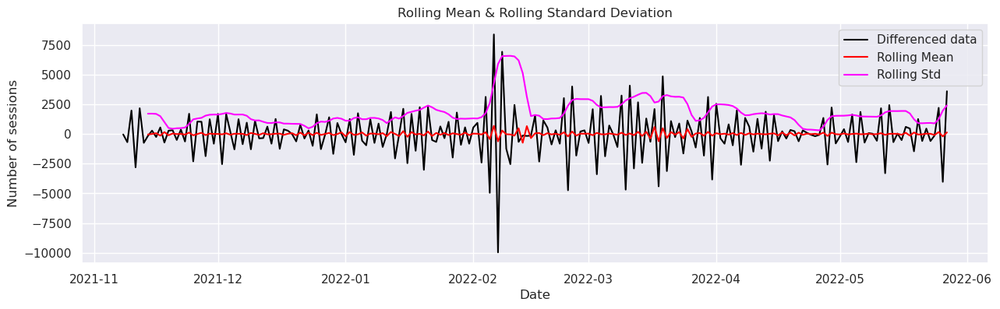

In [72]:
check_stationarity(sessions_a_day_i_diff_7, data_label = 'Differenced data')

In [73]:
check_stationarity_trend(sessions_a_day_i_diff_7)

KPSS Statistic: 0.077
p-value: 0.1
Critical Values:
Critical Values Over 10%: 0.119
Critical Values Over 5%: 0.146
Critical Values Over 2.5%: 0.176
Critical Values Over 1%: 0.216


Both statistics say that the data is already stationary. The rolling mean is constant, but the rolling standard deviation is bigger than in the usual differencing.

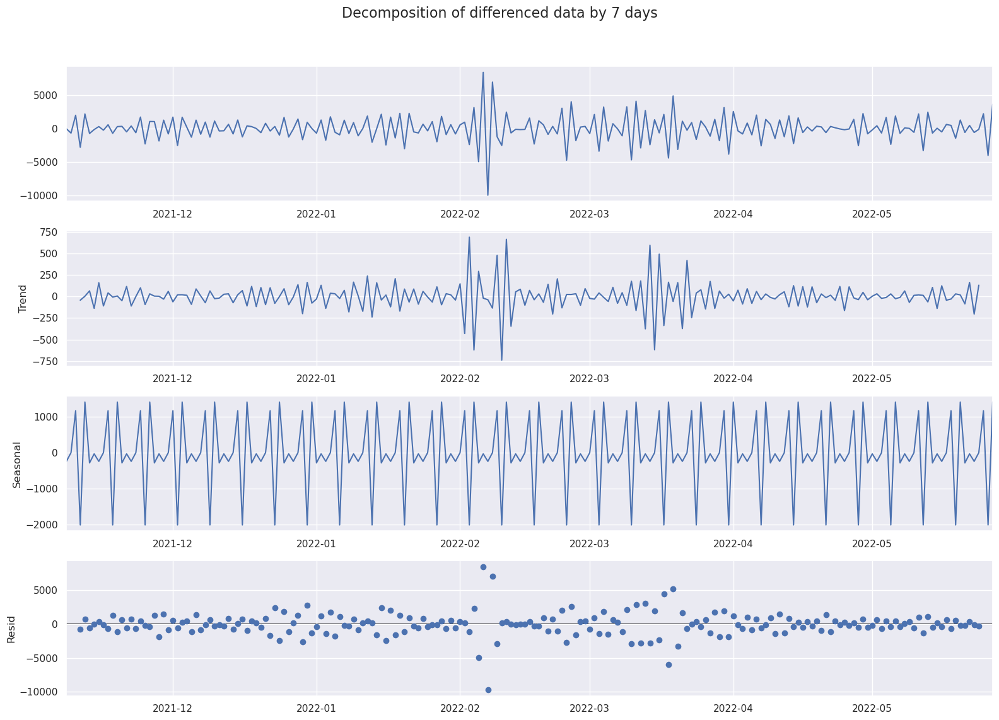

In [74]:
decomposition_diff_7 = seasonal_decompose(sessions_a_day_i_diff_7, period=7)
plt.rcParams.update({'figure.figsize': (16,12)})
decomposition_diff_7.plot().suptitle('Decomposition of differenced data by 7 days', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### Log transform and differencing

Here, we'll first do log transforming and later differencing.

In [75]:
sessions_a_day_i_log_diff = pd.DataFrame(np.log(sessions_a_day_i['number_of_sessions']).diff(), index = sessions_a_day_i[1:209].index)

sessions_a_day_i_log_diff.rename(columns = {'number_of_sessions': 'Differenced'},
                                 inplace = True)

In [76]:
trial = sessions_a_day_i['number_of_sessions'].diff()

In [77]:
trial.iloc[0] = sessions_a_day_i['number_of_sessions'].iloc[0]

In [78]:
trial.cumsum()

date_session_execution
2021-11-01   207.00
2021-11-02   230.00
2021-11-03   256.00
2021-11-04   239.00
2021-11-05   209.00
              ...  
2022-05-23   312.00
2022-05-24   265.00
2022-05-25   272.00
2022-05-26   252.00
2022-05-27    49.00
Name: number_of_sessions, Length: 208, dtype: float64

In [79]:
sessions_a_day_i_log_diff

,Differenced
date_session_execution,
2021-11-02,0.11
2021-11-03,0.11
2021-11-04,-0.07
2021-11-05,-0.13
2021-11-06,-0.15
...,...
2022-05-23,0.85
2022-05-24,-0.16
2022-05-25,0.03


In [80]:
sessions_a_day_i_log_diff_inv = sessions_a_day_i_log_diff.cumsum()

In [81]:
sessions_a_day_i_log_diff_inv = np.exp(sessions_a_day_i_log_diff_inv)

In [82]:
sessions_a_day_i_log_diff_inv

,Differenced
date_session_execution,
2021-11-02,1.11
2021-11-03,1.24
2021-11-04,1.15
2021-11-05,1.01
2021-11-06,0.86
...,...
2022-05-23,1.51
2022-05-24,1.28
2022-05-25,1.31


ADF Statistic: -5.016
p-value: 0.0
Critical Values:
Critical Values Over 1%: -3.465
Critical Values Over 5%: -2.877
Critical Values Over 10%: -2.575


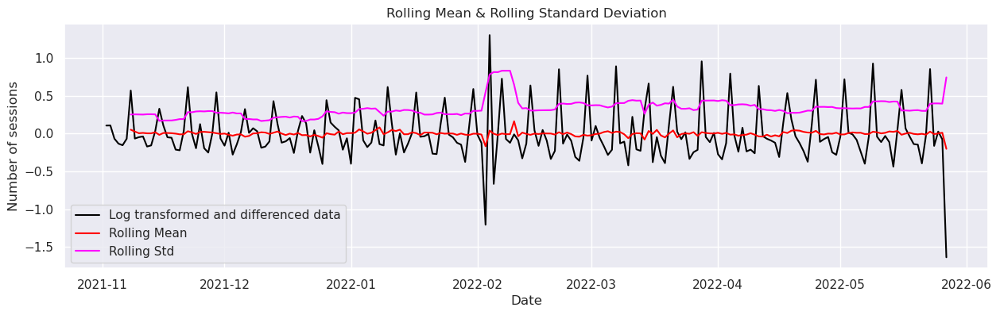

In [83]:
check_stationarity(sessions_a_day_i_log_diff.dropna(), data_label = 'Log transformed and differenced data')

In [84]:
check_stationarity_trend(sessions_a_day_i_log_diff.dropna())

KPSS Statistic: 0.115
p-value: 0.1
Critical Values:
Critical Values Over 10%: 0.119
Critical Values Over 5%: 0.146
Critical Values Over 2.5%: 0.176
Critical Values Over 1%: 0.216


Both statistics say that the data is already stationary. The rolling mean is close to constant, but the rolling standard deviation is for sure not stationary.

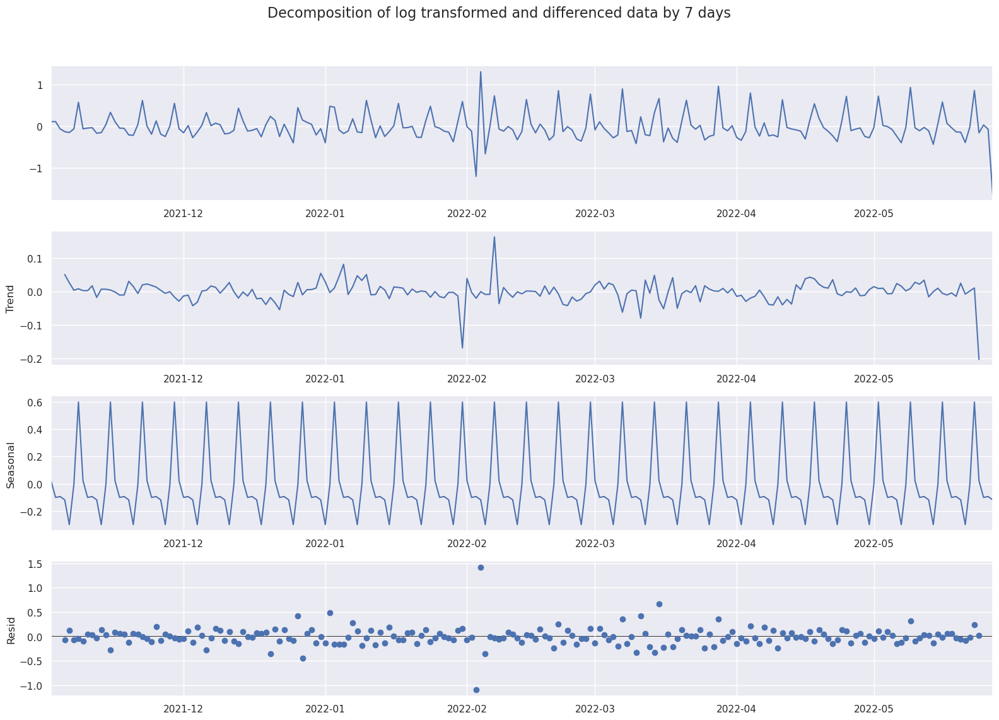

In [85]:
decomposition_log_diff = seasonal_decompose(sessions_a_day_i_log_diff.dropna(), period=7)
plt.rcParams.update({'figure.figsize': (16,12)})
decomposition_log_diff.plot().suptitle('Decomposition of log transformed and differenced data by 7 days', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [86]:
sessions_a_day_i_log_diff_no_na = sessions_a_day_i_log_diff.dropna()

### Usually differenced data

#### ARMA

We'll try to fit the auto arima function and set d = 0, to get the proper parameters on ARMA model.

We'll split the data into training (85%) and test set (15%).

In [87]:
train_day_arma_1 = sessions_a_day_i_diff[sessions_a_day_i_diff.index < pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

test_day_arma_1 = sessions_a_day_i_diff[sessions_a_day_i_diff.index >= pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

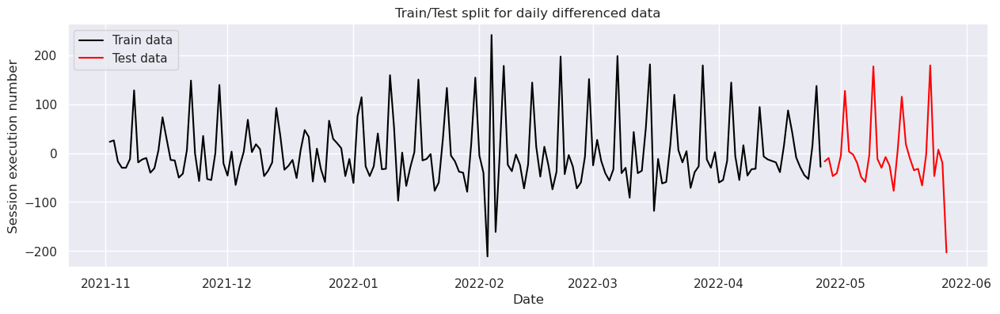

In [88]:
test_train_split_plot(train_day_arma_1, test_day_arma_1, plt_title = 'Train/Test split for daily differenced data')

In [89]:
model_days_arma_1 = auto_arima(train_day_arma_1, d= 0, trace=True, error_action='ignore', suppress_warnings=True)
model_days_arma_1.fit(train_day_arma_1)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1891.145, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1990.654, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1990.682, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1960.408, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1988.655, Time=0.00 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1930.435, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1921.954, Time=0.10 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1882.165, Time=0.31 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1916.127, Time=0.12 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=1842.769, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=1897.893, Time=0.19 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=1805.132, Time=0.33 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=1854.910, Time=0.20 sec
 ARIMA(5,0,3)(0,0,0)[0] intercept   : AIC=1813.214, Time=0.38 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept

ARIMA(order=(5, 0, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

The best model for usually differenced data is ARMA(5,2) which is equivalent to ARIMA(5,1,2) for original data.

In [90]:
model_days_arma_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  176
Model:               SARIMAX(5, 0, 2)   Log Likelihood                -893.420
Date:                Wed, 10 May 2023   AIC                           1802.840
Time:                        09:56:19   BIC                           1828.204
Sample:                             0   HQIC                          1813.127
                                - 176                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2139      0.078      2.734      0.006       0.061       0.367
ar.L2         -0.6821      0.092     -7.436      0.000      -0.862      -0.502
ar.L3         -0.3101      0.101     -3.083      0.002      -0.507      -0.113
ar.L4         -0.3570      0.062     -5.748      0.000      -0.479      -0.235
ar.L5         -0.4867      0.066     -7.321      0.000      -0.617      -0.356
ma.L1         -1.1203      0.057    -19.773      0.000      -1.231      -1.009
ma.L2          0.8459      0.061     13.903      0.000       0.727       0.965
sigma2      1574.0455    150.837     10.435      0.000    1278.411    1869.680
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):               100.05
Prob(Q):                              0.79   Prob(JB):                         0.00
Heteroskedasticity (H):               1.81   Skew:                            -0.57
Prob(H) (two-sided):                  0.02   Kurtosis:                         6.51
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

According to the model summary, the model meets the condition of independence in the residuals (no correlation) because the p-value of the Ljung-Box test (Prob(Q)) is greater than 0.05. On the other hand, we cannot say that the residual distribution is homoscedastic (has constant variance) because the p-value of the Heteroskedasticity test (Prob(H)) is smaller than 0.05. The summary of this model is slightly different from the ARIMA(5,1,2).

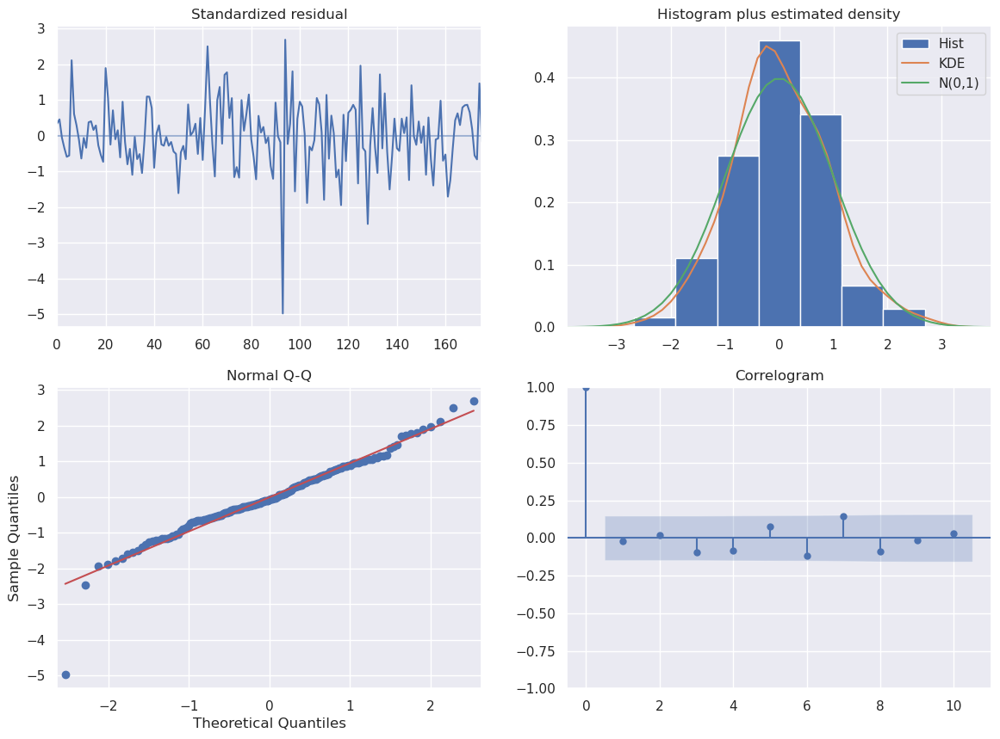

In [91]:
model_days_arma_1.plot_diagnostics(figsize=(14,10))
plt.show()

Residual plots are similar to to the ARIMA(5,1,2) model. The conclusions are the same.

Now, let's get to the forecasting.

In [92]:
forecast_days_arma_1 = model_days_arma_1.predict(n_periods=len(test_day_arma_1))
forecast_days_arma_1 = pd.DataFrame(forecast_days_arma_1, index = test_day_arma_1.index, columns=['Predicted'])

In [93]:
arma_day_results_1 = pd.concat([test_day_arma_1, forecast_days_arma_1], axis = 1)
arma_day_results_1.rename(columns = {'number_of_sessions': 'Actual'},
                         inplace = True)

Below there is time series plot with train, test (differenced actual values) and predicted.

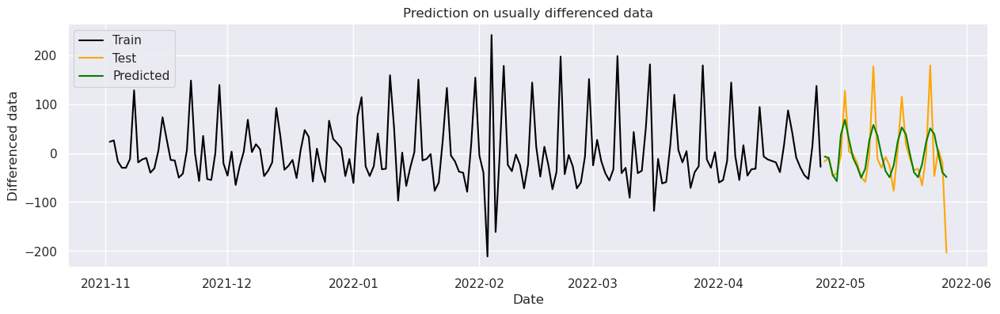

In [94]:
prediction_plot(train_day_arma_1, test_day_arma_1, forecast_days_arma_1, plt_title = 'Prediction on usually differenced data', y_lab = 'Differenced data')

Now we will calculate RMSE. 

In [95]:
eval_metrics(test_day_arma_1['Differenced'], forecast_days_arma_1['Predicted'])

RMSE: 52.355 
 MSE: 2741.071, 
 MAE: 36.158, 
 MAPE: 1.931, 
 SMAPE: 1.013.


The error is much bigger than in ARIMA(5,1,2) model, so after differencing, the forecasts are less accurate.  Now we will calculate SMAPE (Symmetric Mean Absolute Error).

SMAPE value is very big. It says that there is huge relative difference between forecasts and differenced actual values.

Now, we'll try undifferencing the forecast data.

In [96]:
test_day_arma_undiff = test_day_arima.copy() # this is undifferenced data
forecast_days_arma_1_undiff = forecast_days_arma_1.copy()

forecast_days_arma_1_undiff['Predicted'].iloc[0] = test_day_arma_undiff['number_of_sessions'].iloc[0]

forecast_days_arma_1_undiff = forecast_days_arma_1_undiff.cumsum()

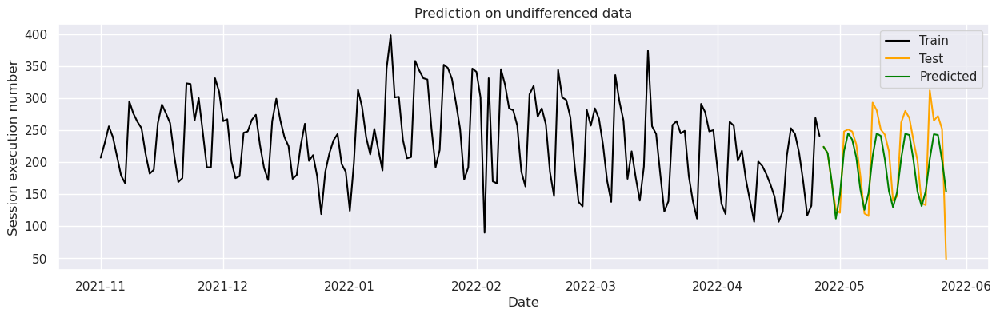

In [97]:
prediction_plot(train_day_arima, test_day_arma_undiff, forecast_days_arma_1_undiff, plt_title = 'Prediction on undifferenced data')


In [98]:
print("SMAPE: ", calcsmape(test_day_arma_undiff['number_of_sessions'], forecast_days_arma_1_undiff['Predicted']))

SMAPE:  0.1664


In [99]:
eval_metrics(test_day_arma_undiff['number_of_sessions'], forecast_days_arma_1_undiff['Predicted'])

RMSE: 41.487 
 MSE: 1721.145, 
 MAE: 30.967, 
 MAPE: 0.194, 
 SMAPE: 0.166.


Now, after undifferencing the forecast data, the RMSE is smaller and SMAPE decreased to 16.6%.

In [100]:
series = sessions_a_day_i['number_of_sessions']
new_series = np.log(series).diff()
# getting only the value of zeroth index since the diff() operation looses first value.
new_series.iloc[0] = np.log(series.iloc[0])
result = np.exp(new_series.cumsum())

In [101]:
pd.DataFrame(result)

,number_of_sessions
date_session_execution,
2021-11-01,207.00
2021-11-02,230.00
2021-11-03,256.00
2021-11-04,239.00
2021-11-05,209.00
...,...
2022-05-23,312.00
2022-05-24,265.00
2022-05-25,272.00


#### Simple Exponential Smoothing

In [102]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing  

Here, we will use the same testing and training set as in ARMA model.

In [103]:
m = 7
alpha = 1/(2*m)

In [104]:
model_days_exp_1 = SimpleExpSmoothing(train_day_arma_1['Differenced']).fit(smoothing_level=alpha,optimized=False,use_brute=True)


In [105]:
model_days_exp_1.summary()

Dep. Variable:,Differenced,No. Observations:,176
Model:,SimpleExpSmoothing,SSE,885242.386
Optimized:,False,AIC,1504.071
Trend:,None,BIC,1510.412
Seasonal:,None,AICC,1504.305
Seasonal Periods:,None,Date:,"Wed, 10 May 2023"
Box-Cox:,False,Time:,09:56:22
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.0714286,alpha,False
initial_level,23.000000,l.0,False


In [106]:
exp_pred_1 = pd.DataFrame(model_days_exp_1.forecast(31), columns = ['Predicted'])

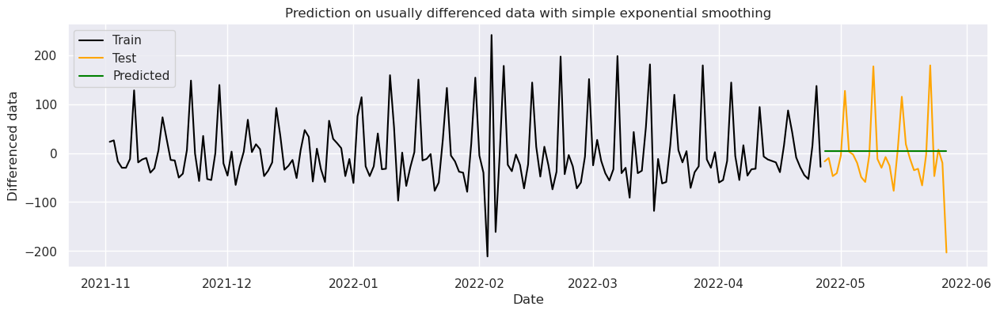

In [107]:
prediction_plot(train_day_arma_1, test_day_arma_1, exp_pred_1, plt_title = 'Prediction on usually differenced data with simple exponential smoothing', y_lab = 'Differenced data')

In [108]:
eval_metrics(test_day_arma_1['Differenced'], exp_pred_1['Predicted'])

RMSE: 72.706 
 MSE: 5286.163, 
 MAE: 48.862, 
 MAPE: 1.163, 
 SMAPE: 1.818.


The values are very big, so we will undifference the data and do it again.

In [109]:
test_day_arma_undiff = test_day_arima.copy() # this is undifferenced data
forecast_days_exp_1_undiff = exp_pred_1.copy()

forecast_days_exp_1_undiff['Predicted'].iloc[0] = test_day_arma_undiff['number_of_sessions'].iloc[0]

forecast_days_exp_1_undiff = forecast_days_exp_1_undiff.cumsum()

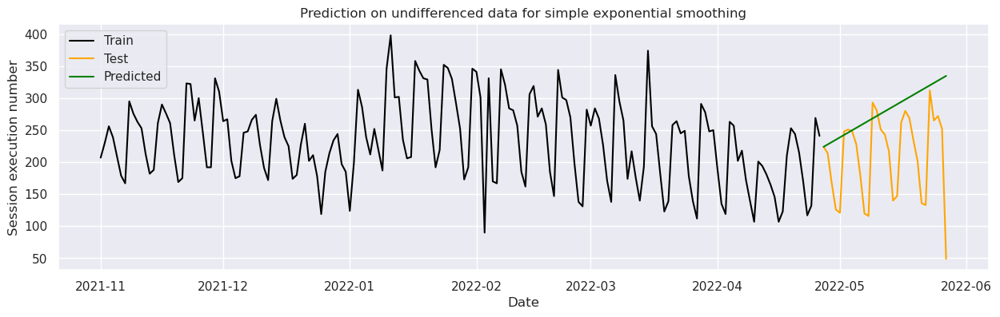

In [110]:
prediction_plot(train_day_arima, test_day_arma_undiff, forecast_days_exp_1_undiff, plt_title = 'Prediction on undifferenced data for simple exponential smoothing')


In [111]:
eval_metrics(test_day_arma_undiff['number_of_sessions'], forecast_days_exp_1_undiff['Predicted'])

RMSE: 99.354 
 MSE: 9871.239, 
 MAE: 73.167, 
 MAPE: 0.595, 
 SMAPE: 0.335.


The values are even worse for a few factors. For MAPE and SMAPE it improved. For this approach this model is not suitable. 

### Log transform and usual differencing

#### ARMA

We'll try to fit the auto arima function and set d = 0, to get the proper parameters on ARMA model.

We'll split the data into training (85%) and test set (15%).

In [112]:
train_day_arma_2 =sessions_a_day_i_log_diff[sessions_a_day_i_log_diff.index < pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

test_day_arma_2 = sessions_a_day_i_log_diff[sessions_a_day_i_log_diff.index >= pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

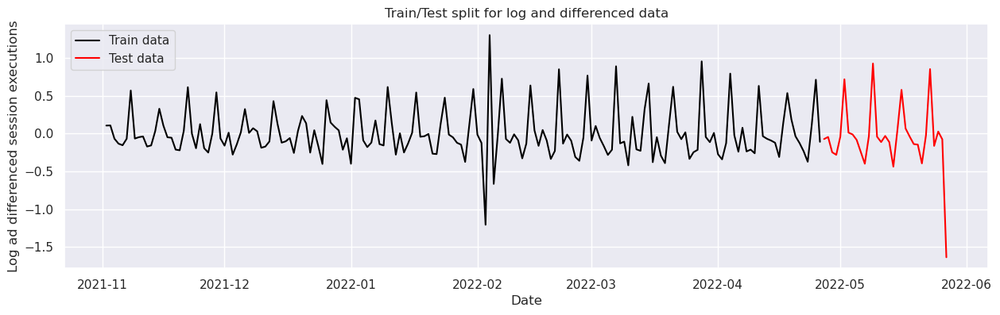

In [113]:
test_train_split_plot(train_day_arma_2, test_day_arma_2, plt_title = 'Train/Test split for log and differenced data', y_lab = 'Log ad differenced session executions')

In [114]:
model_days_arma_2 = auto_arima(train_day_arma_2, d= 0, trace=True, error_action='ignore', suppress_warnings=True)
model_days_arma_2.fit(train_day_arma_2)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=10.573, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=103.812, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=103.102, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=68.606, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101.813, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=41.292, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=33.448, Time=0.14 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=-1.482, Time=0.31 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=27.540, Time=0.18 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=-32.386, Time=0.37 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=10.055, Time=0.20 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=-75.411, Time=0.37 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=-26.912, Time=0.18 sec
 ARIMA(5,0,3)(0,0,0)[0] intercept   : AIC=-77.185, Time=0.37 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=-62.789, Tim

ARIMA(order=(5, 0, 3), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

The best model for usually differenced data is ARMA(5,2).

In [115]:
model_days_arma_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  176
Model:               SARIMAX(5, 0, 3)   Log Likelihood                  48.399
Date:                Wed, 10 May 2023   AIC                            -78.797
Time:                        09:56:30   BIC                            -50.263
Sample:                             0   HQIC                           -67.224
                                - 176                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2576      0.204      1.261      0.207      -0.143       0.658
ar.L2         -0.6771      0.135     -5.032      0.000      -0.941      -0.413
ar.L3         -0.2824      0.150     -1.886      0.059      -0.576       0.011
ar.L4         -0.3666      0.060     -6.139      0.000      -0.484      -0.250
ar.L5         -0.4340      0.123     -3.519      0.000      -0.676      -0.192
ma.L1         -1.2101      0.213     -5.691      0.000      -1.627      -0.793
ma.L2          0.9072      0.274      3.315      0.001       0.371       1.444
ma.L3         -0.0387      0.198     -0.196      0.845      -0.426       0.349
sigma2         0.0329      0.002     14.431      0.000       0.028       0.037
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               524.39
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               2.20   Skew:                            -1.45
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.95
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

According to the model summary, the model meets the condition of independence in the residuals (no correlation) because the p-value of the Ljung-Box test (Prob(Q)) is greater than 0.05. On the other hand, we cannot say that the residual distribution is homoscedastic (has constant variance) because the p-value of the Heteroskedasticity test (Prob(H)) is smaller than 0.05. 

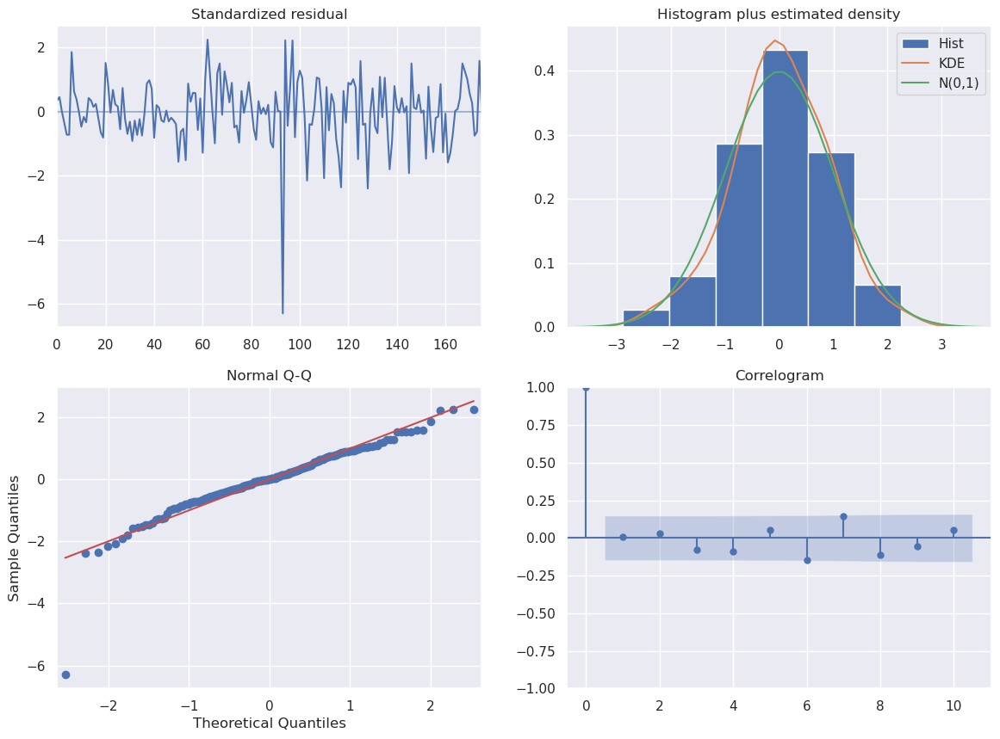

In [116]:
model_days_arma_2.plot_diagnostics(figsize=(14,10))
plt.show()

Above there is a diagnostics of a model in plots. The correlogram shows no significant correlations in the residuals, so here all of the data was captured by the model. Standardized residuals plot shows that there is no obvious pattern, so model should work correctly. The histogram with estimated density says that there are a little differences between residuals distribution and normal distribution, qq-plot confirms it but it has some outliers. 

Now, let's get to the forecasting.

In [117]:
forecast_days_arma_2 = model_days_arma_2.predict(n_periods=len(test_day_arma_2))
forecast_days_arma_2 = pd.DataFrame(forecast_days_arma_2, index = test_day_arma_2.index, columns=['Predicted'])

In [118]:
arma_day_results_2 = pd.concat([test_day_arma_2, forecast_days_arma_2], axis = 1)
arma_day_results_2.rename(columns = {'number_of_sessions': 'Actual'},
                         inplace = True)

Below there is time series plot with train, test (differenced actual values) and predicted.

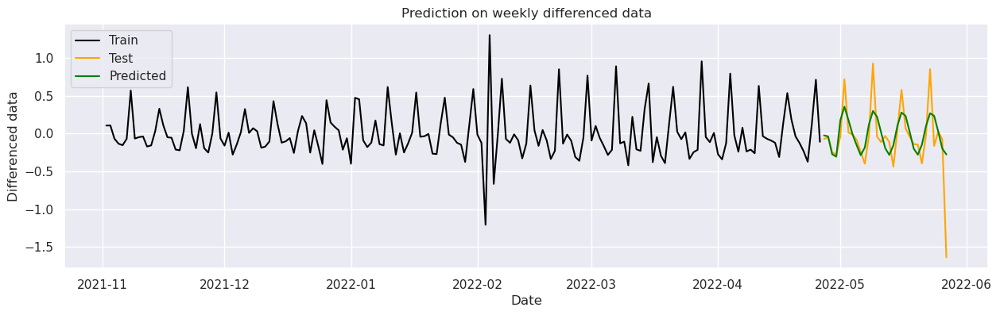

In [119]:
prediction_plot(train_day_arma_2, test_day_arma_2, forecast_days_arma_2, plt_title = 'Prediction on weekly differenced data', y_lab = 'Differenced data')

Now we will evaluate predictions.

In [120]:
eval_metrics(test_day_arma_2['Differenced'], forecast_days_arma_2['Predicted'])

RMSE: 0.335 
 MSE: 0.113, 
 MAE: 0.212, 
 MAPE: 1.952, 
 SMAPE: 1.011.


RMSE, MSE and MAE are not too big. But the values are not big, that's why. 

SMAPE value is very big according to the . It says that there is huge relative difference between forecasts and differenced actual values.

Now, we'll try undifferencing and exponating the forecast data.

In [121]:
test_day_arma_undiff = test_day_arima.copy() # this is undifferenced data
forecast_days_arma_2_undiff = forecast_days_arma_2.copy()

forecast_days_arma_2_undiff['Predicted'].iloc[0] = np.log(test_day_arma_undiff['number_of_sessions'].iloc[0])

In [122]:
forecast_days_arma_2_undiff['Predicted'] = np.exp(forecast_days_arma_2_undiff['Predicted'].cumsum())

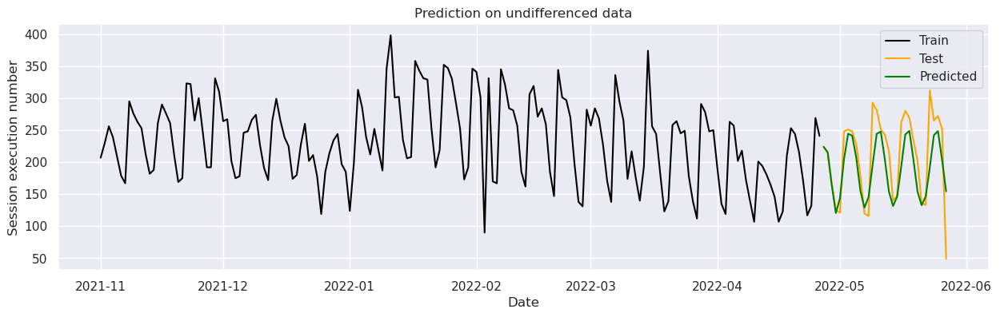

In [123]:
prediction_plot(train_day_arima, test_day_arma_undiff, forecast_days_arma_2_undiff, plt_title = 'Prediction on undifferenced data')

In [124]:
eval_metrics(test_day_arma_undiff['number_of_sessions'], forecast_days_arma_1_undiff['Predicted'])

RMSE: 41.487 
 MSE: 1721.145, 
 MAE: 30.967, 
 MAPE: 0.194, 
 SMAPE: 0.166.


The evaluation metrics are much better than before differencing. MAPE is 19% and SMAPE is almost 17%, which is not that bad. 

#### Simple Exponential Smoothing

In [125]:
m = 7
alpha = 1/(2*m)

In [126]:
model_days_exp_2 = SimpleExpSmoothing(train_day_arma_2['Differenced']).fit(smoothing_level=alpha,optimized=False,use_brute=True)


In [127]:
model_days_exp_2.summary()

Dep. Variable:,Differenced,No. Observations:,176
Model:,SimpleExpSmoothing,SSE,19.548
Optimized:,False,AIC,-382.776
Trend:,None,BIC,-376.435
Seasonal:,None,AICC,-382.542
Seasonal Periods:,None,Date:,"Wed, 10 May 2023"
Box-Cox:,False,Time:,09:56:32
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.0714286,alpha,False
initial_level,0.1053605,l.0,False


In [128]:
exp_pred_2 = pd.DataFrame(model_days_exp_2.forecast(31), columns = ['Predicted'])

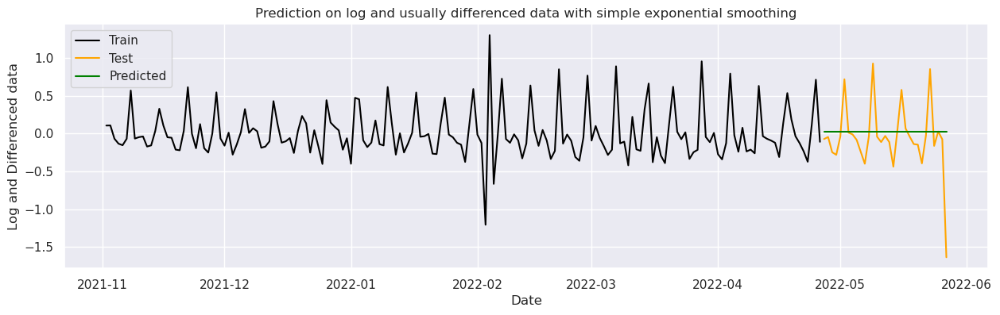

In [129]:
prediction_plot(train_day_arma_2, test_day_arma_2, exp_pred_2, plt_title = 'Prediction on log and usually differenced data with simple exponential smoothing', y_lab = 'Log and Differenced data')

In [130]:
eval_metrics(test_day_arma_2['Differenced'], exp_pred_2['Predicted'])

RMSE: 0.441 
 MSE: 0.195, 
 MAE: 0.27, 
 MAPE: 1.191, 
 SMAPE: 1.813.


We will check the metrics again after exponating and undifferencing the forecasts.

In [131]:
test_day_exp_undiff = test_day_arima.copy() # this is undifferenced data
forecast_days_exp_2_undiff = exp_pred_2.copy()

forecast_days_exp_2_undiff['Predicted'].iloc[0] = np.log(test_day_exp_undiff['number_of_sessions'].iloc[0])

In [132]:
forecast_days_exp_2_undiff['Predicted'] = np.exp(forecast_days_exp_2_undiff['Predicted'].cumsum())

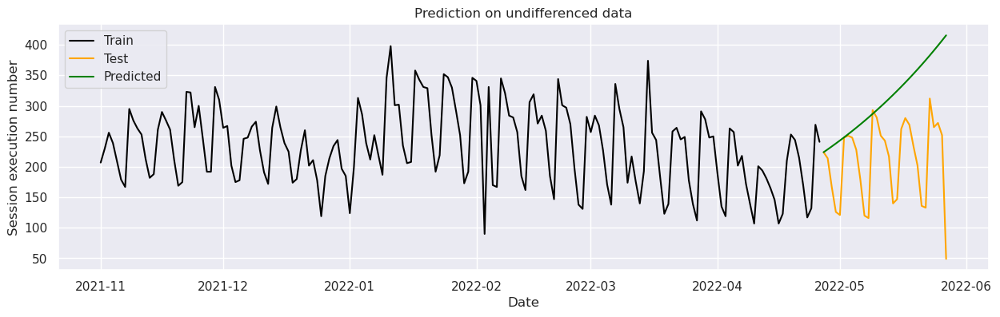

In [133]:
prediction_plot(train_day_arima, test_day_arma_undiff, forecast_days_exp_2_undiff, plt_title = 'Prediction on undifferenced data')

In [134]:
eval_metrics(test_day_arma_undiff['number_of_sessions'], forecast_days_exp_2_undiff['Predicted'])

RMSE: 131.02 
 MSE: 17166.351, 
 MAE: 101.717, 
 MAPE: 0.776, 
 SMAPE: 0.412.


The MAPE is 78% so it's very big, and SMAPE is 41% - it is also very big. This model is not too good for this data.

### With demographic variables

#### Data preparation

Now we will prepare the data - add demographic variables:
* sum of users that were, for example, activity level set on very active, active, sedentary, body type set on thin, etc. 
* median value of numerical variables of users for each day.

The comments in the chunks are telling what is happening with data step by step.

In [135]:
# here we are selecting which demographic data to use

df_session_exe_copy_demo = df_session_exe_copy.loc[:, ['id_session_execution', 'date_session_execution',
                                                       'id_users', 'gender', 'height', 'weight', 
                                                       'activity_level', 'goal', 'body_type', 'body_fat', 
                                                       'newsletter_subscription', 
                                                       'notifications_setting', 'training_days_setting',
                                                       'BMI']]

In [136]:
# now we get dummies for categorical variables (to sum the numbers later)

df_session_exe_copy_demo_dummies = pd.get_dummies(df_session_exe_copy_demo, 
                                                  columns = ['gender', 'activity_level', 
                                                             'goal', 'body_type', 
                                                             'newsletter_subscription',
                                                             'notifications_setting', 
                                                             'training_days_setting'])

In [137]:
# that's how the dummies dataframe looks like
df_session_exe_copy_demo_dummies.sort_values(by = 'date_session_execution').head(10)

,id_session_execution,date_session_execution,id_users,height,weight,body_fat,BMI,gender_female,gender_male,activity_level_active,activity_level_sedentary,activity_level_very active,goal_antiaging,goal_gain,goal_lose,body_type_mid,body_type_strong,body_type_thin,newsletter_subscription_False,newsletter_subscription_True,notifications_setting_False,notifications_setting_True,training_days_setting_1.0,training_days_setting_2.0,training_days_setting_3.0,training_days_setting_4.0,training_days_setting_5.0,training_days_setting_6.0,training_days_setting_7.0
0,6132.00,2021-11-01,2273.00,163.00,66.00,15.00,24.84,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0
279284,6177.00,2021-11-01,1350.00,176.00,78.00,25.00,25.18,0,1,0,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,1,0,0
283194,6176.00,2021-11-01,2159.00,172.00,72.00,15.00,24.34,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
284039,6180.00,2021-11-01,7817.00,181.00,82.00,20.00,25.03,0,1,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0
284054,6186.00,2021-11-01,7817.00,181.00,82.00,20.00,25.03,0,1,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0
284145,6193.00,2021-11-01,2641.00,170.00,79.00,25.00,27.34,0,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
284189,6208.00,2021-11-01,2641.00,170.00,79.00,25.00,27.34,0,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
284237,6213.00,2021-11-01,2641.00,170.00,79.00,25.00,27.34,0,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
284727,6189.00,2021-11-01,6170.00,178.00,73.00,15.00,23.04,0,1,1,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0
284769,6172.00,2021-11-01,6170.00,178.00,73.00,15.00,23.04,0,1,1,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0


In [138]:
# now, we need to delete the duplicates of users each day, so if the user did a session two times in a day, 
# then only one row (about this user) will remain in the data

df_session_exe_copy_demo_dummies_one = df_session_exe_copy_demo_dummies.drop_duplicates(subset = ['date_session_execution', 'id_users'],
                                                 keep = 'first').reset_index(drop = True).sort_values(by = ['date_session_execution','id_users'])

In [139]:
df_session_exe_copy_demo_dummies_one.head()

,id_session_execution,date_session_execution,id_users,height,weight,body_fat,BMI,gender_female,gender_male,activity_level_active,activity_level_sedentary,activity_level_very active,goal_antiaging,goal_gain,goal_lose,body_type_mid,body_type_strong,body_type_thin,newsletter_subscription_False,newsletter_subscription_True,notifications_setting_False,notifications_setting_True,training_days_setting_1.0,training_days_setting_2.0,training_days_setting_3.0,training_days_setting_4.0,training_days_setting_5.0,training_days_setting_6.0,training_days_setting_7.0
12313,6121.00,2021-11-01,601.00,180.00,91.00,16.00,28.09,0,1,1,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,1,0,0
3990,6157.00,2021-11-01,603.00,156.00,60.00,25.00,24.65,1,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0
1499,6154.00,2021-11-01,644.00,157.00,50.00,20.00,20.28,1,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,0,1,0,0,0,0
11745,6078.00,2021-11-01,698.00,171.00,75.00,30.00,25.65,0,1,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0
1221,6146.00,2021-11-01,732.00,182.00,85.00,35.00,25.66,0,1,1,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0


In [140]:
# now we group data by date of session execution and numerical varaibles will get median and categorical 
# will be summed (to get the number of users with specific demographics, like how many people who worked out 
# that day were body type thin, etc.)

df_session_exe_copy_demo_dummies_user_once_a_day = df_session_exe_copy_demo_dummies_one.groupby('date_session_execution').aggregate({
    'height': 'median', 'weight': 'median', 'body_fat': 'median', 'BMI': 'median',
    'gender_female': 'sum', 'gender_male': 'sum',
       'activity_level_active': 'sum', 'activity_level_sedentary': 'sum',
       'activity_level_very active': 'sum', 'goal_antiaging': 'sum', 'goal_gain': 'sum',
       'goal_lose': 'sum', 'body_type_mid': 'sum', 'body_type_strong': 'sum', 'body_type_thin': 'sum',
       'newsletter_subscription_False': 'sum', 'newsletter_subscription_True': 'sum',
       'notifications_setting_False': 'sum', 'notifications_setting_True': 'sum',
       'training_days_setting_1.0': 'sum', 'training_days_setting_2.0': 'sum',
       'training_days_setting_3.0': 'sum', 'training_days_setting_4.0': 'sum',
       'training_days_setting_5.0': 'sum', 'training_days_setting_6.0': 'sum',
       'training_days_setting_7.0': 'sum'
})

In [141]:
# now we merge the number of sessions done in a day by all of the users with the demographic data

df_session_exe_copy_demo_dummies_user_once_a_day = sessions_a_day.merge(df_session_exe_copy_demo_dummies_user_once_a_day,
                                                                                                         how = 'inner', on = 'date_session_execution')

In [142]:
# and that's how the data looks like!

df_session_exe_copy_demo_dummies_user_once_a_day.head(15)

,date_session_execution,number_of_sessions,height,weight,body_fat,BMI,gender_female,gender_male,activity_level_active,activity_level_sedentary,activity_level_very active,goal_antiaging,goal_gain,goal_lose,body_type_mid,body_type_strong,body_type_thin,newsletter_subscription_False,newsletter_subscription_True,notifications_setting_False,notifications_setting_True,training_days_setting_1.0,training_days_setting_2.0,training_days_setting_3.0,training_days_setting_4.0,training_days_setting_5.0,training_days_setting_6.0,training_days_setting_7.0
0,2021-11-01,207,174.00,72.30,20.00,23.78,41,132,115,38,20,26,84,63,100,10,63,41,132,11,162,1,8,71,51,31,7,4
1,2021-11-02,230,175.00,72.00,20.00,23.50,49,153,136,38,28,31,120,51,105,16,81,42,160,8,194,3,13,73,57,40,10,6
2,2021-11-03,256,174.50,73.00,20.00,23.55,57,165,156,38,28,36,118,68,125,12,85,59,163,12,210,2,7,88,59,49,13,4
3,2021-11-04,239,176.00,72.00,20.00,23.34,39,181,148,40,32,38,124,58,116,16,88,52,168,6,214,4,8,90,58,43,10,7
4,2021-11-05,209,174.00,72.00,20.00,23.26,44,151,129,35,31,35,105,55,110,17,68,54,141,11,184,0,3,87,47,48,6,4
5,2021-11-06,179,175.00,74.00,20.00,23.55,36,115,100,36,15,27,79,45,83,14,54,39,112,12,139,2,8,60,32,35,9,5
6,2021-11-07,167,175.00,73.00,20.00,23.44,30,113,96,31,16,22,74,47,75,13,55,33,110,8,135,1,8,54,36,27,11,6
7,2021-11-08,295,174.00,72.00,20.00,23.67,59,212,168,51,52,50,137,84,145,21,105,79,192,12,259,3,10,114,67,58,11,8
8,2021-11-09,276,174.00,72.00,20.00,23.62,57,194,163,47,41,41,141,69,137,19,95,72,179,9,242,1,14,95,59,66,11,5
9,2021-11-10,263,174.00,72.00,20.00,23.70,66,182,168,42,38,38,124,86,129,23,96,59,189,7,241,2,16,102,57,53,10,8


#### ARIMAX with BMI and activity_level

In [300]:
def ARIMAX_try(df, var_to_be_predicted, exogenous_features, date_split = '2022-04-27',
               model_summary = True, plot_diagnostics = False, pred_plot = True,
               prediction_table = False, evaluate_metrics = True):
    
    # split of the data to train and test set
    train_set = df[df.index < pd.to_datetime(date_split, format = '%Y-%m-%d')]
    test_set = df[df.index >= pd.to_datetime(date_split, format = '%Y-%m-%d')]
    
    print('Fitting the model \n')
    
    # setting model and fitting it
    model = auto_arima(train_set[var_to_be_predicted], exogenous = train_set[exogenous_features],
                       trace=True, error_action='ignore', suppress_warnings=True)
    model.fit(train_set[var_to_be_predicted], exogenous = train_set[exogenous_features])
    
    if plot_diagnostics == True:
        print('\n Diagnostics plot \n')
        model.plot_diagnostics(figsize=(14,10))
        plt.show()
    
    forecast_model = model.predict(n_periods=len(test_set), exogenous = test_set[exogenous_features])
    forecast_model = pd.DataFrame(forecast_model, index = test_set.index, columns=['Predicted'])
    
    if pred_plot == True:
        print('\n Prediction plot \n')
        prediction_plot(train_set[var_to_be_predicted], 
                        test_set[var_to_be_predicted], 
                        forecast_model,
                        plt_title = 'Predictions with variables taken into consideration')

       
    if evaluate_metrics == True:
        print('\n EVALUATION METRICS \n')
        eval_metrics(test_set[var_to_be_predicted], forecast_model['Predicted'])
        
    if (prediction_table == False) and (model_summary == True):
        return model.summary()
    
    if (prediction_table == True) and (model_summary == True):
        return model.summary(), print('\n Prediction table \n'), pd.merge(test_set[var_to_be_predicted], forecast_model, on = 'date_session_execution').reset_index().rename(columns = {'date_session_execution': 'date',
                                                                        var_to_be_predicted: 'Actual'}).set_index('date')
    
    if (prediction_table == True) and (model_summary == False):
        return print('\n Prediction table \n'), pd.merge(test_set[var_to_be_predicted], forecast_model, on = 'date_session_execution').reset_index().rename(columns = {'date_session_execution': 'date',
                                                                        var_to_be_predicted: 'Actual'}).set_index('date')



Now, we will try with predictors BMI and activity_level. Then we will split it into training and testing sets.

In [265]:
day_BMI_act_lvl = df_session_exe_copy_demo_dummies_user_once_a_day.loc[:, ['date_session_execution', 
                                                                           'number_of_sessions', 'BMI',
                                                                           'activity_level_very active',
                                                                           'activity_level_active',
                                                                           'activity_level_sedentary']]

In [266]:
day_BMI_act_lvl.set_index('date_session_execution', inplace = True)

In [268]:
exogenous_features = ['BMI', 'activity_level_very active', 
                      'activity_level_active', 'activity_level_sedentary']

Fitting the model 

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1251.471, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1253.111, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1252.873, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1246.358, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1260.741, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1254.626, Time=0.26 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=1254.783, Time=0.22 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1254.122, Time=0.31 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1250.819, Time=0.21 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0] intercept
Total fit time: 2.107 seconds

 Diagnostics plot 



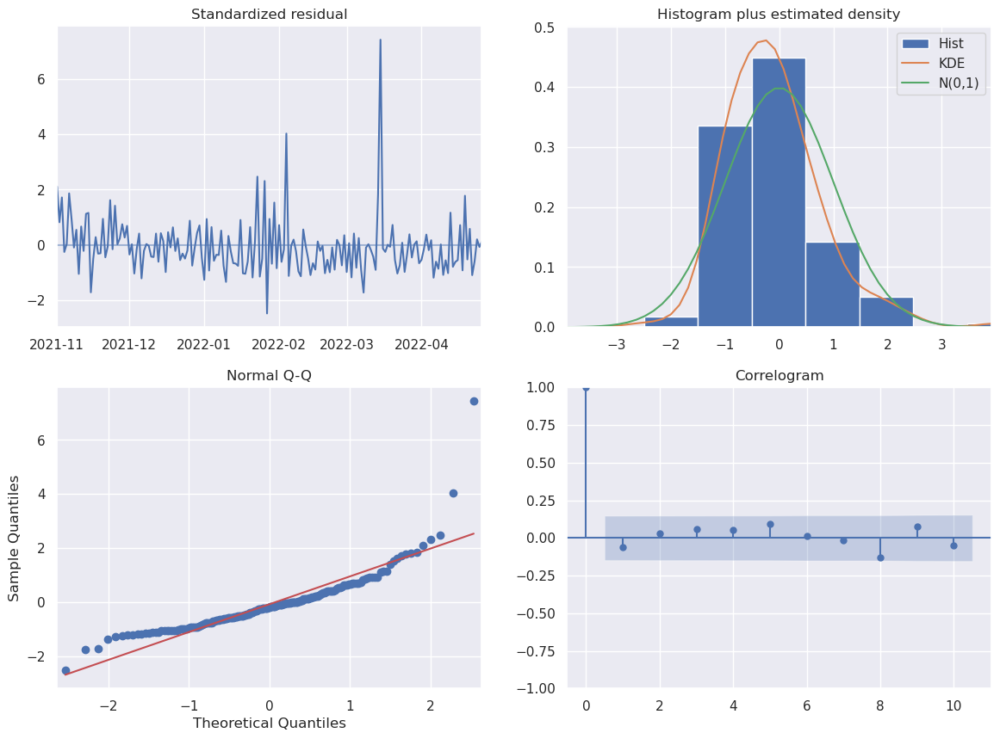


 Prediction plot 



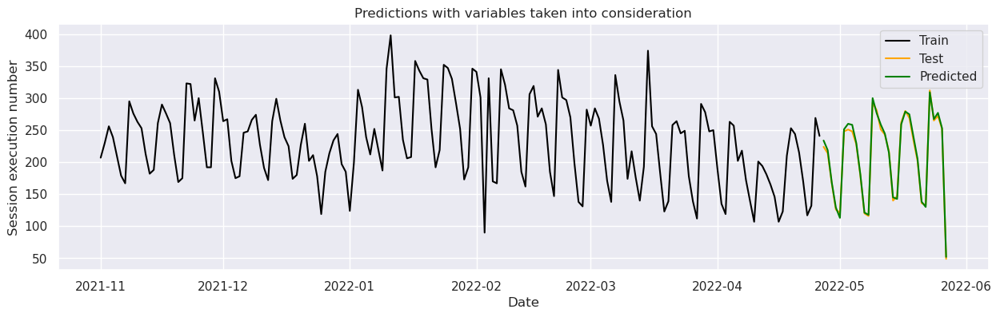


 EVALUATION METRICS 

RMSE: 4.859 
 MSE: 23.606, 
 MAE: 4.099,
 MedAE:3.231, 
 MAPE: 0.022, 
 SMAPE: 0.022.


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  177
Model:               SARIMAX(0, 0, 1)   Log Likelihood                -616.179
Date:                Wed, 10 May 2023   AIC                           1246.358
Time:                        14:20:52   BIC                           1268.591
Sample:                    11-01-2021   HQIC                          1255.375
                         - 04-26-2022                                         
Covariance Type:                  opg                                         
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
intercept                   -187.3727    102.666     -1.825      0.068    -388.595      13.850
BMI                            8.1031      4.354      1.861      0.063      -0.430      16.636
activity_level_very active     1.0454      0.126      8.277      0.000       0.798       1.293
activity_level_active          1.0817      0.050     21.447      0.000       0.983       1.181
activity_level_sedentary       1.0399      0.098     10.641      0.000       0.848       1.231
ma.L1                          0.3131      0.084      3.711      0.000       0.148       0.479
sigma2                        58.0712      4.417     13.148      0.000      49.415      66.728
===================================================================================
Ljung-Box (L1) (Q):                   0.62   Jarque-Bera (JB):              2067.29
Prob(Q):                              0.43   Prob(JB):                         0.00
Heteroskedasticity (H):               2.46   Skew:                             2.74
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [302]:
ARIMAX_try(day_BMI_act_lvl, 'number_of_sessions', exogenous_features, 
           plot_diagnostics = True, prediction_table = False)

According to the model summary, the model meets the condition of independence in the residuals (no correlation) because the p-value of the Ljung-Box test (Prob(Q)) is greater than 0.05. On the other hand, we cannot say that the residual distribution is homoscedastic (has constant variance) because the p-value of the Heteroskedasticity test (Prob(H)) is smaller than 0.05. 

Almost all of the variables are statistically significant. BMI has big coefficient, so it can have bigger influence on data and different levels of activity level also have influence on number of sessions. All coefficients (except from intercept) are positive. Model formula may look like this:

$$
y_t = -187.3727 + BMI_t \times 8.1031 + \textrm{activity level very active}_t \times 1.0454 + \textrm{activity level active}_t \times 1.0817 + \textrm{activity level sedentary}_t \times 1.0399 + 0.3131 \times ma.L1 + 58.0712
$$

58.0712 is a sigma².

There is a diagnostics of a model in the first set of plots. The correlogram doesn't show any significant correlation in the residuals, so here we should think if all the data was captured by the model. Standardized residuals plot shows that there is no obvious pattern, so model should work correctly. The histogram with estimated density says that there are differences between residuals distribution and normal distribution, qq-plot confirms it.


The prediction plot shows that the predictions are really good - they are almost all the time the same like the test values. Below there are compared actual (*number_of_sessions*) and predicted values.

The evaluation metrics look really good. Especially MAPE - it is only 2% so we can say, that the model is really good.

#### ARIMAX with height, weight, gender, goal and body type

Now, we will try with all predictors from demographics. Then we will split it into training and testing sets.

In [155]:
day_all_demo = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

day_all_demo.set_index('date_session_execution', inplace = True)

train_day_all_demo = day_all_demo[day_all_demo.index < pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

test_day_all_demo = day_all_demo[day_all_demo.index >= pd.to_datetime('2022-04-27', format = '%Y-%m-%d')]

In [156]:
exogenous_features_all = [
       'height', 'weight', 'gender_female', 'gender_male', 'goal_gain',
       'goal_lose', 'body_type_mid', 'body_type_thin']

In [157]:
model_days_all_demo = auto_arima(train_day_all_demo['number_of_sessions'], exogenous = train_day_all_demo[exogenous_features_all],  trace=True, error_action='ignore', suppress_warnings=True)
model_days_all_demo.fit(train_day_all_demo['number_of_sessions'], exogenous = train_day_all_demo[exogenous_features_all])

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1245.944, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1252.216, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1242.306, Time=0.34 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1244.171, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1250.220, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1243.718, Time=0.38 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1243.060, Time=0.39 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1246.225, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1240.227, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1241.794, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1240.870, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1242.176, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1243.768, Time=0.37 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 4.405 seconds


ARIMA(order=(1, 0, 0), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [158]:
model_days_all_demo.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  177
Model:               SARIMAX(1, 0, 0)   Log Likelihood                -610.114
Date:                Wed, 10 May 2023   AIC                           1240.227
Time:                        09:56:44   BIC                           1271.989
Sample:                    11-01-2021   HQIC                          1253.109
                         - 04-26-2022                                         
Covariance Type:                  opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
height            -1.0590      0.349     -3.031      0.002      -1.744      -0.374
weight             2.6344      0.846      3.113      0.002       0.976       4.293
gender_female      0.4540      0.300      1.512      0.130      -0.134       1.042
gender_male        0.5267      0.280      1.884      0.060      -0.021       1.075
goal_gain          0.0814      0.170      0.478      0.632      -0.252       0.415
goal_lose          0.0754      0.187      0.404      0.686      -0.290       0.441
body_type_mid      0.4269      0.260      1.642      0.101      -0.083       0.937
body_type_thin     0.6479      0.297      2.180      0.029       0.065       1.230
ar.L1              0.2999      0.101      2.967      0.003       0.102       0.498
sigma2            57.6721      4.859     11.869      0.000      48.149      67.196
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):              2039.20
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):               2.37   Skew:                             2.64
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

According to the model summary, the model meets the condition of independence in the residuals (no correlation) because the p-value of the Ljung-Box test (Prob(Q)) is greater than 0.05. On the other hand, we cannot say that the residual distribution is homoscedastic (has constant variance) because the p-value of the Heteroskedasticity test (Prob(H)) is smaller than 0.05. 

Most of the variables are statistically significant. All coefficients (except from height) are positive. Model formula may look like this:

$$
y_t = \textrm{height}_t \times (-1.059) + \textrm{weight}_t \times 2.6344 + \textrm{gender female}_t \times 0.454 + \textrm{gender_male}_t \times 0.5267 + \textrm{goal gain}_t \times 0.0814 + \textrm{goal lose}_t \times 0.0754 + \textrm{body type mid}_t \times 0.4269 + \textrm{body type thin}_t \times 0.6479 + 0.2999 \times ar.L1 + 57.6721
$$

57.6721 is a sigma².

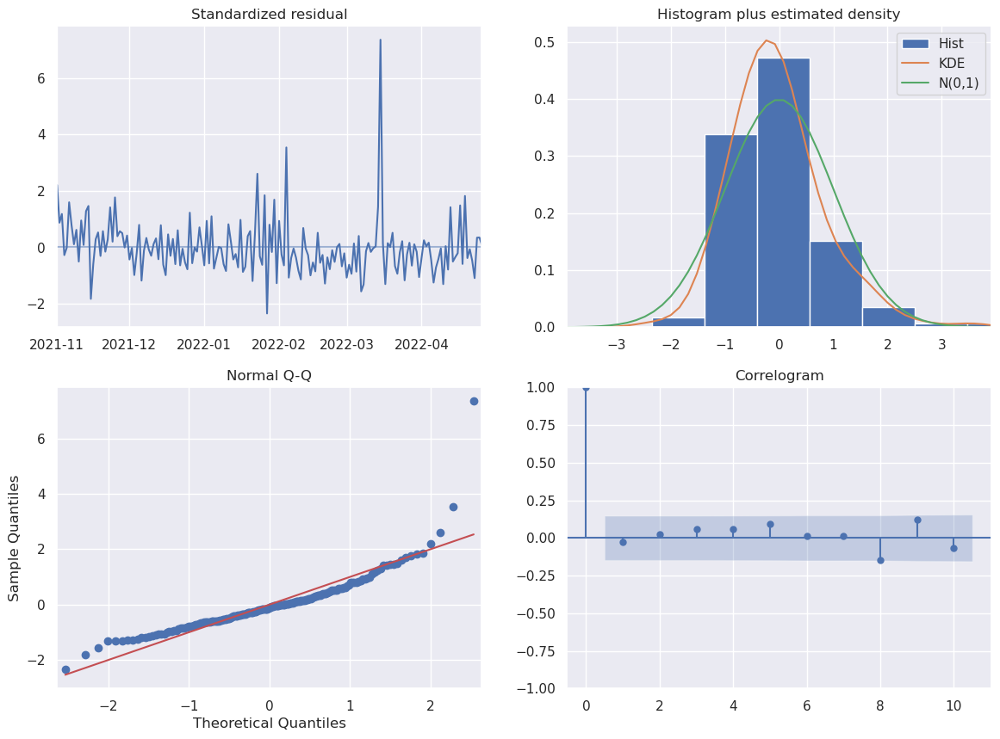

In [159]:
model_days_all_demo.plot_diagnostics(figsize=(14,10))
plt.show()

Above there is a diagnostics of a model in plots. The correlogram show only one borderline significant correlation in the residuals, so here we should think if all the data was captured by the model. Standardized residuals plot shows that there is no obvious pattern, so model should work correctly. The histogram with estimated density says that there are differences between residuals distribution and normal distribution, qq-plot confirms it.


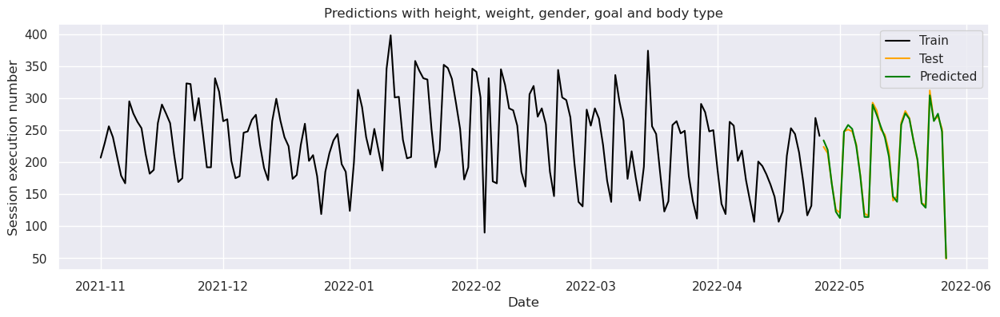

In [160]:
forecast_model_days_all_demo = model_days_all_demo.predict(n_periods=len(test_day_all_demo), exogenous = test_day_all_demo[exogenous_features_all])
forecast_model_days_all_demo = pd.DataFrame(forecast_model_days_all_demo, index = test_day_all_demo.index, columns=['Predicted'])

prediction_plot(train_day_all_demo['number_of_sessions'], test_day_all_demo['number_of_sessions'], forecast_model_days_all_demo,
               plt_title = 'Predictions with height, weight, gender, goal and body type')

The plot of predicted values is really close to the test values, so it may be really accurate.

Below there are compared actual (*number_of_sessions*) and predicted values.

In [161]:
pd.merge(test_day_all_demo['number_of_sessions'], forecast_model_days_all_demo, on = 'date_session_execution')

,number_of_sessions,Predicted
date_session_execution,,
2022-04-27,224,234.09
2022-04-28,214,219.21
2022-04-29,167,166.43
2022-04-30,126,122.67
2022-05-01,121,112.90
2022-05-02,248,247.55
2022-05-03,251,258.15
2022-05-04,248,251.94
2022-05-05,228,225.04


In [162]:
eval_metrics(test_day_all_demo['number_of_sessions'], forecast_model_days_all_demo['Predicted'])

RMSE: 4.913 
 MSE: 24.134, 
 MAE: 4.041, 
 MAPE: 0.021, 
 SMAPE: 0.022.


The evaluation metrics, are again, really good and accurate.

#### ARIMAX for BMI and body type

Here, we will take into consideration variables BMI and body type.

In [293]:
day_BMI_bt = df_session_exe_copy_demo_dummies_user_once_a_day.loc[:, ['date_session_execution', 
                                                                      'number_of_sessions', 'BMI',
                                                                      'body_type_mid', 
                                                                      'body_type_strong', 
                                                                      'body_type_thin']]

day_BMI_bt.set_index('date_session_execution', inplace = True)

exogenous_features_BMI_bt = ['BMI', 'body_type_mid', 'body_type_strong', 'body_type_thin']

Fitting the model 

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1306.298, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1283.106, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1240.564, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1304.319, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1239.282, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1233.859, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1281.143, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1235.778, Time=0.28 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1235.712, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1233.747, Time=0.20 sec
 ARIMA(0,1,3)(0,0,0)[0]          

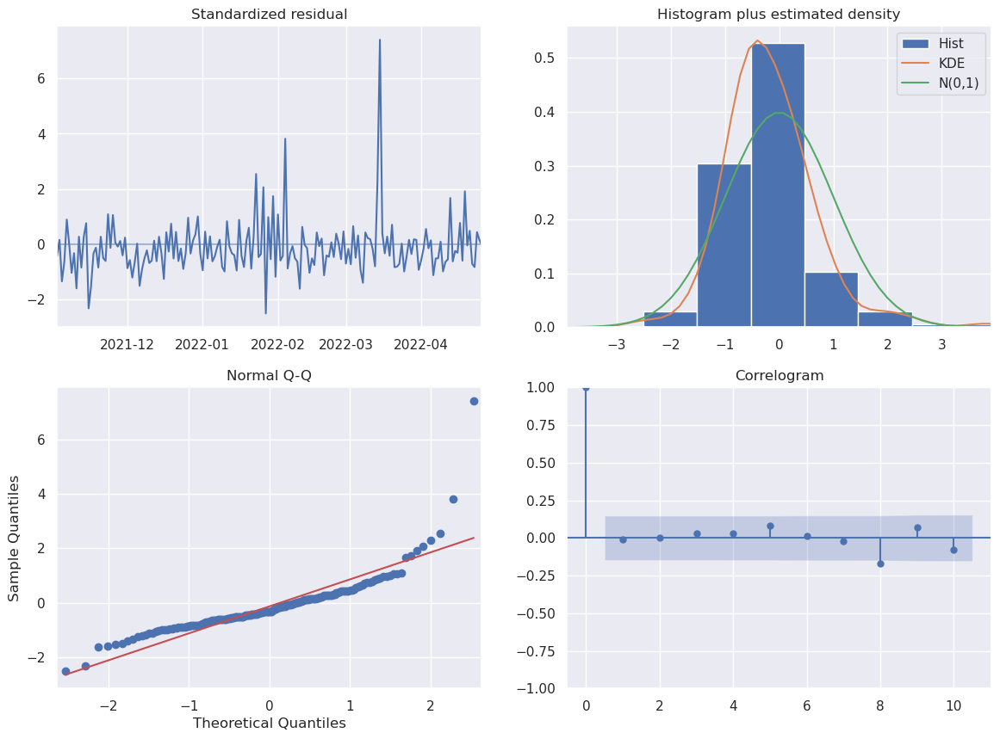


 Prediction plot 



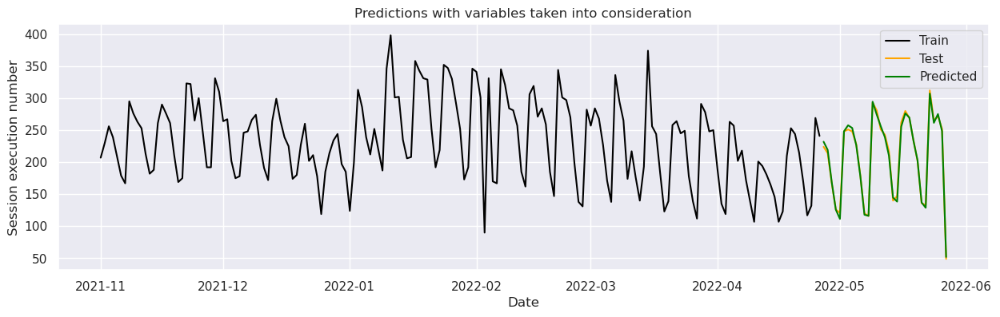


 EVALUATION METRICS 

RMSE: 4.545 
 MSE: 20.657, 
 MAE: 3.693,
 MedAE:3.618, 
 MAPE: 0.02, 
 SMAPE: 0.02.


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  177
Model:               SARIMAX(0, 1, 2)   Log Likelihood                -609.874
Date:                Wed, 10 May 2023   AIC                           1233.747
Time:                        14:21:49   BIC                           1255.941
Sample:                    11-01-2021   HQIC                          1242.749
                         - 04-26-2022                                         
Covariance Type:                  opg                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
BMI                 11.1525      4.416      2.525      0.012       2.497      19.808
body_type_mid        1.0000      0.065     15.289      0.000       0.872       1.128
body_type_strong     0.5676      0.271      2.092      0.036       0.036       1.099
body_type_thin       1.2142      0.067     18.014      0.000       1.082       1.346
ma.L1               -0.7161      0.084     -8.500      0.000      -0.881      -0.551
ma.L2               -0.2248      0.084     -2.671      0.008      -0.390      -0.060
sigma2              59.1972      5.240     11.297      0.000      48.927      69.468
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):              2890.00
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               2.47   Skew:                             3.00
Prob(H) (two-sided):                  0.00   Kurtosis:                        21.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [304]:
ARIMAX_try(day_BMI_bt, 'number_of_sessions', exogenous_features_BMI_bt, 
           plot_diagnostics = True, prediction_table = False)

According to the model summary, the model meets the condition of independence in the residuals (no correlation) because the p-value of the Ljung-Box test (Prob(Q)) is greater than 0.05. On the other hand, we cannot say that the residual distribution is homoscedastic (has constant variance) because the p-value of the Heteroskedasticity test (Prob(H)) is smaller than 0.05. 

All of the variables are statistically significant. BMI has big coefficient, so it can have bigger influence on data. Body_type_mid probably won't have much influence on the result, because it has coefficient equal to 1.   Model formula may look like this:

$$
y_t = BMI_t \times 11.1525 + \textrm{body type mid}_t \times 1 + \textrm{body type strong}_t \times 0.5676 + \textrm{body type thin}_t \times 1.2142 - 0.7161 - 0.2248 + 59.1972
$$

59.1972 is a sigma².

There is a diagnostics of a model in the first set of plots. The correlogram show one borderline significant correlation in the residuals, so here we should think if all the data was captured by the model. Standardized residuals plot shows that there is no obvious pattern, so model should work correctly. The histogram with estimated density says that there are differences between residuals distribution and normal distribution, qq-plot confirms it.


The prediction plot shows that the predictions are really good - they are almost all the time the same like the test values. Below there are compared actual (*number_of_sessions*) and predicted values.

The evaluation metrics look really good. Especially MAPE - it is only 2% so we can say, that the model is really good. MedAE and MAE are also small, so it's also good.

#### ARIMAX for gender and body type

In [315]:
day_gen_bt = df_session_exe_copy_demo_dummies_user_once_a_day.loc[:, ['date_session_execution', 
                                                                      'number_of_sessions', 
                                                                          'gender_male',
                                                                          'gender_female',
                                                                      'body_type_mid', 
                                                                      'body_type_strong', 
                                                                      'body_type_thin']]

day_gen_bt.set_index('date_session_execution', inplace = True)

exogenous_features_gen_bt = ['gender_male', 'gender_female',
                             'body_type_mid', 'body_type_strong', 'body_type_thin']

Fitting the model 

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1317.850, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1306.287, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1249.679, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1315.873, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1246.060, Time=0.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,2)(0,0,0)[0] intercept
Total fit time: 4.033 seconds

 Prediction plot 



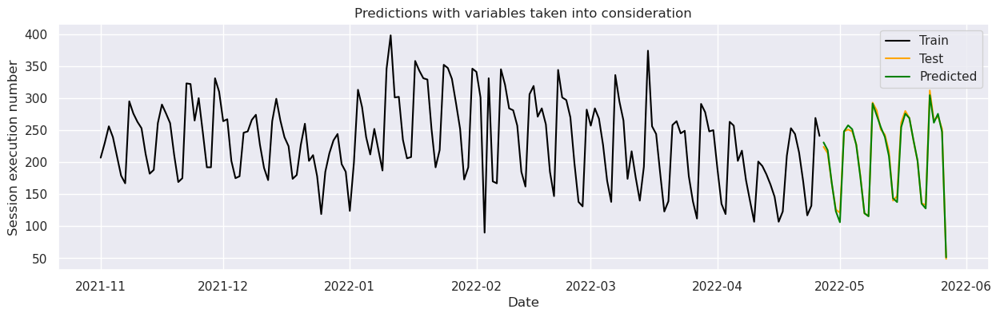


 EVALUATION METRICS 

RMSE: 5.109 
 MSE: 26.098, 
 MAE: 3.906,
 MedAE:3.507, 
 MAPE: 0.021, 
 SMAPE: 0.022.


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  177
Model:               SARIMAX(0, 1, 2)   Log Likelihood                -614.030
Date:                Wed, 10 May 2023   AIC                           1246.060
Time:                        15:34:30   BIC                           1274.594
Sample:                    11-01-2021   HQIC                          1257.633
                         - 04-26-2022                                         
Covariance Type:                  opg                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept           -0.0529      0.092     -0.573      0.567      -0.234       0.128
gender_male          0.6998      0.056     12.591      0.000       0.591       0.809
gender_female        0.5572      0.103      5.394      0.000       0.355       0.760
body_type_mid        0.3395      0.087      3.904      0.000       0.169       0.510
body_type_strong     0.1027      0.229      0.449      0.654      -0.346       0.551
body_type_thin       0.5271      0.098      5.387      0.000       0.335       0.719
ma.L1               -0.7245      0.101     -7.192      0.000      -0.922      -0.527
ma.L2               -0.1763      0.092     -1.912      0.056      -0.357       0.004
sigma2              61.7186      4.594     13.434      0.000      52.714      70.723
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              3646.25
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               2.50   Skew:                             3.18
Prob(H) (two-sided):                  0.00   Kurtosis:                        24.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.98e+18. Standard errors may be unstable.
"""

In [316]:
ARIMAX_try(day_gen_bt, 'number_of_sessions', exogenous_features_gen_bt, 
           plot_diagnostics = False, prediction_table = False)

#### RNN with all demographic data

https://github.com/flo7up/relataly-public-python-tutorials/blob/master/007%20Time%20Series%20Forecasting%20-%20Multivariate%20Time%20Series%20Models.ipynb

This RNN uses sliding window approach.

In [163]:
from tensorflow.keras import Sequential # Deep learning library, used for neural networks
from tensorflow.keras.layers import LSTM, Dense, Dropout # Deep learning classes for recurrent and regular densely-connected layers
from tensorflow.keras.callbacks import EarlyStopping # EarlyStopping during model training
from sklearn.preprocessing import RobustScaler, MinMaxScaler

2023-05-10 09:57:25.975573: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [224]:
# definition for RNN based on the code from the link above

def partition_dataset(sequence_length, data, index):
        x, y = [], []
        data_len = data.shape[0]
        for i in range(sequence_length, data_len):
            x.append(data[i-sequence_length:i,:]) #contains sequence_length values 0-sequence_length * columsn
            y.append(data[i, index]) #contains the prediction values for validation,  for single-step prediction

        # Convert the x and y to numpy arrays
        x = np.array(x)
        y = np.array(y)
        return x, y

def RNN_trial(df, features, var_to_be_predicted, sequence_length = 50, df_split = 0.85,
              optimizer_rnn = 'adam', loss_rnn = 'mse', epochs = 50, batch_size = 16,
              plot = True, start_date = '2021-11-01', y_lab = 'Number of sessions', 
              x_lab = 'Date', title = 'Actual vs predicted'):
    
    df_featured = df[features] # we take only the featured data
    df_featured_ext = df_featured.copy()
    df_featured_ext['Prediction'] = df_featured_ext[var_to_be_predicted] # we add "Predicted" column to predict the data later
    
    nrows = df_featured.shape[0] # number of rows
    
    np_data_unscaled = np.array(df_featured) # array version of data - unscaled at the moment
    np_data = np.reshape(np_data_unscaled, (nrows, -1)) # we reshape the data
    
    scaler = MinMaxScaler() # Scaler initialization
    np_data_scaled = scaler.fit_transform(np_data_unscaled) # scaling unscaled data in array version
    
    scaler_pred = MinMaxScaler() # Scaler for predictions initialization
    df_var = pd.DataFrame(df_featured_ext[var_to_be_predicted]) # column of variable to be predicted
    np_var_scaled = scaler_pred.fit_transform(df_var) # we scale the variable to be predicted

    index_var = df.columns.get_loc(var_to_be_predicted) # here are indexes for column to be predicted
    
    train_data_len = math.ceil(np_data_scaled.shape[0] * df_split) # desired length of train data
    
    # now, we split the data into train and test data
    
    train_data = np_data_scaled[0:train_data_len, :] 
    test_data = np_data_scaled[train_data_len - sequence_length:, :]
    
    # now we split the train and test into x-predictors and y-variable to be predicted
    
    x_train, y_train = partition_dataset(sequence_length, train_data, index_var)
    x_test, y_test = partition_dataset(sequence_length, test_data, index_var)
    
    # Training model
    
    model = Sequential() # Initialization

    n_neurons = x_train.shape[1] * x_train.shape[2] # number of neurons in first two hidden layers
    model.add(LSTM(n_neurons, return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))  # Input data and first hidden layer - takes mini-batches as input and returns the whole sequence
    model.add(LSTM(n_neurons, return_sequences=False)) # second hidden layer
    #model.add(Dense(np.ceil(x_train.shape[2])))
    model.add(Dense(np.ceil(2/3*x_train.shape[2]))) # third layer - dense - smaller with 2/3 length of input shape
    model.add(Dense(1)) # output layer
    
    # Compile the model
    model.compile(optimizer = optimizer_rnn, loss = loss_rnn)
    
    print('[FITTING THE MODEL TO THE DATA]')
    
    early_stop = EarlyStopping(monitor='loss', patience=5, verbose=1)
    history = model.fit(x_train, y_train, 
                        batch_size=batch_size, 
                        epochs=epochs,
                        validation_data=(x_test, y_test)
                       )
    
    # evaluation of the model 
    
    print('[EVALUATION OF MODEL]')
    
    y_pred_scaled = model.predict(x_test) # prediction of the values
    
    y_pred = scaler_pred.inverse_transform(y_pred_scaled) # Unscale the predicted values
    y_test_unscaled = scaler_pred.inverse_transform(y_test.reshape(-1, 1)) # unscale test values
    
    # dataframe with actual and predicted values
    df_res = pd.DataFrame(y_test_unscaled, columns = ['Actual']) 
    df_res['Predicted'] = y_pred
    
    # Calculation of metrics
    MAE = mean_absolute_error(y_test_unscaled, y_pred)
    print(f'Mean Absolute Error (MAE): {np.round(MAE, 2)}')
    
    MedAE = median_absolute_error(y_test_unscaled, y_pred)
    print(f'Median Absolute Error (MedAE): {np.round(MedAE, 2)}')

    MAPE = np.mean((np.abs(np.subtract(y_test_unscaled, y_pred)/ y_test_unscaled))) * 100
    print(f'Mean Absolute Percentage Error (MAPE): {np.round(MAPE, 2)} %')

    MDAPE = np.median((np.abs(np.subtract(y_test_unscaled, y_pred)/ y_test_unscaled)) ) * 100
    print(f'Median Absolute Percentage Error (MDAPE): {np.round(MDAPE, 2)} %')
    
    RMSE = rmse(y_test_unscaled, y_pred)
    print(f'Root Mean Squared Error (RMSE): {np.round(RMSE, 2)}')
    
    if plot == True:
        
        display_start_date = pd.to_datetime(start_date, format = '%Y-%m-%d')
        
        # Add the difference between the valid and predicted prices
        train = pd.DataFrame(df_featured_ext[var_to_be_predicted][:train_data_len + 1]).rename(columns={var_to_be_predicted: 'y_train'})
        valid = pd.DataFrame(df_featured_ext[var_to_be_predicted][train_data_len:]).rename(columns={var_to_be_predicted: 'y_test'})
        valid.insert(1, "y_pred", y_pred, True)
        valid.insert(1, "residuals", valid["y_pred"] - valid["y_test"], True)
        df_union = pd.concat([train, valid])

        # Zoom in to a closer timeframe
        df_union_zoom = df_union[df_union.index > display_start_date]

        # Create the lineplot
        fig, ax1 = plt.subplots(figsize=(16, 8))
        plt.title(title)
        plt.ylabel(y_lab, fontsize=18)
        plt.xlabel(x_lab)
        sns.set_palette(["#090364", "#1960EF", "#EF5919"])
        sns.lineplot(data=df_union_zoom[['y_pred', 'y_train', 'y_test']], linewidth=1.0, dashes=False, ax=ax1)

        # Create the bar plot with the differences
        df_sub = ["#2BC97A" if x > 0 else "#C92B2B" for x in df_union_zoom["residuals"].dropna()]
        ax1.bar(height=df_union_zoom['residuals'].dropna(), x=df_union_zoom['residuals'].dropna().index, width=3, label='residuals', color=df_sub)
        plt.legend()
        plt.show()

    

In [165]:
df_session_exe_copy_demo_dummies_user_once_a_day_trial = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_trial.set_index('date_session_execution', inplace = True)

features_all = df_session_exe_copy_demo_dummies_user_once_a_day_trial.columns.values

2023-05-10 09:57:42.558869: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 13s 1s/step - loss: 13.6995 - val_loss: 0.0991
Epoch 2/50
8/8 [==============================] - 9s 1s/step - loss: 0.0809 - val_loss: 0.1505
Epoch 3/50
8/8 [==============================] - 9s 1s/step - loss: 0.1120 - val_loss: 0.1274
Epoch 4/50
8/8 [==============================] - 9s 1s/step - loss: 0.0738 - val_loss: 0.0616
Epoch 5/50
8/8 [==============================] - 9s 1s/step - loss: 0.0476 - val_loss: 0.0358
Epoch 6/50
8/8 [==============================] - 9s 1s/step - loss: 0.0317 - val_loss: 0.0274
Epoch 7/50
8/8 [==============================] - 9s 1s/step - loss: 0.0272 - val_loss: 0.0241
Epoch 8/50
8/8 [==============================] - 9s 1s/step - loss: 0.0258 - val_loss: 0.0222
Epoch 9/50
8/8 [==============================] - 9s 1s/step - loss: 0.0248 - val_loss: 0.0200
Epoch 10/50
8/8 [==============================] - 9s 1s/step - loss: 0.0254 - val_loss: 0.0189
Epoch 11/50
8/8

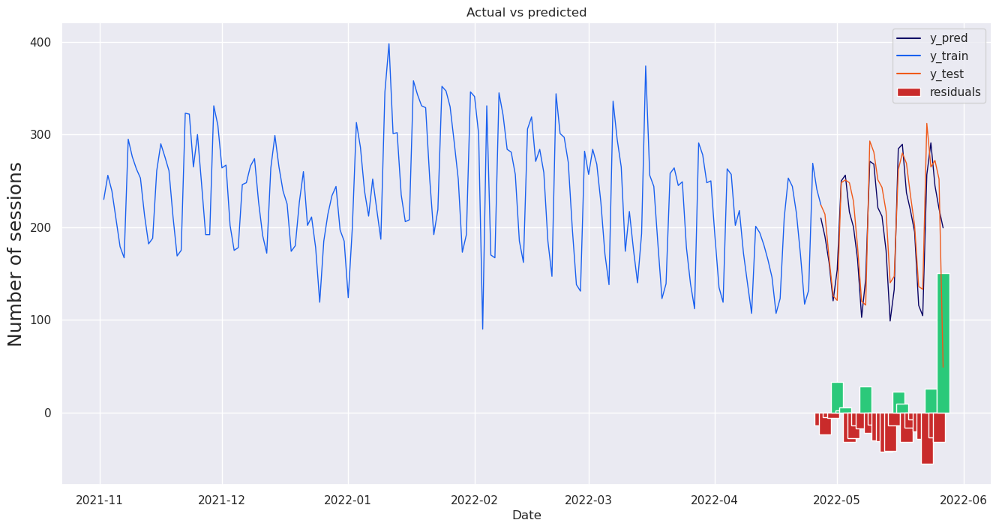

In [166]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_trial, features_all, 
          'number_of_sessions', sequence_length = 50)


[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 16s 2s/step - loss: 18.7405 - val_loss: 0.1592
Epoch 2/50
8/8 [==============================] - 14s 2s/step - loss: 0.1450 - val_loss: 0.2790
Epoch 3/50
8/8 [==============================] - 14s 2s/step - loss: 0.1454 - val_loss: 0.0932
Epoch 4/50
8/8 [==============================] - 14s 2s/step - loss: 0.0602 - val_loss: 0.0460
Epoch 5/50
8/8 [==============================] - 14s 2s/step - loss: 0.0429 - val_loss: 0.0389
Epoch 6/50
8/8 [==============================] - 14s 2s/step - loss: 0.0360 - val_loss: 0.0296
Epoch 7/50
8/8 [==============================] - 14s 2s/step - loss: 0.0283 - val_loss: 0.0233
Epoch 8/50
8/8 [==============================] - 14s 2s/step - loss: 0.0237 - val_loss: 0.0199
Epoch 9/50
8/8 [==============================] - 14s 2s/step - loss: 0.0201 - val_loss: 0.0205
Epoch 10/50
8/8 [==============================] - 14s 2s/step - loss: 0.0190 - val_loss: 0.0200
Epoch 

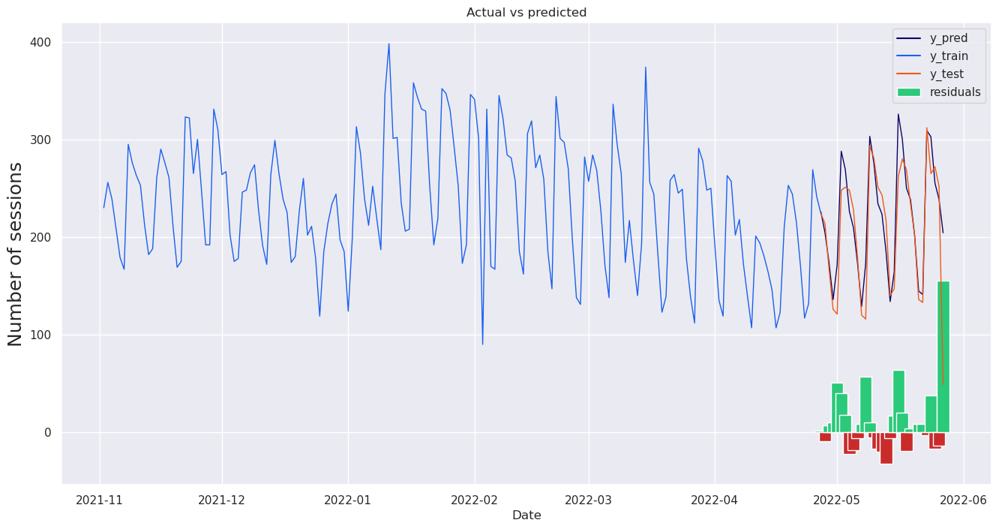

In [167]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_trial, features_all, 
          'number_of_sessions', sequence_length = 55)


#### RNN for BMI and activity level

In [168]:
df_session_exe_copy_demo_dummies_user_once_a_day_2 = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_2.set_index('date_session_execution', inplace = True)

BMI_act_lvl_features = ['number_of_sessions', 'BMI',
                        'activity_level_very active','activity_level_active','activity_level_sedentary']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 3s 79ms/step - loss: 0.0996 - val_loss: 0.0465
Epoch 2/50
10/10 [==============================] - 0s 21ms/step - loss: 0.0489 - val_loss: 0.0465
Epoch 3/50
10/10 [==============================] - 0s 18ms/step - loss: 0.0339 - val_loss: 0.0374
Epoch 4/50
10/10 [==============================] - 0s 14ms/step - loss: 0.0345 - val_loss: 0.0411
Epoch 5/50
10/10 [==============================] - 0s 15ms/step - loss: 0.0347 - val_loss: 0.0370
Epoch 6/50
10/10 [==============================] - 0s 14ms/step - loss: 0.0334 - val_loss: 0.0394
Epoch 7/50
10/10 [==============================] - 0s 15ms/step - loss: 0.0329 - val_loss: 0.0395
Epoch 8/50
10/10 [==============================] - 0s 14ms/step - loss: 0.0324 - val_loss: 0.0378
Epoch 9/50
10/10 [==============================] - 0s 14ms/step - loss: 0.0329 - val_loss: 0.0372
Epoch 10/50
10/10 [==============================] - 0s 16ms/step - loss: 0.0

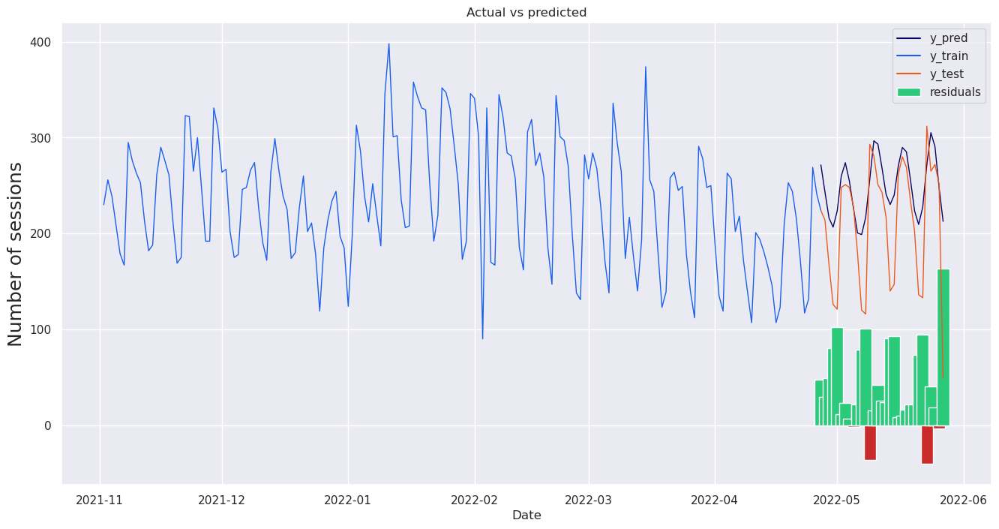

In [216]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions', sequence_length = 20)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
11/11 [==============================] - 3s 68ms/step - loss: 0.0861 - val_loss: 0.0356
Epoch 2/50
11/11 [==============================] - 0s 18ms/step - loss: 0.0326 - val_loss: 0.0365
Epoch 3/50
11/11 [==============================] - 0s 14ms/step - loss: 0.0319 - val_loss: 0.0359
Epoch 4/50
11/11 [==============================] - 0s 12ms/step - loss: 0.0326 - val_loss: 0.0376
Epoch 5/50
11/11 [==============================] - 0s 11ms/step - loss: 0.0317 - val_loss: 0.0370
Epoch 6/50
11/11 [==============================] - 0s 12ms/step - loss: 0.0351 - val_loss: 0.0387
Epoch 7/50
11/11 [==============================] - 0s 12ms/step - loss: 0.0330 - val_loss: 0.0352
Epoch 8/50
11/11 [==============================] - 0s 11ms/step - loss: 0.0330 - val_loss: 0.0413
Epoch 9/50
11/11 [==============================] - 0s 12ms/step - loss: 0.0305 - val_loss: 0.0344
Epoch 10/50
11/11 [==============================] - 0s 11ms/step - loss: 0.0

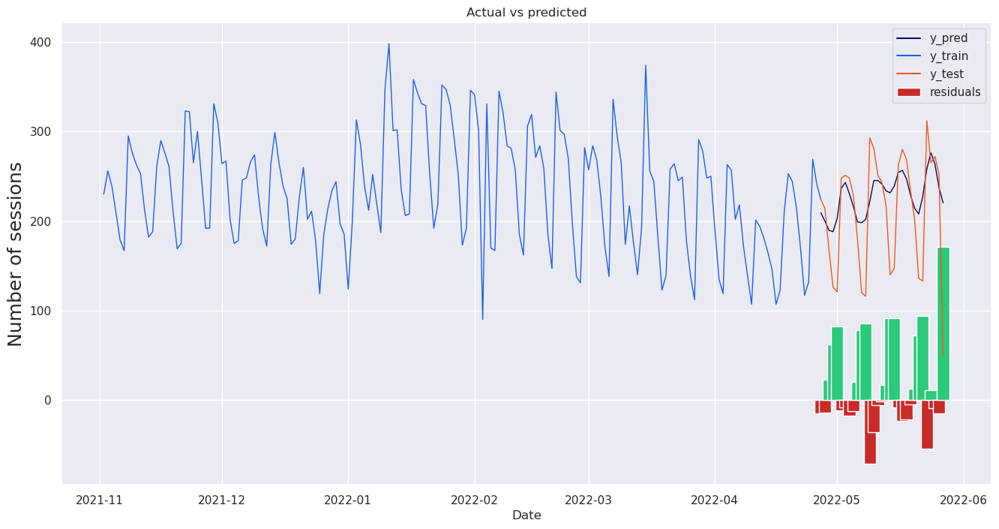

In [217]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions', sequence_length = 15)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 4s 81ms/step - loss: 0.0743 - val_loss: 0.0392
Epoch 2/50
10/10 [==============================] - 0s 23ms/step - loss: 0.0346 - val_loss: 0.0409
Epoch 3/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0340 - val_loss: 0.0381
Epoch 4/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0327 - val_loss: 0.0381
Epoch 5/50
10/10 [==============================] - 0s 19ms/step - loss: 0.0323 - val_loss: 0.0384
Epoch 6/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0323 - val_loss: 0.0393
Epoch 7/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0318 - val_loss: 0.0403
Epoch 8/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0347 - val_loss: 0.0359
Epoch 9/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0320 - val_loss: 0.0358
Epoch 10/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0

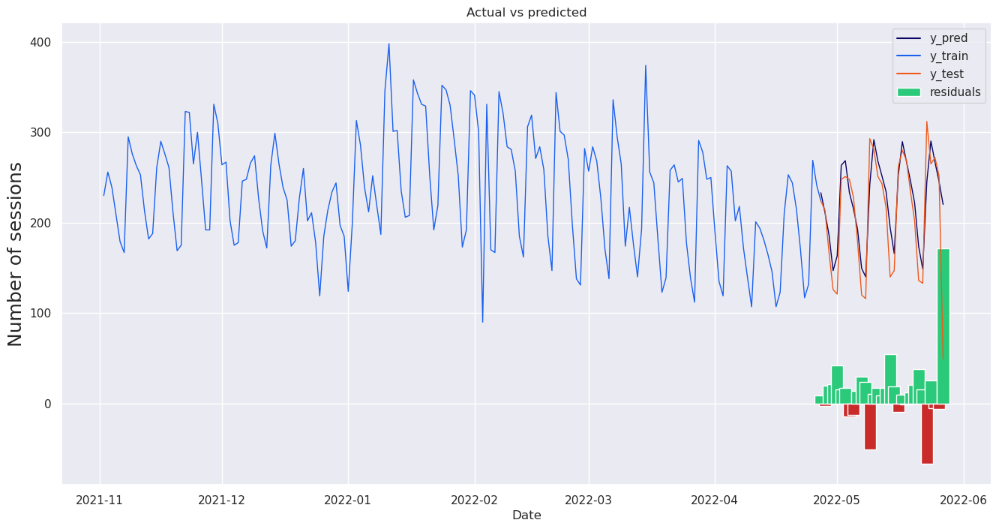

In [186]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions', sequence_length = 25)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 3s 84ms/step - loss: 0.1302 - val_loss: 0.0523
Epoch 2/50
10/10 [==============================] - 0s 28ms/step - loss: 0.0474 - val_loss: 0.0389
Epoch 3/50
10/10 [==============================] - 0s 26ms/step - loss: 0.0390 - val_loss: 0.0373
Epoch 4/50
10/10 [==============================] - 0s 26ms/step - loss: 0.0344 - val_loss: 0.0417
Epoch 5/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0337 - val_loss: 0.0371
Epoch 6/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0327 - val_loss: 0.0403
Epoch 7/50
10/10 [==============================] - 0s 26ms/step - loss: 0.0328 - val_loss: 0.0373
Epoch 8/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0334 - val_loss: 0.0409
Epoch 9/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0322 - val_loss: 0.0377
Epoch 10/50
10/10 [==============================] - 0s 26ms/step - loss: 0.0

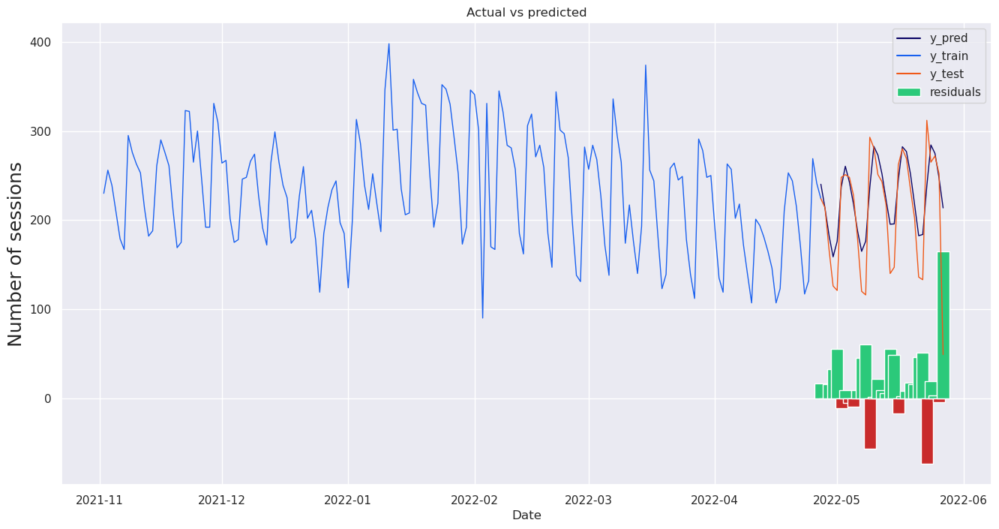

In [187]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions', sequence_length = 30, plot = True)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 4s 102ms/step - loss: 0.1451 - val_loss: 0.0557
Epoch 2/50
9/9 [==============================] - 0s 36ms/step - loss: 0.0432 - val_loss: 0.0467
Epoch 3/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0384 - val_loss: 0.0377
Epoch 4/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0345 - val_loss: 0.0447
Epoch 5/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0343 - val_loss: 0.0383
Epoch 6/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0332 - val_loss: 0.0420
Epoch 7/50
9/9 [==============================] - 0s 34ms/step - loss: 0.0338 - val_loss: 0.0380
Epoch 8/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0342 - val_loss: 0.0390
Epoch 9/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0335 - val_loss: 0.0408
Epoch 10/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0325 - val_loss: 0.0

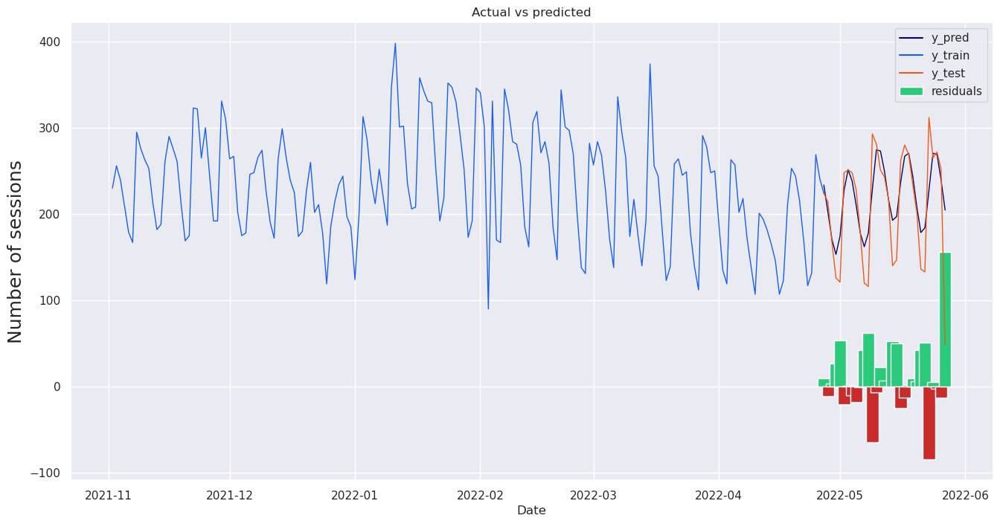

In [188]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions', sequence_length = 35)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 109ms/step - loss: 0.1136 - val_loss: 0.0378
Epoch 2/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0392 - val_loss: 0.0388
Epoch 3/50
9/9 [==============================] - 0s 44ms/step - loss: 0.0364 - val_loss: 0.0418
Epoch 4/50
9/9 [==============================] - 0s 42ms/step - loss: 0.0372 - val_loss: 0.0398
Epoch 5/50
9/9 [==============================] - 0s 40ms/step - loss: 0.0384 - val_loss: 0.0401
Epoch 6/50
9/9 [==============================] - 0s 40ms/step - loss: 0.0385 - val_loss: 0.0393
Epoch 7/50
9/9 [==============================] - 0s 40ms/step - loss: 0.0356 - val_loss: 0.0391
Epoch 8/50
9/9 [==============================] - 0s 40ms/step - loss: 0.0344 - val_loss: 0.0417
Epoch 9/50
9/9 [==============================] - 0s 40ms/step - loss: 0.0347 - val_loss: 0.0377
Epoch 10/50
9/9 [==============================] - 0s 40ms/step - loss: 0.0327 - val_loss: 0.0

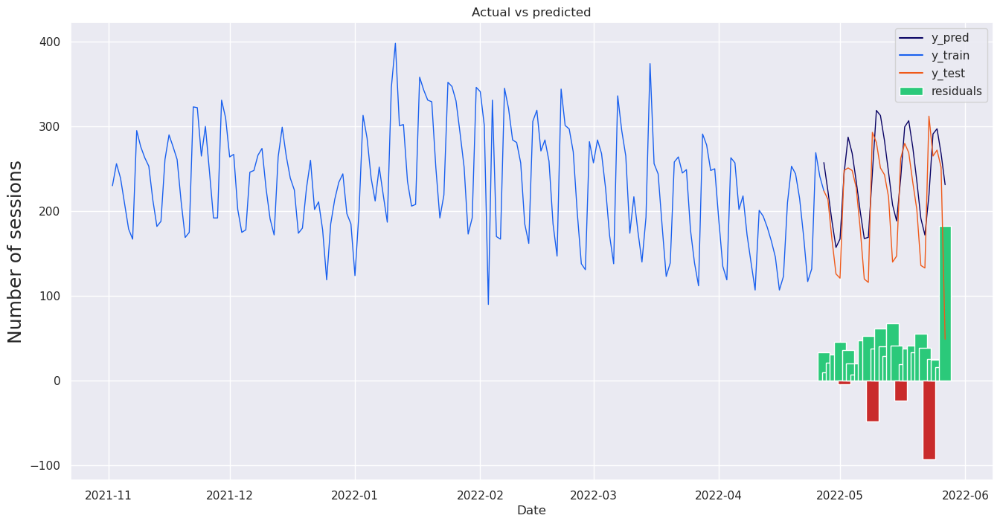

In [218]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions', sequence_length = 40)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 117ms/step - loss: 0.0749 - val_loss: 0.0628
Epoch 2/50
9/9 [==============================] - 0s 49ms/step - loss: 0.0382 - val_loss: 0.0381
Epoch 3/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0361 - val_loss: 0.0431
Epoch 4/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0359 - val_loss: 0.0483
Epoch 5/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0379 - val_loss: 0.0403
Epoch 6/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0386 - val_loss: 0.0562
Epoch 7/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0383 - val_loss: 0.0368
Epoch 8/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0338 - val_loss: 0.0413
Epoch 9/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0337 - val_loss: 0.0373
Epoch 10/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0357 - val_loss: 0.0

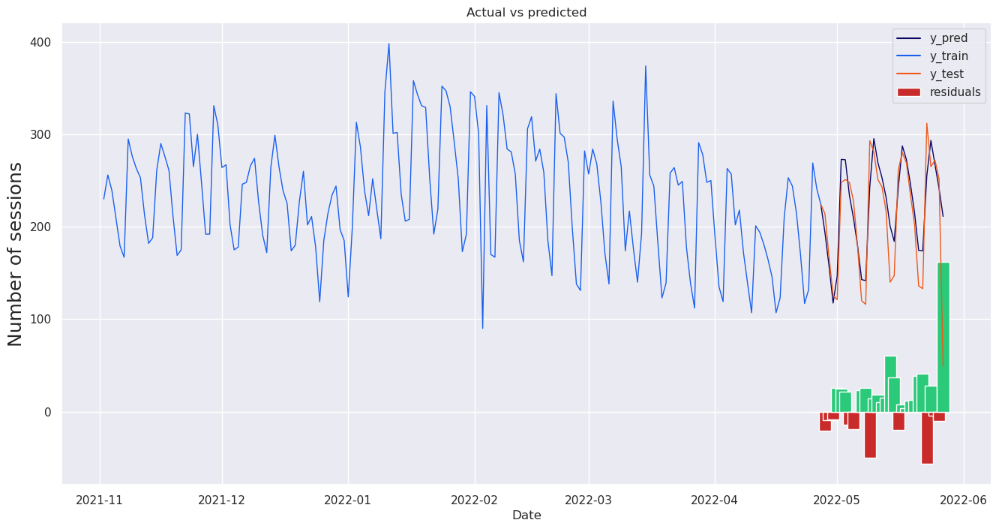

In [190]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions', sequence_length = 45)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 3s 139ms/step - loss: 0.0818 - val_loss: 0.0507
Epoch 2/50
8/8 [==============================] - 1s 62ms/step - loss: 0.0405 - val_loss: 0.0385
Epoch 3/50
8/8 [==============================] - 0s 61ms/step - loss: 0.0384 - val_loss: 0.0416
Epoch 4/50
8/8 [==============================] - 0s 62ms/step - loss: 0.0361 - val_loss: 0.0392
Epoch 5/50
8/8 [==============================] - 0s 61ms/step - loss: 0.0371 - val_loss: 0.0376
Epoch 6/50
8/8 [==============================] - 0s 62ms/step - loss: 0.0364 - val_loss: 0.0402
Epoch 7/50
8/8 [==============================] - 0s 63ms/step - loss: 0.0360 - val_loss: 0.0420
Epoch 8/50
8/8 [==============================] - 0s 62ms/step - loss: 0.0349 - val_loss: 0.0388
Epoch 9/50
8/8 [==============================] - 0s 63ms/step - loss: 0.0360 - val_loss: 0.0364
Epoch 10/50
8/8 [==============================] - 0s 62ms/step - loss: 0.0357 - val_loss: 0.0

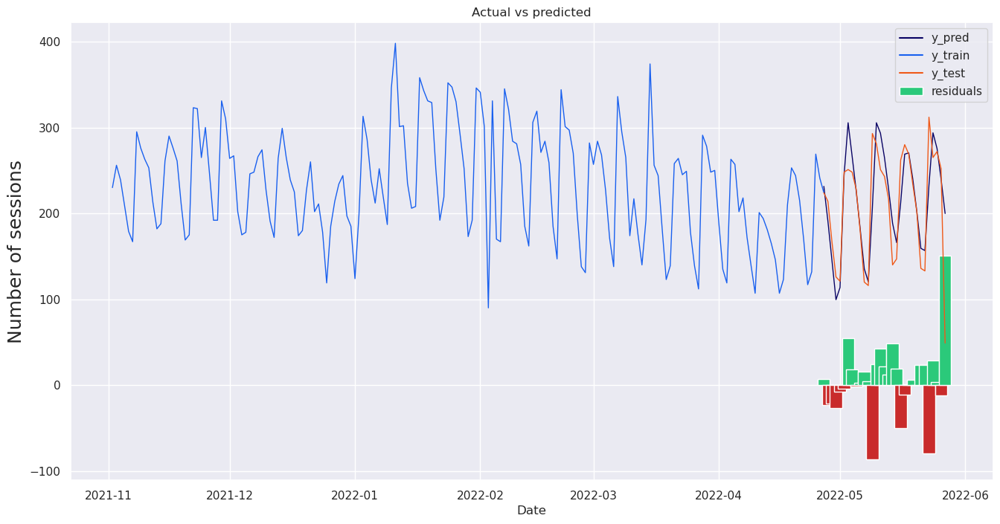

In [191]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_2, BMI_act_lvl_features, 
          'number_of_sessions')

#### RNN for body type and BMI

In [177]:
df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI.set_index('date_session_execution', inplace = True)

BMI_bt_features = ['number_of_sessions', 'BMI', 'body_type_mid', 'body_type_strong', 'body_type_thin']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 3s 81ms/step - loss: 0.0606 - val_loss: 0.0455
Epoch 2/50
10/10 [==============================] - 0s 21ms/step - loss: 0.0385 - val_loss: 0.0375
Epoch 3/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0352 - val_loss: 0.0377
Epoch 4/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0343 - val_loss: 0.0424
Epoch 5/50
10/10 [==============================] - 0s 21ms/step - loss: 0.0332 - val_loss: 0.0374
Epoch 6/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0331 - val_loss: 0.0406
Epoch 7/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0321 - val_loss: 0.0410
Epoch 8/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0346 - val_loss: 0.0361
Epoch 9/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0325 - val_loss: 0.0375
Epoch 10/50
10/10 [==============================] - 0s 20ms/step - loss: 0.0

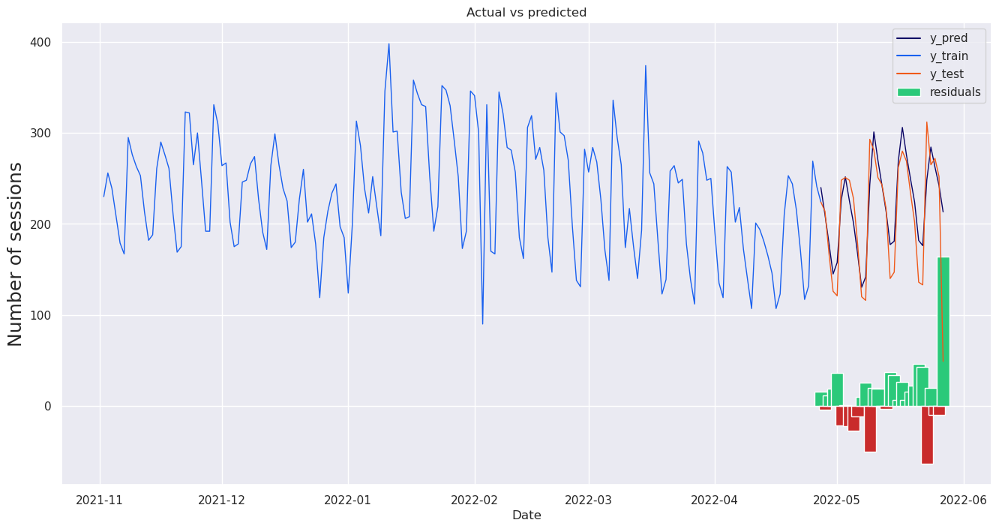

In [219]:
RNN_trial(df = df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI, features = BMI_bt_features, 
          var_to_be_predicted = 'number_of_sessions', sequence_length = 25)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 3s 84ms/step - loss: 0.1119 - val_loss: 0.0463
Epoch 2/50
10/10 [==============================] - 0s 32ms/step - loss: 0.0447 - val_loss: 0.0403
Epoch 3/50
10/10 [==============================] - 0s 26ms/step - loss: 0.0380 - val_loss: 0.0374
Epoch 4/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0338 - val_loss: 0.0424
Epoch 5/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0336 - val_loss: 0.0380
Epoch 6/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0325 - val_loss: 0.0426
Epoch 7/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0327 - val_loss: 0.0385
Epoch 8/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0335 - val_loss: 0.0429
Epoch 9/50
10/10 [==============================] - 0s 26ms/step - loss: 0.0326 - val_loss: 0.0388
Epoch 10/50
10/10 [==============================] - 0s 25ms/step - loss: 0.0

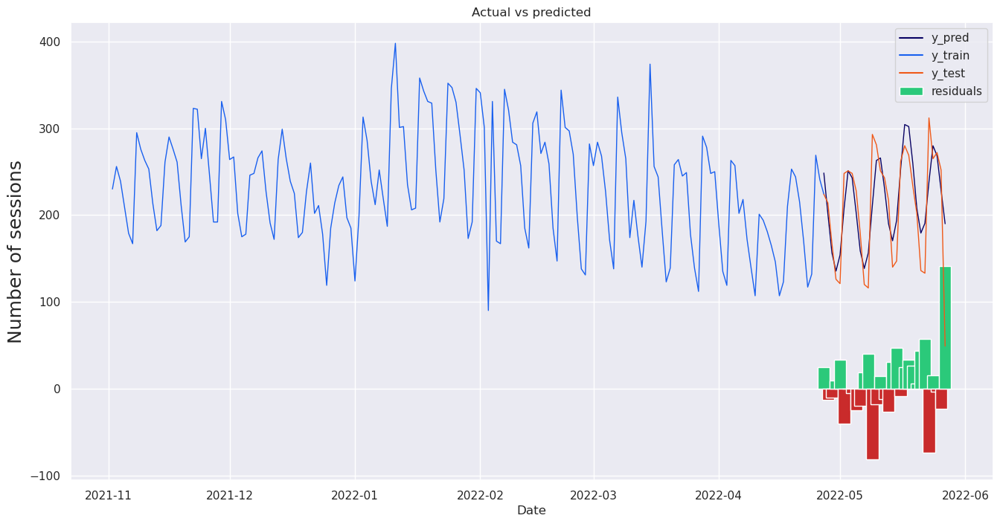

In [192]:
RNN_trial(df = df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI, features = BMI_bt_features, 
          var_to_be_predicted = 'number_of_sessions', sequence_length = 30)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 106ms/step - loss: 0.0941 - val_loss: 0.0400
Epoch 2/50
9/9 [==============================] - 0s 42ms/step - loss: 0.0369 - val_loss: 0.0374
Epoch 3/50
9/9 [==============================] - 0s 35ms/step - loss: 0.0337 - val_loss: 0.0446
Epoch 4/50
9/9 [==============================] - 0s 34ms/step - loss: 0.0380 - val_loss: 0.0367
Epoch 5/50
9/9 [==============================] - 0s 34ms/step - loss: 0.0336 - val_loss: 0.0394
Epoch 6/50
9/9 [==============================] - 0s 34ms/step - loss: 0.0341 - val_loss: 0.0437
Epoch 7/50
9/9 [==============================] - 0s 34ms/step - loss: 0.0347 - val_loss: 0.0377
Epoch 8/50
9/9 [==============================] - 0s 34ms/step - loss: 0.0360 - val_loss: 0.0365
Epoch 9/50
9/9 [==============================] - 0s 33ms/step - loss: 0.0347 - val_loss: 0.0470
Epoch 10/50
9/9 [==============================] - 0s 34ms/step - loss: 0.0344 - val_loss: 0.0

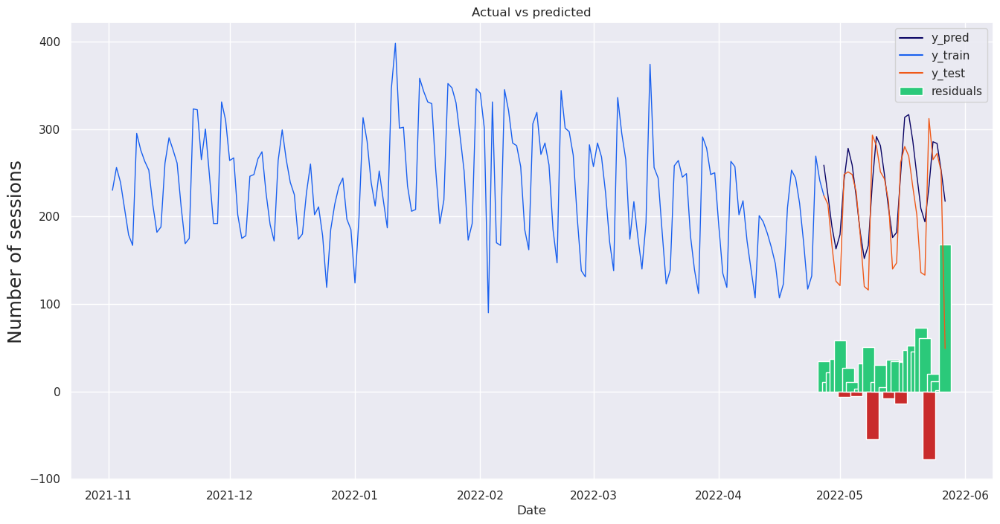

In [220]:
RNN_trial(df = df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI, features = BMI_bt_features, 
          var_to_be_predicted = 'number_of_sessions', sequence_length = 35)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 108ms/step - loss: 0.1183 - val_loss: 0.0398
Epoch 2/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0396 - val_loss: 0.0400
Epoch 3/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0363 - val_loss: 0.0406
Epoch 4/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0376 - val_loss: 0.0413
Epoch 5/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0387 - val_loss: 0.0389
Epoch 6/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0389 - val_loss: 0.0418
Epoch 7/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0356 - val_loss: 0.0385
Epoch 8/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0350 - val_loss: 0.0440
Epoch 9/50
9/9 [==============================] - 0s 41ms/step - loss: 0.0352 - val_loss: 0.0376
Epoch 10/50
9/9 [==============================] - 0s 40ms/step - loss: 0.0333 - val_loss: 0.0

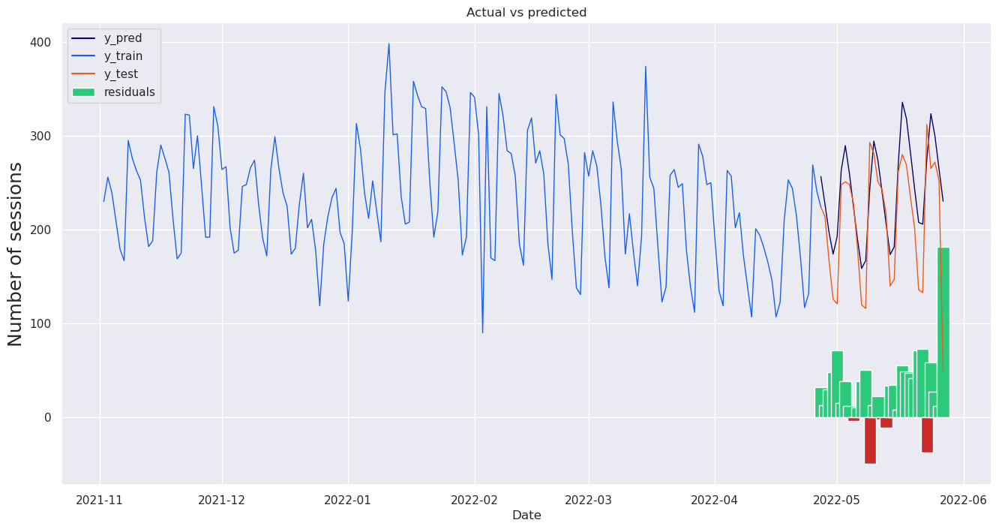

In [221]:
RNN_trial(df = df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI, features = BMI_bt_features, 
          var_to_be_predicted = 'number_of_sessions', sequence_length = 40)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 121ms/step - loss: 0.0709 - val_loss: 0.0699
Epoch 2/50
9/9 [==============================] - 0s 50ms/step - loss: 0.0372 - val_loss: 0.0383
Epoch 3/50
9/9 [==============================] - 0s 50ms/step - loss: 0.0353 - val_loss: 0.0455
Epoch 4/50
9/9 [==============================] - 0s 50ms/step - loss: 0.0356 - val_loss: 0.0520
Epoch 5/50
9/9 [==============================] - 0s 50ms/step - loss: 0.0376 - val_loss: 0.0396
Epoch 6/50
9/9 [==============================] - 0s 49ms/step - loss: 0.0381 - val_loss: 0.0560
Epoch 7/50
9/9 [==============================] - 0s 49ms/step - loss: 0.0377 - val_loss: 0.0398
Epoch 8/50
9/9 [==============================] - 0s 50ms/step - loss: 0.0344 - val_loss: 0.0404
Epoch 9/50
9/9 [==============================] - 0s 49ms/step - loss: 0.0338 - val_loss: 0.0398
Epoch 10/50
9/9 [==============================] - 0s 49ms/step - loss: 0.0356 - val_loss: 0.0

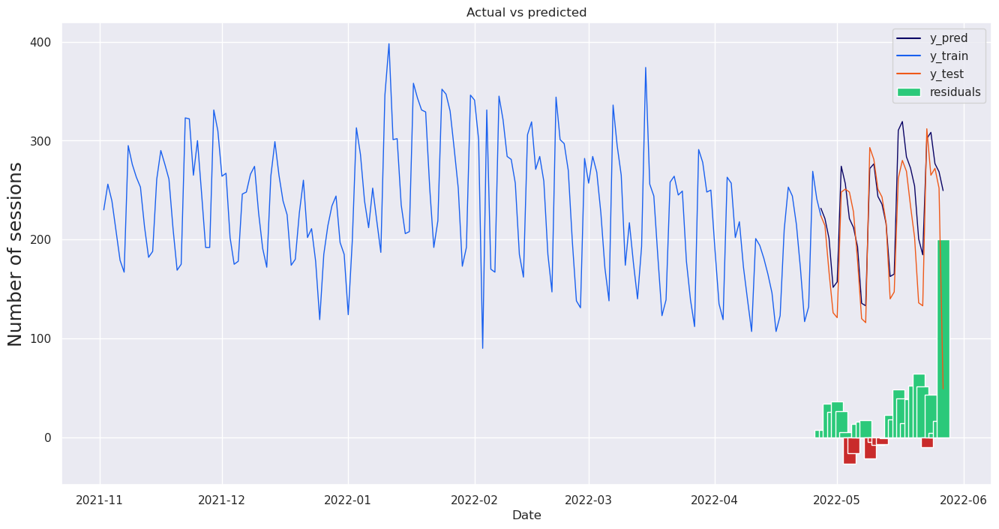

In [195]:
RNN_trial(df = df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI, features = BMI_bt_features, 
          var_to_be_predicted = 'number_of_sessions', sequence_length = 45)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 141ms/step - loss: 0.0962 - val_loss: 0.0407
Epoch 2/50
8/8 [==============================] - 1s 63ms/step - loss: 0.0420 - val_loss: 0.0400
Epoch 3/50
8/8 [==============================] - 0s 62ms/step - loss: 0.0400 - val_loss: 0.0479
Epoch 4/50
8/8 [==============================] - 1s 64ms/step - loss: 0.0391 - val_loss: 0.0386
Epoch 5/50
8/8 [==============================] - 1s 64ms/step - loss: 0.0376 - val_loss: 0.0407
Epoch 6/50
8/8 [==============================] - 0s 63ms/step - loss: 0.0368 - val_loss: 0.0411
Epoch 7/50
8/8 [==============================] - 0s 63ms/step - loss: 0.0367 - val_loss: 0.0411
Epoch 8/50
8/8 [==============================] - 1s 64ms/step - loss: 0.0354 - val_loss: 0.0415
Epoch 9/50
8/8 [==============================] - 0s 63ms/step - loss: 0.0356 - val_loss: 0.0400
Epoch 10/50
8/8 [==============================] - 1s 67ms/step - loss: 0.0358 - val_loss: 0.0

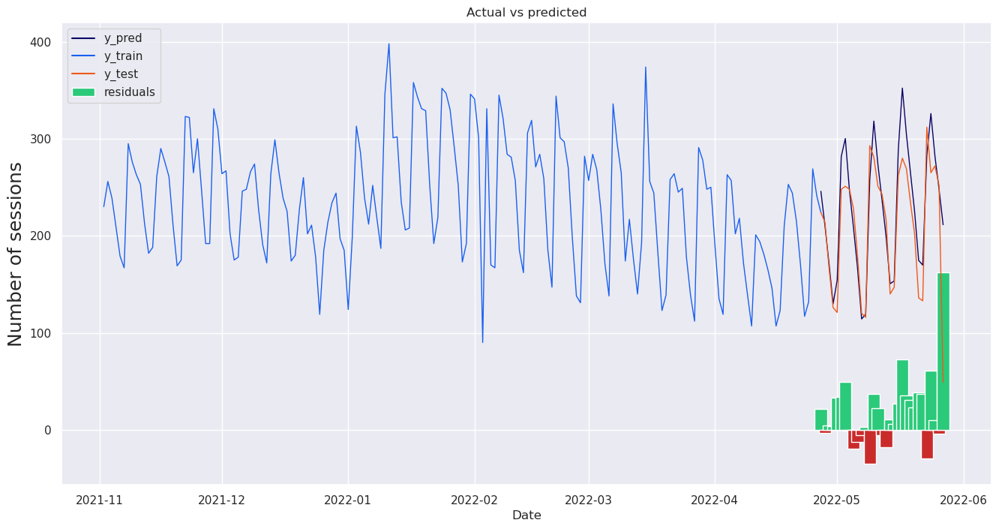

In [196]:
RNN_trial(df = df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI, features = BMI_bt_features, 
          var_to_be_predicted = 'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 150ms/step - loss: 0.2201 - val_loss: 0.0377
Epoch 2/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0553 - val_loss: 0.0407
Epoch 3/50
8/8 [==============================] - 1s 76ms/step - loss: 0.0490 - val_loss: 0.0482
Epoch 4/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0434 - val_loss: 0.0408
Epoch 5/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0366 - val_loss: 0.0391
Epoch 6/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0368 - val_loss: 0.0427
Epoch 7/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0362 - val_loss: 0.0433
Epoch 8/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0358 - val_loss: 0.0403
Epoch 9/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0358 - val_loss: 0.0438
Epoch 10/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0358 - val_loss: 0.0

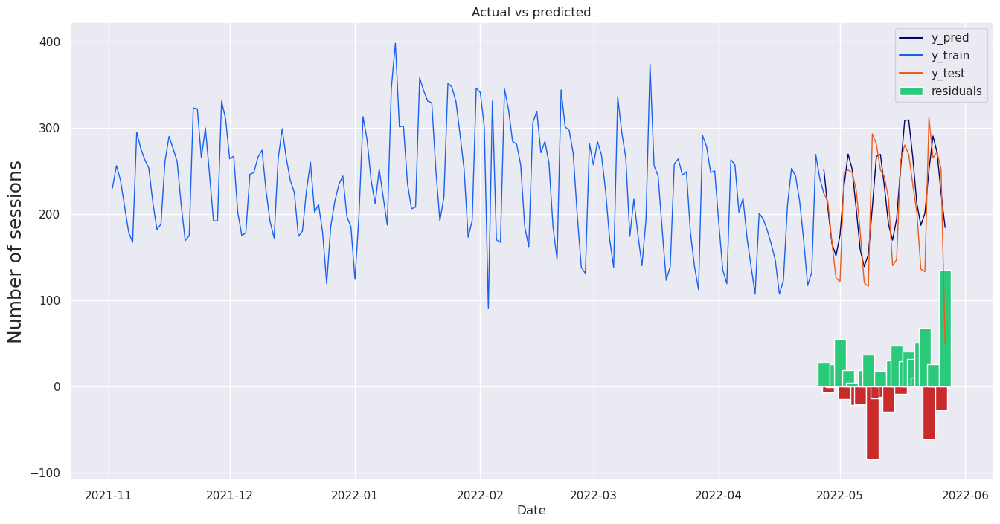

In [197]:
RNN_trial(df = df_session_exe_copy_demo_dummies_user_once_a_day_bt_BMI, features = BMI_bt_features, 
          var_to_be_predicted = 'number_of_sessions', sequence_length = 55)

#### RNN for goal, notification settings and BMI

In [198]:
df_session_exe_copy_demo_dummies_user_once_a_day_g_ns_BMI = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_g_ns_BMI.set_index('date_session_execution', inplace = True)

BMI_g_ns_features = ['number_of_sessions', 'BMI', 'goal_antiaging', 'goal_gain','goal_lose', 
                   'notifications_setting_False', 'notifications_setting_True']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 169ms/step - loss: 0.1273 - val_loss: 0.0561
Epoch 2/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0448 - val_loss: 0.0434
Epoch 3/50
8/8 [==============================] - 1s 92ms/step - loss: 0.0398 - val_loss: 0.0479
Epoch 4/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0376 - val_loss: 0.0387
Epoch 5/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0382 - val_loss: 0.0409
Epoch 6/50
8/8 [==============================] - 1s 92ms/step - loss: 0.0361 - val_loss: 0.0394
Epoch 7/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0365 - val_loss: 0.0418
Epoch 8/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0356 - val_loss: 0.0395
Epoch 9/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0360 - val_loss: 0.0388
Epoch 10/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0360 - val_loss: 0.0

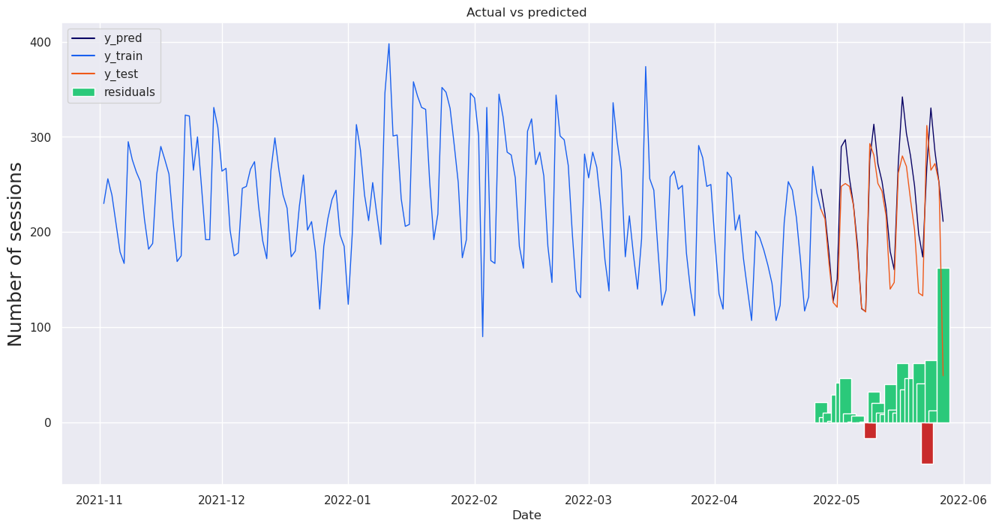

In [199]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_g_ns_BMI, BMI_g_ns_features, 
          'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 4s 145ms/step - loss: 0.2013 - val_loss: 0.0652
Epoch 2/50
9/9 [==============================] - 1s 75ms/step - loss: 0.0462 - val_loss: 0.0442
Epoch 3/50
9/9 [==============================] - 1s 75ms/step - loss: 0.0392 - val_loss: 0.0437
Epoch 4/50
9/9 [==============================] - 1s 76ms/step - loss: 0.0380 - val_loss: 0.0390
Epoch 5/50
9/9 [==============================] - 1s 71ms/step - loss: 0.0393 - val_loss: 0.0381
Epoch 6/50
9/9 [==============================] - 1s 71ms/step - loss: 0.0407 - val_loss: 0.0424
Epoch 7/50
9/9 [==============================] - 1s 74ms/step - loss: 0.0383 - val_loss: 0.0372
Epoch 8/50
9/9 [==============================] - 1s 77ms/step - loss: 0.0357 - val_loss: 0.0437
Epoch 9/50
9/9 [==============================] - 1s 73ms/step - loss: 0.0359 - val_loss: 0.0367
Epoch 10/50
9/9 [==============================] - 1s 71ms/step - loss: 0.0361 - val_loss: 0.0

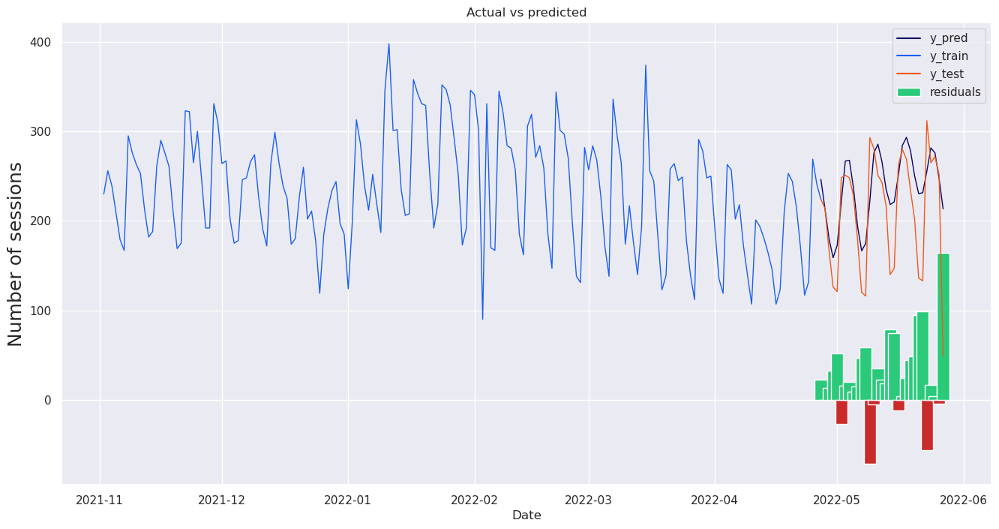

In [227]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_g_ns_BMI, BMI_g_ns_features, 
          'number_of_sessions', sequence_length = 45)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 4s 125ms/step - loss: 0.1513 - val_loss: 0.0490
Epoch 2/50
9/9 [==============================] - 1s 57ms/step - loss: 0.0446 - val_loss: 0.0410
Epoch 3/50
9/9 [==============================] - 0s 55ms/step - loss: 0.0380 - val_loss: 0.0453
Epoch 4/50
9/9 [==============================] - 1s 58ms/step - loss: 0.0365 - val_loss: 0.0401
Epoch 5/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0376 - val_loss: 0.0415
Epoch 6/50
9/9 [==============================] - 1s 58ms/step - loss: 0.0385 - val_loss: 0.0393
Epoch 7/50
9/9 [==============================] - 0s 55ms/step - loss: 0.0364 - val_loss: 0.0407
Epoch 8/50
9/9 [==============================] - 0s 55ms/step - loss: 0.0351 - val_loss: 0.0404
Epoch 9/50
9/9 [==============================] - 0s 54ms/step - loss: 0.0355 - val_loss: 0.0387
Epoch 10/50
9/9 [==============================] - 0s 55ms/step - loss: 0.0338 - val_loss: 0.0

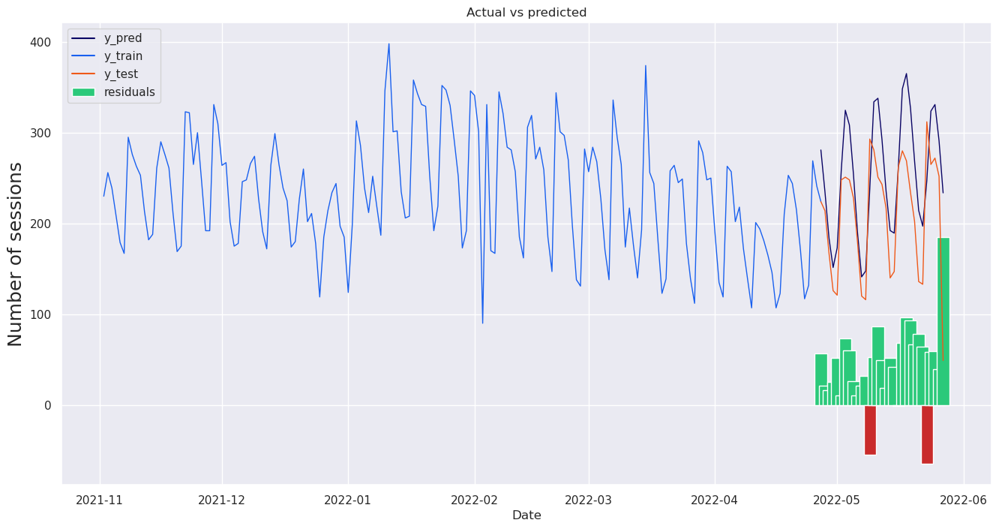

In [226]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_g_ns_BMI, BMI_g_ns_features, 
          'number_of_sessions', sequence_length = 40)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 196ms/step - loss: 0.1698 - val_loss: 0.0505
Epoch 2/50
8/8 [==============================] - 1s 116ms/step - loss: 0.0539 - val_loss: 0.0483
Epoch 3/50
8/8 [==============================] - 1s 116ms/step - loss: 0.0425 - val_loss: 0.0626
Epoch 4/50
8/8 [==============================] - 1s 116ms/step - loss: 0.0424 - val_loss: 0.0399
Epoch 5/50
8/8 [==============================] - 1s 115ms/step - loss: 0.0432 - val_loss: 0.0427
Epoch 6/50
8/8 [==============================] - 1s 116ms/step - loss: 0.0372 - val_loss: 0.0386
Epoch 7/50
8/8 [==============================] - 1s 117ms/step - loss: 0.0369 - val_loss: 0.0423
Epoch 8/50
8/8 [==============================] - 1s 124ms/step - loss: 0.0363 - val_loss: 0.0384
Epoch 9/50
8/8 [==============================] - 1s 116ms/step - loss: 0.0363 - val_loss: 0.0419
Epoch 10/50
8/8 [==============================] - 1s 115ms/step - loss: 0.0358 - val_

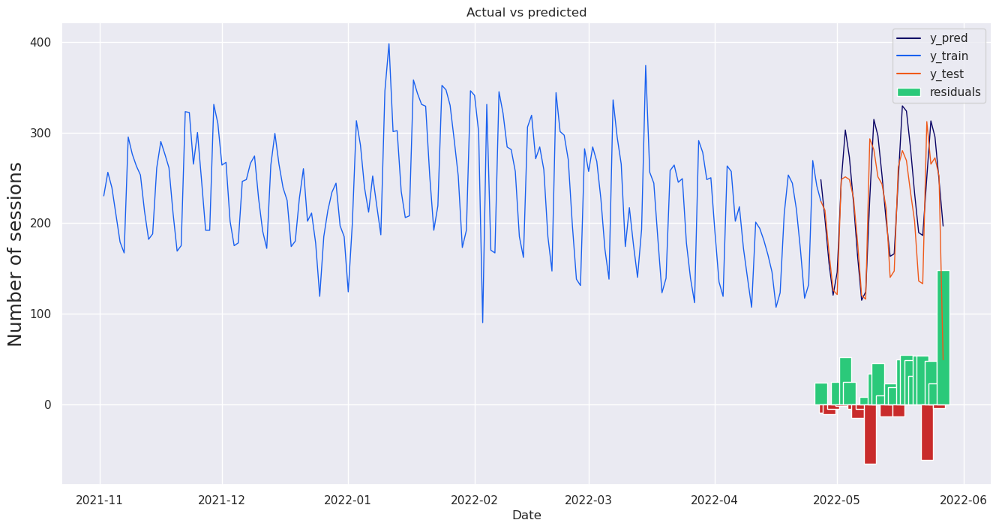

In [202]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_g_ns_BMI, BMI_g_ns_features, 
          'number_of_sessions', sequence_length = 55)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 210ms/step - loss: 0.0981 - val_loss: 0.0477
Epoch 2/50
8/8 [==============================] - 1s 132ms/step - loss: 0.0431 - val_loss: 0.0449
Epoch 3/50
8/8 [==============================] - 1s 131ms/step - loss: 0.0400 - val_loss: 0.0391
Epoch 4/50
8/8 [==============================] - 1s 131ms/step - loss: 0.0392 - val_loss: 0.0444
Epoch 5/50
8/8 [==============================] - 1s 132ms/step - loss: 0.0411 - val_loss: 0.0409
Epoch 6/50
8/8 [==============================] - 1s 131ms/step - loss: 0.0445 - val_loss: 0.0392
Epoch 7/50
8/8 [==============================] - 1s 132ms/step - loss: 0.0418 - val_loss: 0.0443
Epoch 8/50
8/8 [==============================] - 1s 131ms/step - loss: 0.0373 - val_loss: 0.0370
Epoch 9/50
8/8 [==============================] - 1s 131ms/step - loss: 0.0402 - val_loss: 0.0373
Epoch 10/50
8/8 [==============================] - 1s 135ms/step - loss: 0.0382 - val_

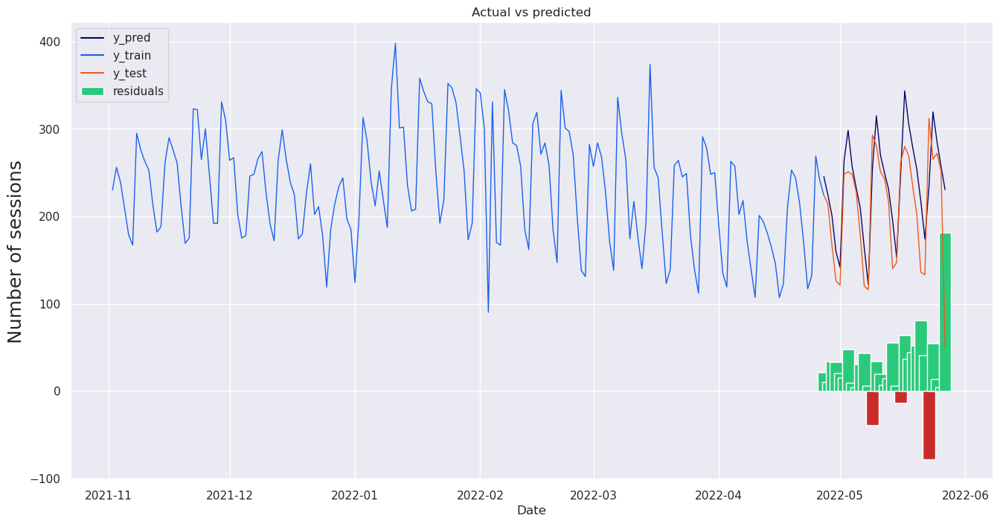

In [203]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_g_ns_BMI, BMI_g_ns_features, 
          'number_of_sessions', sequence_length = 60)

#### RNN for gender and activity level

In [205]:
df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl.set_index('date_session_execution', inplace = True)

gen_act_lvl_features = ['number_of_sessions', 'gender_female', 'gender_male',
                        'activity_level_very active','activity_level_active','activity_level_sedentary']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 3s 88ms/step - loss: 0.1109 - val_loss: 0.0390
Epoch 2/50
10/10 [==============================] - 0s 32ms/step - loss: 0.0453 - val_loss: 0.0482
Epoch 3/50
10/10 [==============================] - 0s 28ms/step - loss: 0.0428 - val_loss: 0.0410
Epoch 4/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0354 - val_loss: 0.0385
Epoch 5/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0352 - val_loss: 0.0388
Epoch 6/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0342 - val_loss: 0.0384
Epoch 7/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0335 - val_loss: 0.0378
Epoch 8/50
10/10 [==============================] - 0s 28ms/step - loss: 0.0345 - val_loss: 0.0386
Epoch 9/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0333 - val_loss: 0.0371
Epoch 10/50
10/10 [==============================] - 0s 30ms/step - loss: 0.0

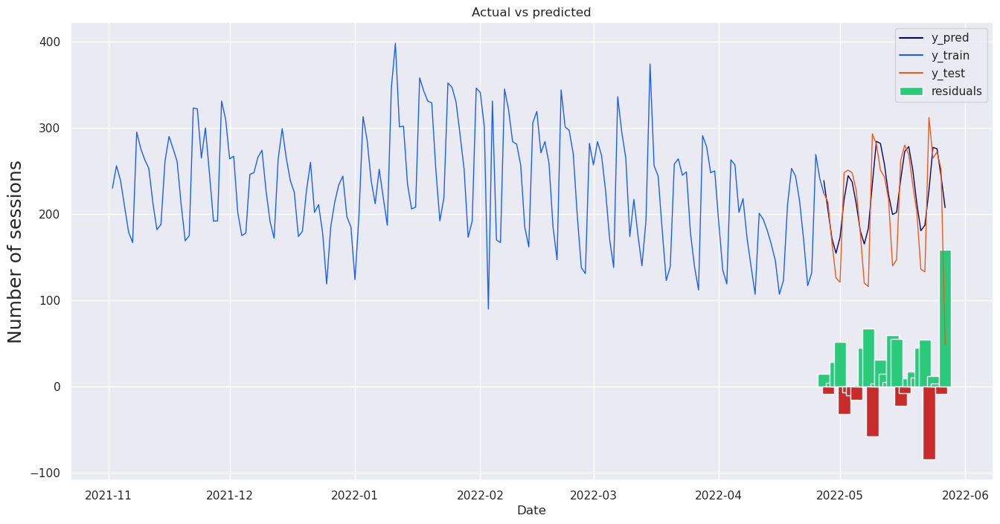

In [206]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl, gen_act_lvl_features, 
          'number_of_sessions', sequence_length = 30)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 4s 113ms/step - loss: 0.1335 - val_loss: 0.0563
Epoch 2/50
9/9 [==============================] - 0s 39ms/step - loss: 0.0415 - val_loss: 0.0398
Epoch 3/50
9/9 [==============================] - 0s 39ms/step - loss: 0.0380 - val_loss: 0.0388
Epoch 4/50
9/9 [==============================] - 0s 39ms/step - loss: 0.0352 - val_loss: 0.0389
Epoch 5/50
9/9 [==============================] - 0s 39ms/step - loss: 0.0347 - val_loss: 0.0379
Epoch 6/50
9/9 [==============================] - 0s 39ms/step - loss: 0.0337 - val_loss: 0.0383
Epoch 7/50
9/9 [==============================] - 0s 38ms/step - loss: 0.0343 - val_loss: 0.0376
Epoch 8/50
9/9 [==============================] - 0s 38ms/step - loss: 0.0350 - val_loss: 0.0374
Epoch 9/50
9/9 [==============================] - 0s 39ms/step - loss: 0.0346 - val_loss: 0.0377
Epoch 10/50
9/9 [==============================] - 0s 39ms/step - loss: 0.0335 - val_loss: 0.0

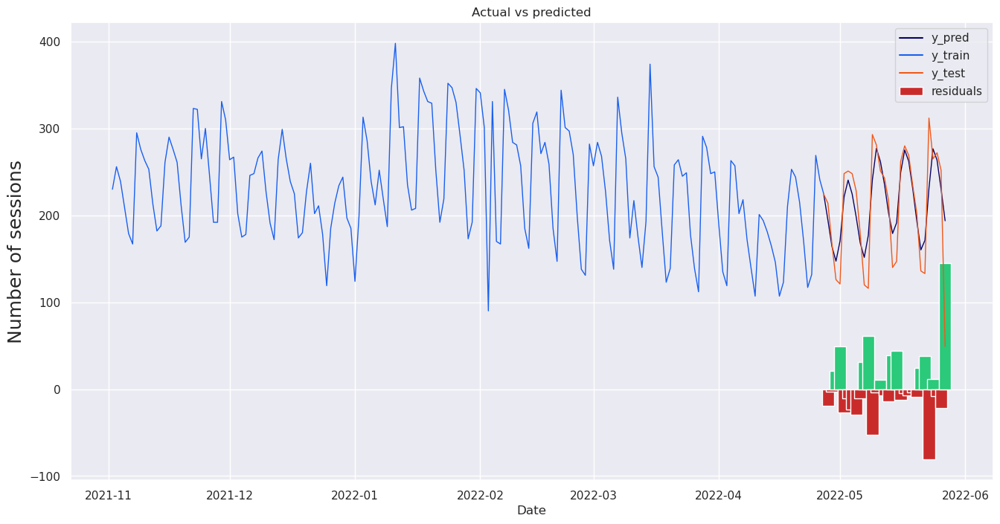

In [207]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl, gen_act_lvl_features, 
          'number_of_sessions', sequence_length = 35)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 116ms/step - loss: 0.1306 - val_loss: 0.0386
Epoch 2/50
9/9 [==============================] - 0s 49ms/step - loss: 0.0405 - val_loss: 0.0419
Epoch 3/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0377 - val_loss: 0.0406
Epoch 4/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0371 - val_loss: 0.0393
Epoch 5/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0384 - val_loss: 0.0393
Epoch 6/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0384 - val_loss: 0.0387
Epoch 7/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0365 - val_loss: 0.0385
Epoch 8/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0353 - val_loss: 0.0380
Epoch 9/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0358 - val_loss: 0.0374
Epoch 10/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0340 - val_loss: 0.0

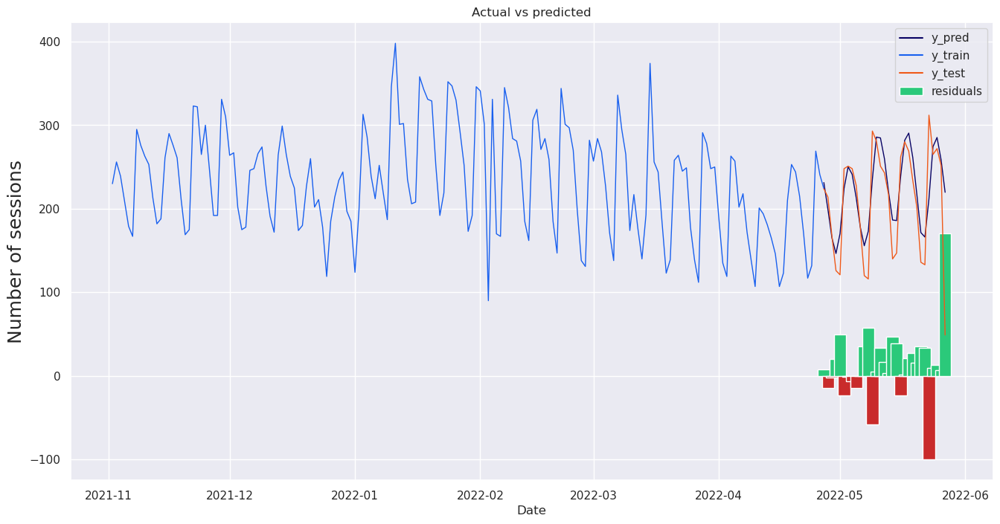

In [208]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl, gen_act_lvl_features, 
          'number_of_sessions', sequence_length = 40)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 4s 130ms/step - loss: 0.0824 - val_loss: 0.0464
Epoch 2/50
9/9 [==============================] - 1s 60ms/step - loss: 0.0379 - val_loss: 0.0405
Epoch 3/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0373 - val_loss: 0.0403
Epoch 4/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0376 - val_loss: 0.0401
Epoch 5/50
9/9 [==============================] - 1s 58ms/step - loss: 0.0390 - val_loss: 0.0449
Epoch 6/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0401 - val_loss: 0.0446
Epoch 7/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0390 - val_loss: 0.0379
Epoch 8/50
9/9 [==============================] - 1s 58ms/step - loss: 0.0343 - val_loss: 0.0387
Epoch 9/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0345 - val_loss: 0.0365
Epoch 10/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0362 - val_loss: 0.0

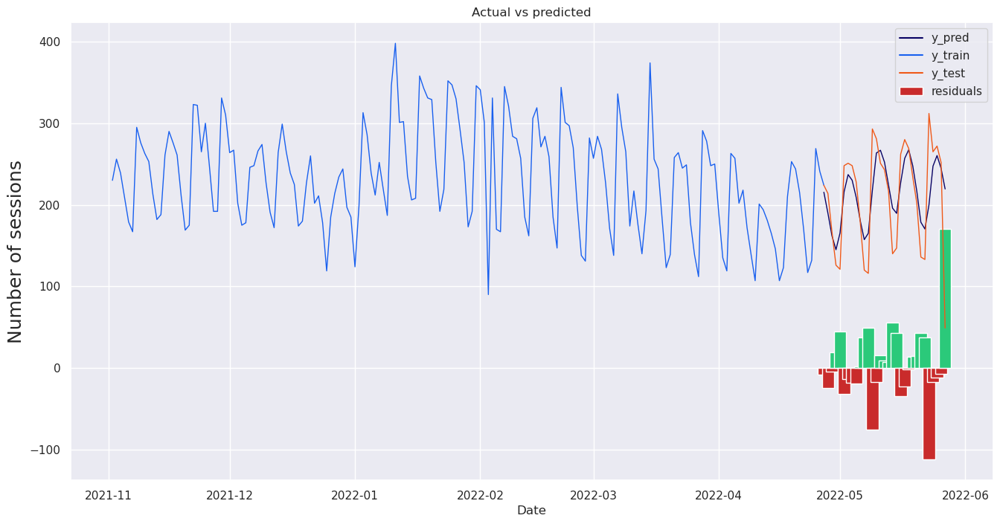

In [209]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl, gen_act_lvl_features, 
          'number_of_sessions', sequence_length = 45)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 153ms/step - loss: 0.1231 - val_loss: 0.0385
Epoch 2/50
8/8 [==============================] - 1s 73ms/step - loss: 0.0482 - val_loss: 0.0505
Epoch 3/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0417 - val_loss: 0.0433
Epoch 4/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0396 - val_loss: 0.0401
Epoch 5/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0390 - val_loss: 0.0385
Epoch 6/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0372 - val_loss: 0.0381
Epoch 7/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0374 - val_loss: 0.0380
Epoch 8/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0361 - val_loss: 0.0377
Epoch 9/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0362 - val_loss: 0.0373
Epoch 10/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0363 - val_loss: 0.0

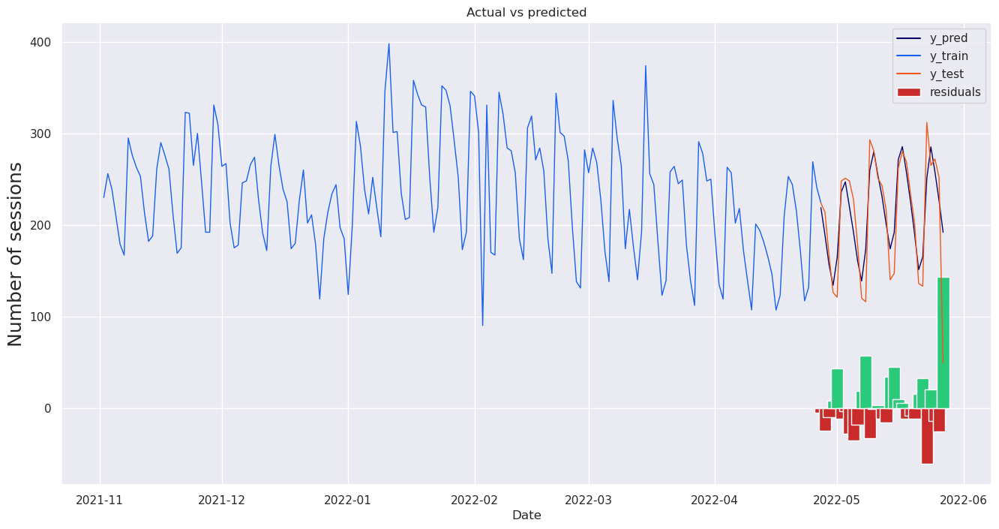

In [210]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl, gen_act_lvl_features, 
          'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 169ms/step - loss: 0.0963 - val_loss: 0.0451
Epoch 2/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0442 - val_loss: 0.0452
Epoch 3/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0388 - val_loss: 0.0450
Epoch 4/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0401 - val_loss: 0.0410
Epoch 5/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0458 - val_loss: 0.0396
Epoch 6/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0421 - val_loss: 0.0392
Epoch 7/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0389 - val_loss: 0.0385
Epoch 8/50
8/8 [==============================] - 1s 90ms/step - loss: 0.0372 - val_loss: 0.0381
Epoch 9/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0368 - val_loss: 0.0377
Epoch 10/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0365 - val_loss: 0.0

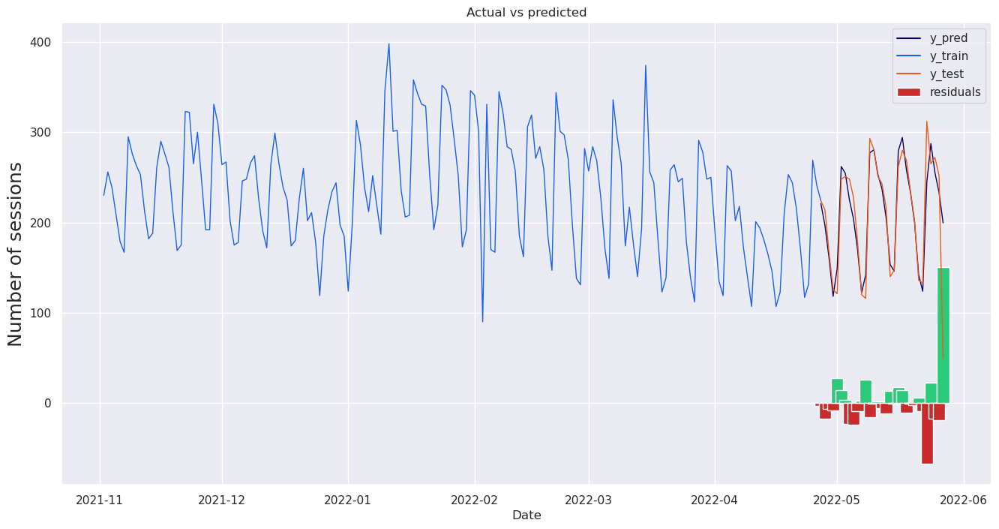

In [213]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl, gen_act_lvl_features, 
          'number_of_sessions', sequence_length = 55)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 184ms/step - loss: 0.4249 - val_loss: 0.0419
Epoch 2/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0580 - val_loss: 0.0540
Epoch 3/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0465 - val_loss: 0.0431
Epoch 4/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0407 - val_loss: 0.0403
Epoch 5/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0381 - val_loss: 0.0413
Epoch 6/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0420 - val_loss: 0.0395
Epoch 7/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0396 - val_loss: 0.0389
Epoch 8/50
8/8 [==============================] - 1s 107ms/step - loss: 0.0388 - val_loss: 0.0381
Epoch 9/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0390 - val_loss: 0.0373
Epoch 10/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0393 - val_

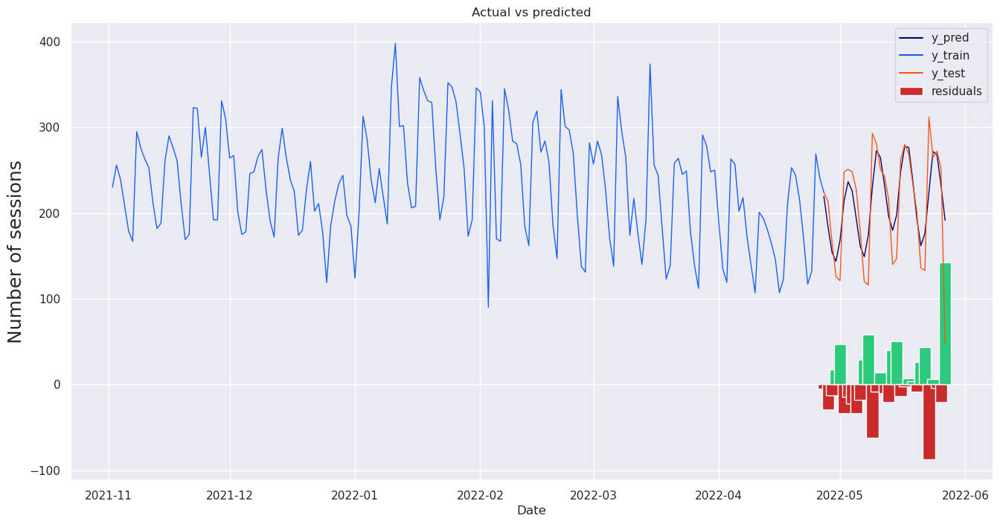

In [214]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_act_lvl, gen_act_lvl_features, 
          'number_of_sessions', sequence_length = 60)

#### RNN for gender and goal

In [228]:
df_session_exe_copy_demo_dummies_user_once_a_day_gen_g = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_gen_g.set_index('date_session_execution', inplace = True)

gen_g_features = ['number_of_sessions', 'gender_female', 'gender_male',
                        'goal_antiaging', 'goal_gain','goal_lose']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 152ms/step - loss: 0.0823 - val_loss: 0.0449
Epoch 2/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0404 - val_loss: 0.0411
Epoch 3/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0395 - val_loss: 0.0401
Epoch 4/50
8/8 [==============================] - 1s 76ms/step - loss: 0.0383 - val_loss: 0.0395
Epoch 5/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0381 - val_loss: 0.0392
Epoch 6/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0375 - val_loss: 0.0385
Epoch 7/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0376 - val_loss: 0.0386
Epoch 8/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0364 - val_loss: 0.0378
Epoch 9/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0386 - val_loss: 0.0376
Epoch 10/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0385 - val_loss: 0.0

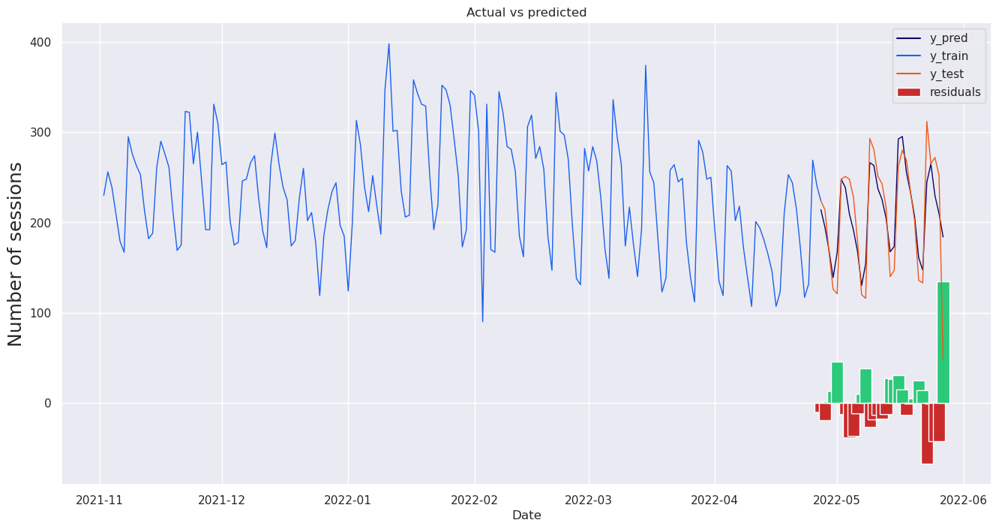

In [229]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_g, gen_g_features, 
          'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 115ms/step - loss: 0.1147 - val_loss: 0.0381
Epoch 2/50
9/9 [==============================] - 0s 48ms/step - loss: 0.0402 - val_loss: 0.0417
Epoch 3/50
9/9 [==============================] - 0s 47ms/step - loss: 0.0370 - val_loss: 0.0398
Epoch 4/50
9/9 [==============================] - 0s 47ms/step - loss: 0.0367 - val_loss: 0.0391
Epoch 5/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0380 - val_loss: 0.0391
Epoch 6/50
9/9 [==============================] - 0s 47ms/step - loss: 0.0380 - val_loss: 0.0390
Epoch 7/50
9/9 [==============================] - 0s 46ms/step - loss: 0.0366 - val_loss: 0.0385
Epoch 8/50
9/9 [==============================] - 0s 47ms/step - loss: 0.0353 - val_loss: 0.0377
Epoch 9/50
9/9 [==============================] - 0s 47ms/step - loss: 0.0358 - val_loss: 0.0374
Epoch 10/50
9/9 [==============================] - 0s 47ms/step - loss: 0.0344 - val_loss: 0.0

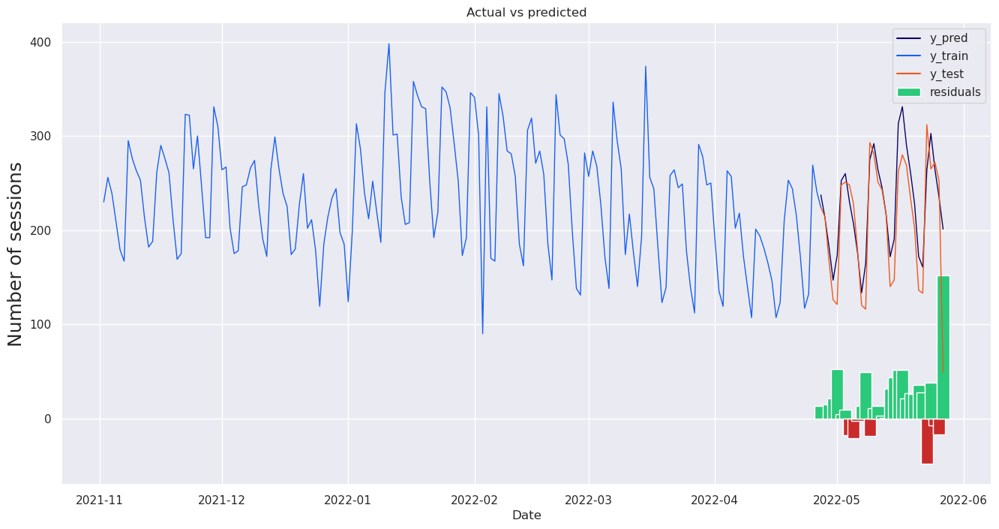

In [230]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_g, gen_g_features, 
          'number_of_sessions', sequence_length = 40)

#### RNN for gender and body type

In [231]:
df_session_exe_copy_demo_dummies_user_once_a_day_gen_bt = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_gen_bt.set_index('date_session_execution', inplace = True)

gen_bt_features = ['number_of_sessions', 'gender_female', 'gender_male',
                        'body_type_mid', 'body_type_strong', 'body_type_thin']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 154ms/step - loss: 0.1129 - val_loss: 0.0542
Epoch 2/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0471 - val_loss: 0.0398
Epoch 3/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0419 - val_loss: 0.0399
Epoch 4/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0412 - val_loss: 0.0390
Epoch 5/50
8/8 [==============================] - 1s 75ms/step - loss: 0.0386 - val_loss: 0.0388
Epoch 6/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0381 - val_loss: 0.0396
Epoch 7/50
8/8 [==============================] - 1s 76ms/step - loss: 0.0375 - val_loss: 0.0387
Epoch 8/50
8/8 [==============================] - 1s 76ms/step - loss: 0.0363 - val_loss: 0.0397
Epoch 9/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0369 - val_loss: 0.0383
Epoch 10/50
8/8 [==============================] - 1s 74ms/step - loss: 0.0368 - val_loss: 0.0

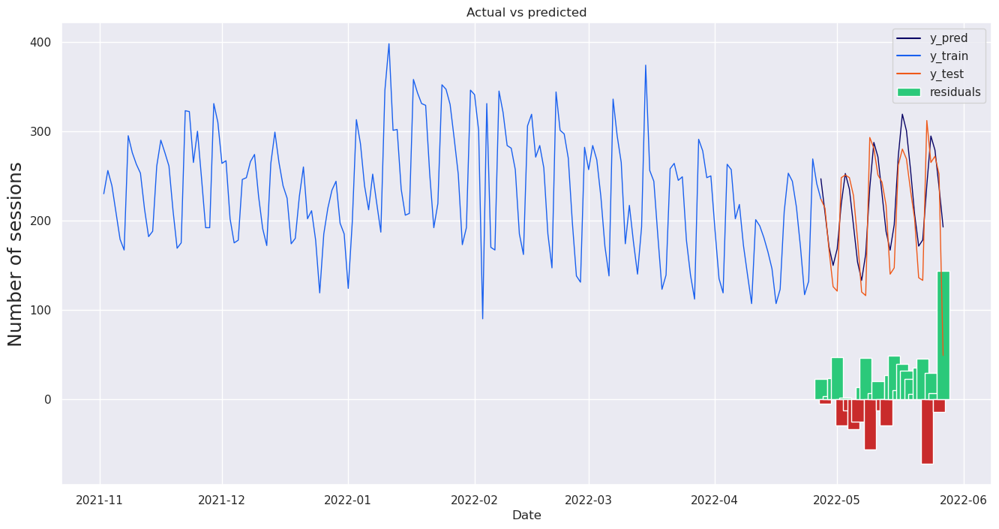

In [232]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_bt, gen_bt_features, 
          'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 174ms/step - loss: 0.3083 - val_loss: 0.0377
Epoch 2/50
8/8 [==============================] - 1s 99ms/step - loss: 0.0613 - val_loss: 0.0544
Epoch 3/50
8/8 [==============================] - 1s 93ms/step - loss: 0.0500 - val_loss: 0.0510
Epoch 4/50
8/8 [==============================] - 1s 97ms/step - loss: 0.0467 - val_loss: 0.0389
Epoch 5/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0400 - val_loss: 0.0392
Epoch 6/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0372 - val_loss: 0.0405
Epoch 7/50
8/8 [==============================] - 1s 91ms/step - loss: 0.0366 - val_loss: 0.0399
Epoch 8/50
8/8 [==============================] - 1s 92ms/step - loss: 0.0365 - val_loss: 0.0395
Epoch 9/50
8/8 [==============================] - 1s 92ms/step - loss: 0.0362 - val_loss: 0.0398
Epoch 10/50
8/8 [==============================] - 1s 92ms/step - loss: 0.0365 - val_loss: 0.0

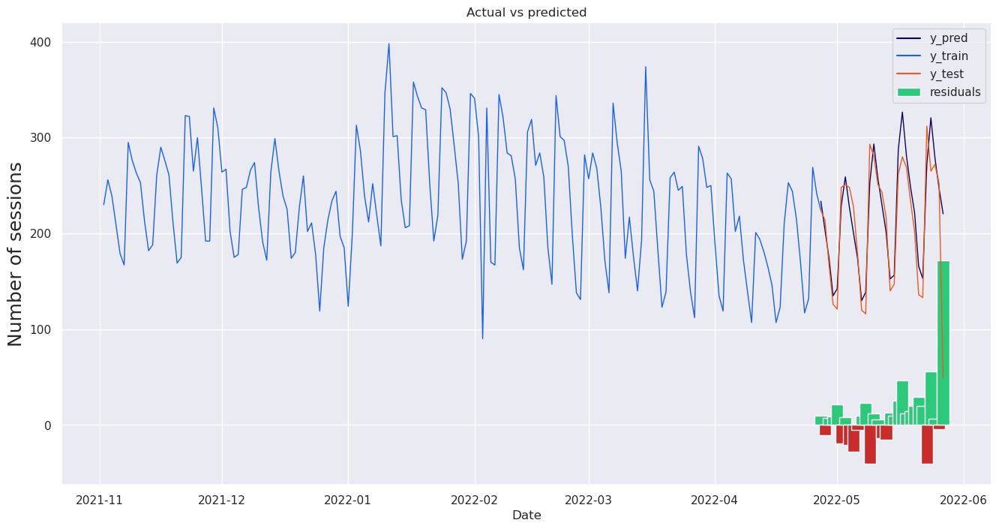

In [233]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_bt, gen_bt_features, 
          'number_of_sessions', sequence_length = 55)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 189ms/step - loss: 0.2089 - val_loss: 0.0505
Epoch 2/50
8/8 [==============================] - 1s 114ms/step - loss: 0.0491 - val_loss: 0.0448
Epoch 3/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0429 - val_loss: 0.0437
Epoch 4/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0398 - val_loss: 0.0390
Epoch 5/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0384 - val_loss: 0.0423
Epoch 6/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0413 - val_loss: 0.0389
Epoch 7/50
8/8 [==============================] - 1s 109ms/step - loss: 0.0395 - val_loss: 0.0413
Epoch 8/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0384 - val_loss: 0.0381
Epoch 9/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0396 - val_loss: 0.0391
Epoch 10/50
8/8 [==============================] - 1s 106ms/step - loss: 0.0397 - val_

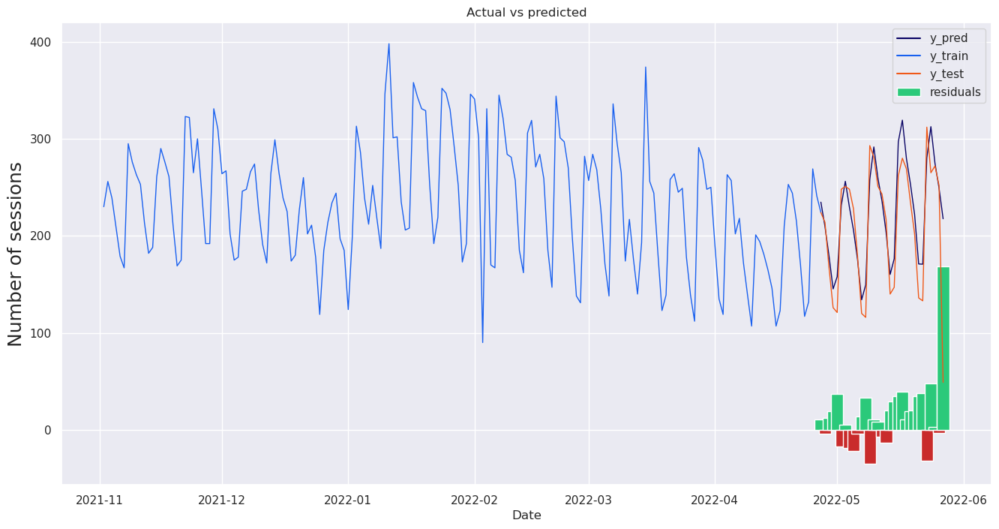

In [234]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_bt, gen_bt_features, 
          'number_of_sessions', sequence_length = 60)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 4s 134ms/step - loss: 0.0995 - val_loss: 0.0506
Epoch 2/50
9/9 [==============================] - 1s 62ms/step - loss: 0.0387 - val_loss: 0.0438
Epoch 3/50
9/9 [==============================] - 1s 60ms/step - loss: 0.0393 - val_loss: 0.0451
Epoch 4/50
9/9 [==============================] - 1s 61ms/step - loss: 0.0387 - val_loss: 0.0396
Epoch 5/50
9/9 [==============================] - 1s 60ms/step - loss: 0.0391 - val_loss: 0.0392
Epoch 6/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0402 - val_loss: 0.0422
Epoch 7/50
9/9 [==============================] - 1s 59ms/step - loss: 0.0381 - val_loss: 0.0383
Epoch 8/50
9/9 [==============================] - 1s 60ms/step - loss: 0.0356 - val_loss: 0.0427
Epoch 9/50
9/9 [==============================] - 1s 60ms/step - loss: 0.0358 - val_loss: 0.0378
Epoch 10/50
9/9 [==============================] - 1s 60ms/step - loss: 0.0367 - val_loss: 0.0

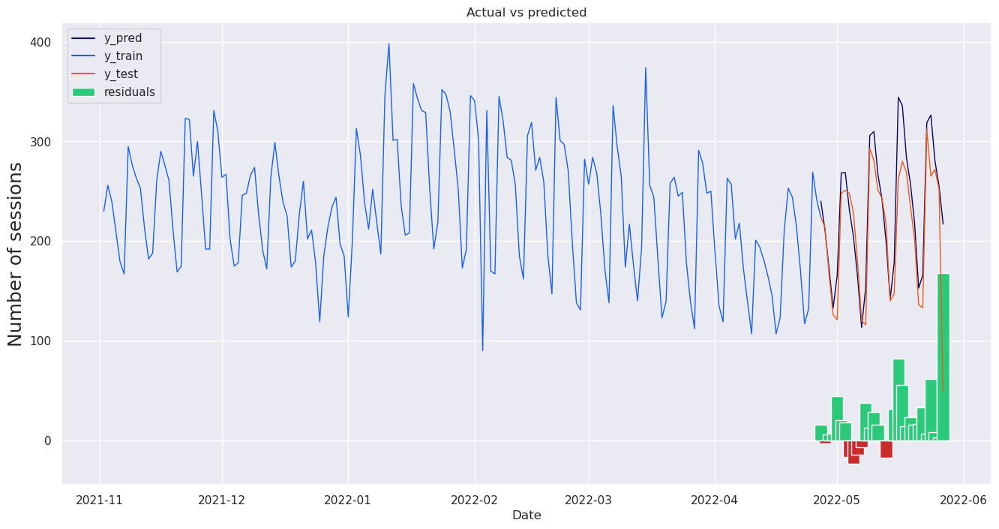

In [235]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_bt, gen_bt_features, 
          'number_of_sessions', sequence_length = 45)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 3s 88ms/step - loss: 0.0976 - val_loss: 0.0419
Epoch 2/50
10/10 [==============================] - 0s 31ms/step - loss: 0.0432 - val_loss: 0.0436
Epoch 3/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0409 - val_loss: 0.0407
Epoch 4/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0347 - val_loss: 0.0385
Epoch 5/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0348 - val_loss: 0.0392
Epoch 6/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0340 - val_loss: 0.0391
Epoch 7/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0335 - val_loss: 0.0383
Epoch 8/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0345 - val_loss: 0.0403
Epoch 9/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0335 - val_loss: 0.0377
Epoch 10/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0

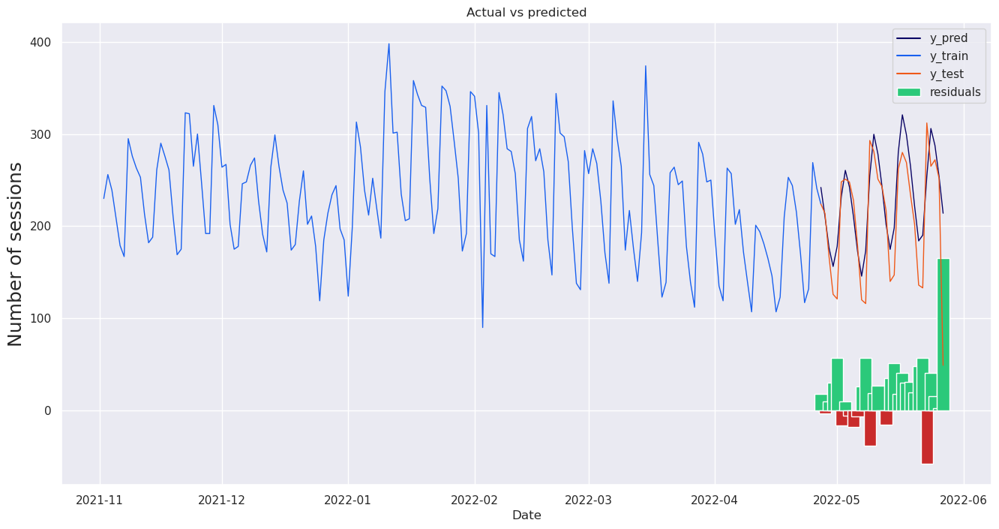

In [237]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen_bt, gen_bt_features, 
          'number_of_sessions', sequence_length = 30)

#### RNN for gender

In [238]:
df_session_exe_copy_demo_dummies_user_once_a_day_gen = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_gen.set_index('date_session_execution', inplace = True)

gen_features = ['number_of_sessions', 'gender_female', 'gender_male']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 121ms/step - loss: 0.1199 - val_loss: 0.0470
Epoch 2/50
8/8 [==============================] - 0s 42ms/step - loss: 0.0458 - val_loss: 0.0379
Epoch 3/50
8/8 [==============================] - 0s 41ms/step - loss: 0.0388 - val_loss: 0.0381
Epoch 4/50
8/8 [==============================] - 0s 46ms/step - loss: 0.0377 - val_loss: 0.0369
Epoch 5/50
8/8 [==============================] - 0s 46ms/step - loss: 0.0365 - val_loss: 0.0372
Epoch 6/50
8/8 [==============================] - 0s 43ms/step - loss: 0.0372 - val_loss: 0.0368
Epoch 7/50
8/8 [==============================] - 0s 42ms/step - loss: 0.0365 - val_loss: 0.0365
Epoch 8/50
8/8 [==============================] - 0s 42ms/step - loss: 0.0361 - val_loss: 0.0366
Epoch 9/50
8/8 [==============================] - 0s 45ms/step - loss: 0.0368 - val_loss: 0.0366
Epoch 10/50
8/8 [==============================] - 0s 42ms/step - loss: 0.0368 - val_loss: 0.0

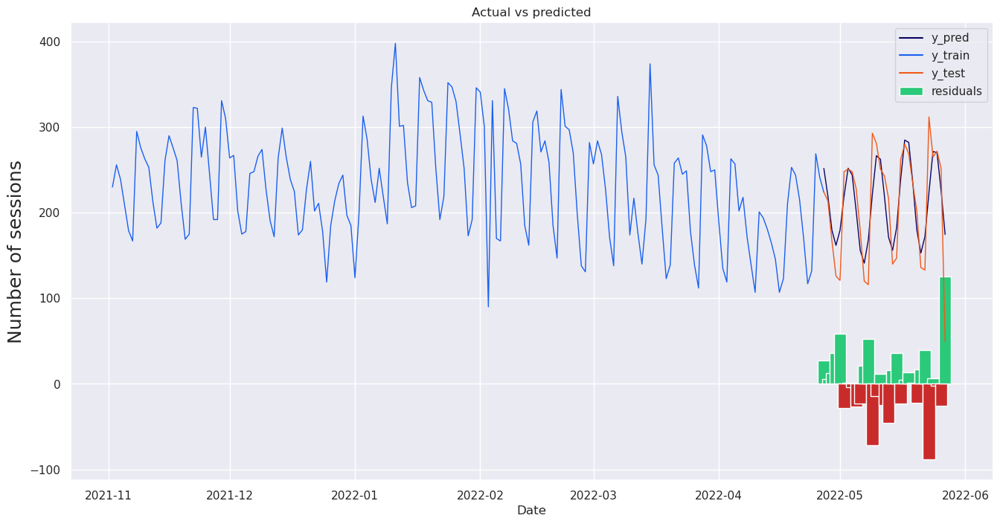

In [239]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen, gen_features, 
          'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 3s 129ms/step - loss: 0.0897 - val_loss: 0.0553
Epoch 2/50
8/8 [==============================] - 0s 49ms/step - loss: 0.0491 - val_loss: 0.0382
Epoch 3/50
8/8 [==============================] - 0s 49ms/step - loss: 0.0451 - val_loss: 0.0387
Epoch 4/50
8/8 [==============================] - 0s 49ms/step - loss: 0.0410 - val_loss: 0.0388
Epoch 5/50
8/8 [==============================] - 0s 49ms/step - loss: 0.0365 - val_loss: 0.0385
Epoch 6/50
8/8 [==============================] - 0s 48ms/step - loss: 0.0388 - val_loss: 0.0377
Epoch 7/50
8/8 [==============================] - 0s 49ms/step - loss: 0.0375 - val_loss: 0.0379
Epoch 8/50
8/8 [==============================] - 0s 49ms/step - loss: 0.0368 - val_loss: 0.0374
Epoch 9/50
8/8 [==============================] - 0s 48ms/step - loss: 0.0370 - val_loss: 0.0374
Epoch 10/50
8/8 [==============================] - 0s 49ms/step - loss: 0.0368 - val_loss: 0.0

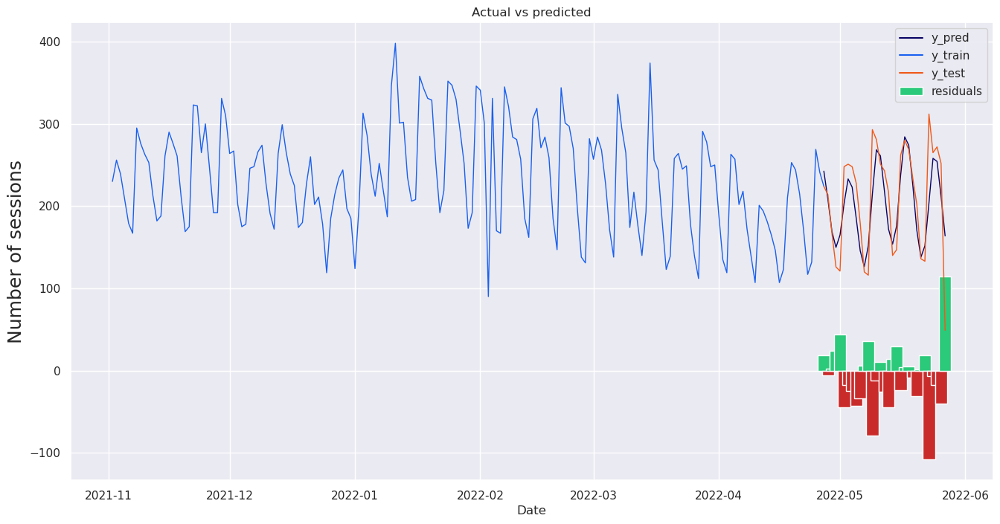

In [240]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen, gen_features, 
          'number_of_sessions', sequence_length = 55)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 136ms/step - loss: 0.0966 - val_loss: 0.0428
Epoch 2/50
8/8 [==============================] - 0s 59ms/step - loss: 0.0437 - val_loss: 0.0381
Epoch 3/50
8/8 [==============================] - 0s 54ms/step - loss: 0.0418 - val_loss: 0.0381
Epoch 4/50
8/8 [==============================] - 0s 56ms/step - loss: 0.0393 - val_loss: 0.0381
Epoch 5/50
8/8 [==============================] - 0s 54ms/step - loss: 0.0399 - val_loss: 0.0378
Epoch 6/50
8/8 [==============================] - 0s 54ms/step - loss: 0.0424 - val_loss: 0.0379
Epoch 7/50
8/8 [==============================] - 0s 55ms/step - loss: 0.0390 - val_loss: 0.0375
Epoch 8/50
8/8 [==============================] - 0s 54ms/step - loss: 0.0392 - val_loss: 0.0375
Epoch 9/50
8/8 [==============================] - 0s 55ms/step - loss: 0.0393 - val_loss: 0.0368
Epoch 10/50
8/8 [==============================] - 0s 57ms/step - loss: 0.0397 - val_loss: 0.0

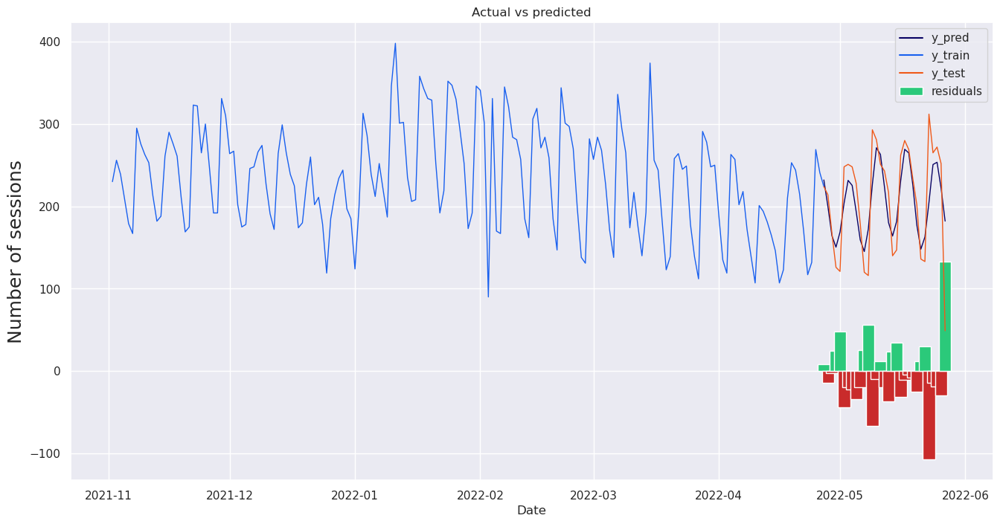

In [241]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_gen, gen_features, 
          'number_of_sessions', sequence_length = 60)

#### RNN for BMI

In [242]:
df_session_exe_copy_demo_dummies_user_once_a_day_bmi = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_bmi.set_index('date_session_execution', inplace = True)

bmi_features = ['number_of_sessions', 'BMI']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 3s 113ms/step - loss: 0.1161 - val_loss: 0.0491
Epoch 2/50
8/8 [==============================] - 0s 35ms/step - loss: 0.0401 - val_loss: 0.0377
Epoch 3/50
8/8 [==============================] - 0s 30ms/step - loss: 0.0370 - val_loss: 0.0491
Epoch 4/50
8/8 [==============================] - 0s 31ms/step - loss: 0.0357 - val_loss: 0.0392
Epoch 5/50
8/8 [==============================] - 0s 31ms/step - loss: 0.0365 - val_loss: 0.0418
Epoch 6/50
8/8 [==============================] - 0s 31ms/step - loss: 0.0356 - val_loss: 0.0410
Epoch 7/50
8/8 [==============================] - 0s 31ms/step - loss: 0.0359 - val_loss: 0.0414
Epoch 8/50
8/8 [==============================] - 0s 31ms/step - loss: 0.0353 - val_loss: 0.0409
Epoch 9/50
8/8 [==============================] - 0s 31ms/step - loss: 0.0356 - val_loss: 0.0393
Epoch 10/50
8/8 [==============================] - 0s 31ms/step - loss: 0.0359 - val_loss: 0.0

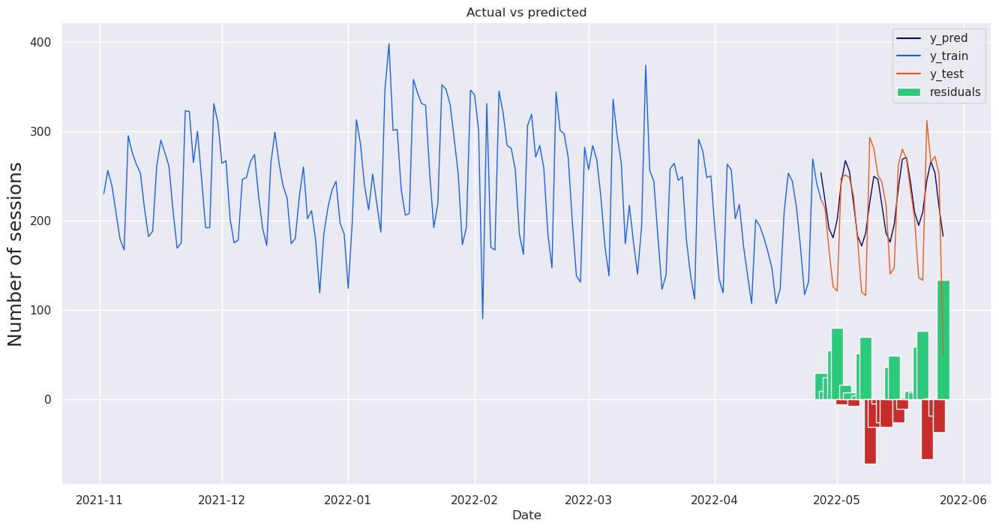

In [243]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_bmi, bmi_features, 
          'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
9/9 [==============================] - 3s 101ms/step - loss: 0.1360 - val_loss: 0.0796
Epoch 2/50
9/9 [==============================] - 0s 24ms/step - loss: 0.0446 - val_loss: 0.0380
Epoch 3/50
9/9 [==============================] - 0s 23ms/step - loss: 0.0375 - val_loss: 0.0496
Epoch 4/50
9/9 [==============================] - 0s 24ms/step - loss: 0.0366 - val_loss: 0.0408
Epoch 5/50
9/9 [==============================] - 0s 21ms/step - loss: 0.0345 - val_loss: 0.0383
Epoch 6/50
9/9 [==============================] - 0s 22ms/step - loss: 0.0333 - val_loss: 0.0450
Epoch 7/50
9/9 [==============================] - 0s 21ms/step - loss: 0.0340 - val_loss: 0.0379
Epoch 8/50
9/9 [==============================] - 0s 21ms/step - loss: 0.0340 - val_loss: 0.0416
Epoch 9/50
9/9 [==============================] - 0s 21ms/step - loss: 0.0333 - val_loss: 0.0385
Epoch 10/50
9/9 [==============================] - 0s 22ms/step - loss: 0.0330 - val_loss: 0.0

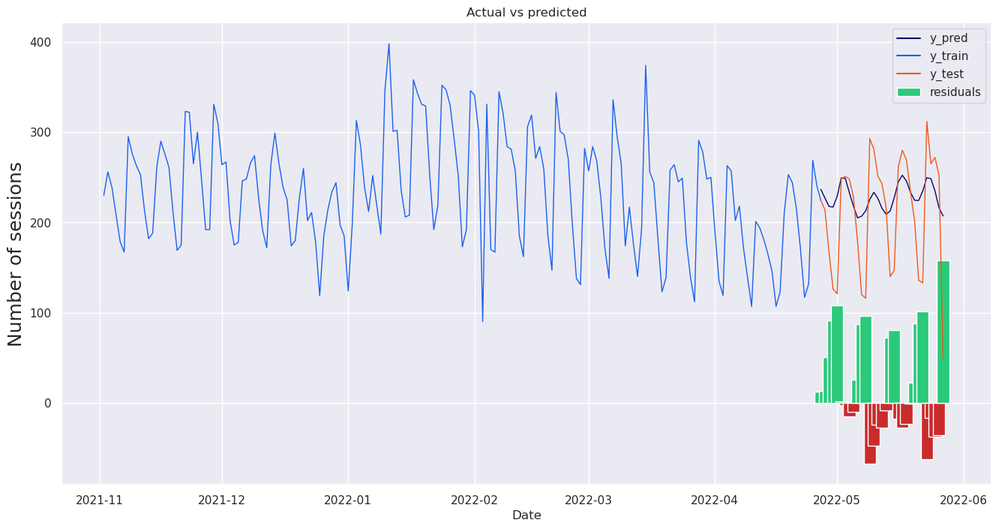

In [251]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_bmi, bmi_features, 
          'number_of_sessions', sequence_length = 35)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 3s 119ms/step - loss: 0.0586 - val_loss: 0.0358
Epoch 2/50
8/8 [==============================] - 0s 47ms/step - loss: 0.0443 - val_loss: 0.0440
Epoch 3/50
8/8 [==============================] - 0s 36ms/step - loss: 0.0409 - val_loss: 0.0470
Epoch 4/50
8/8 [==============================] - 0s 37ms/step - loss: 0.0388 - val_loss: 0.0410
Epoch 5/50
8/8 [==============================] - 0s 37ms/step - loss: 0.0373 - val_loss: 0.0404
Epoch 6/50
8/8 [==============================] - 0s 38ms/step - loss: 0.0367 - val_loss: 0.0437
Epoch 7/50
8/8 [==============================] - 0s 36ms/step - loss: 0.0359 - val_loss: 0.0414
Epoch 8/50
8/8 [==============================] - 0s 35ms/step - loss: 0.0352 - val_loss: 0.0404
Epoch 9/50
8/8 [==============================] - 0s 35ms/step - loss: 0.0352 - val_loss: 0.0421
Epoch 10/50
8/8 [==============================] - 0s 36ms/step - loss: 0.0353 - val_loss: 0.0

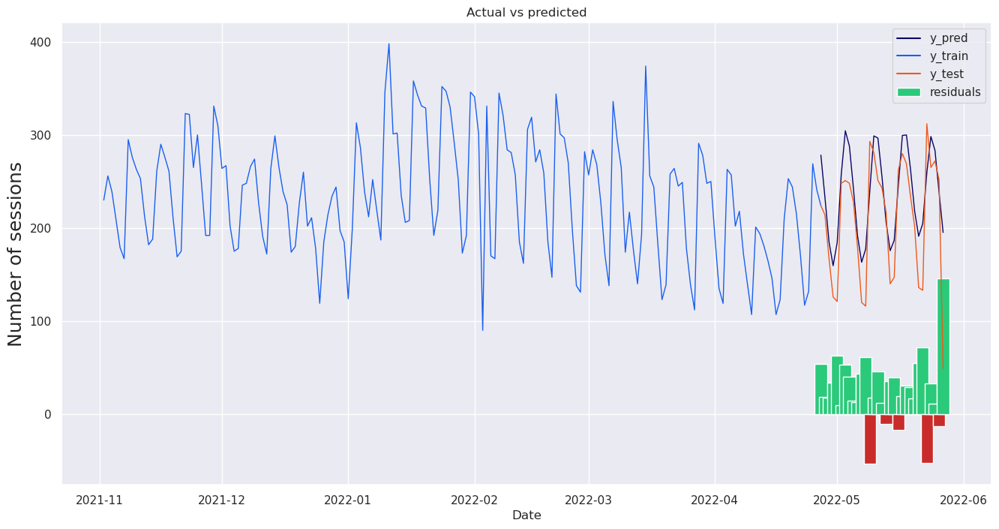

In [247]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_bmi, bmi_features, 
          'number_of_sessions', sequence_length = 55)

#### RNN for activity level

In [252]:
df_session_exe_copy_demo_dummies_user_once_a_day_act_lvl = df_session_exe_copy_demo_dummies_user_once_a_day.copy()

df_session_exe_copy_demo_dummies_user_once_a_day_act_lvl.set_index('date_session_execution', inplace = True)

act_lvl_features = ['number_of_sessions', 
                'activity_level_very active','activity_level_active','activity_level_sedentary']

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
8/8 [==============================] - 4s 142ms/step - loss: 0.1158 - val_loss: 0.0473
Epoch 2/50
8/8 [==============================] - 0s 52ms/step - loss: 0.0463 - val_loss: 0.0391
Epoch 3/50
8/8 [==============================] - 0s 51ms/step - loss: 0.0415 - val_loss: 0.0394
Epoch 4/50
8/8 [==============================] - 0s 51ms/step - loss: 0.0409 - val_loss: 0.0407
Epoch 5/50
8/8 [==============================] - 0s 52ms/step - loss: 0.0367 - val_loss: 0.0394
Epoch 6/50
8/8 [==============================] - 0s 51ms/step - loss: 0.0382 - val_loss: 0.0402
Epoch 7/50
8/8 [==============================] - 0s 51ms/step - loss: 0.0365 - val_loss: 0.0381
Epoch 8/50
8/8 [==============================] - 0s 51ms/step - loss: 0.0359 - val_loss: 0.0385
Epoch 9/50
8/8 [==============================] - 0s 51ms/step - loss: 0.0364 - val_loss: 0.0375
Epoch 10/50
8/8 [==============================] - 0s 51ms/step - loss: 0.0357 - val_loss: 0.0

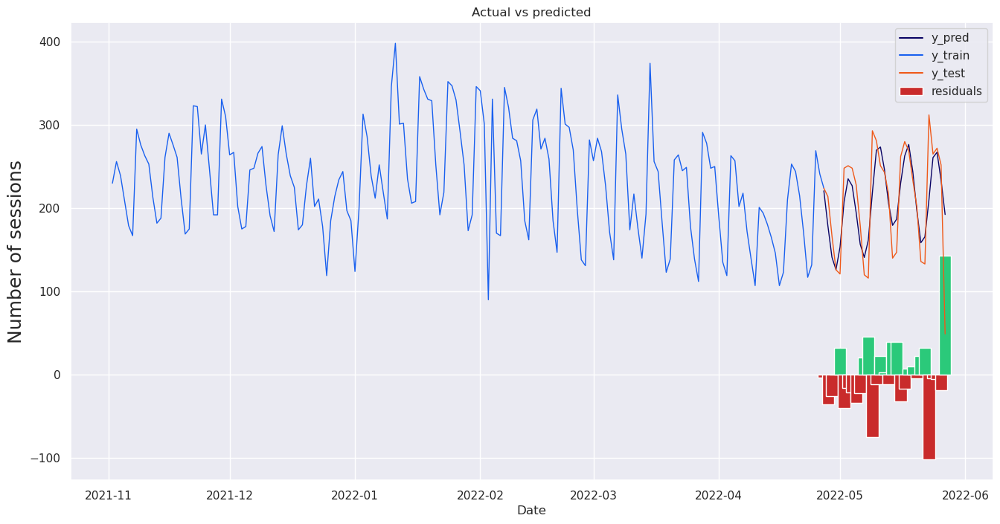

In [253]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_act_lvl, act_lvl_features, 
          'number_of_sessions', sequence_length = 50)

[FITTING THE MODEL TO THE DATA]
Epoch 1/50
10/10 [==============================] - 3s 79ms/step - loss: 0.0874 - val_loss: 0.0488
Epoch 2/50
10/10 [==============================] - 0s 22ms/step - loss: 0.0397 - val_loss: 0.0410
Epoch 3/50
10/10 [==============================] - 0s 19ms/step - loss: 0.0351 - val_loss: 0.0382
Epoch 4/50
10/10 [==============================] - 0s 18ms/step - loss: 0.0349 - val_loss: 0.0373
Epoch 5/50
10/10 [==============================] - 0s 18ms/step - loss: 0.0339 - val_loss: 0.0371
Epoch 6/50
10/10 [==============================] - 0s 18ms/step - loss: 0.0334 - val_loss: 0.0370
Epoch 7/50
10/10 [==============================] - 0s 19ms/step - loss: 0.0332 - val_loss: 0.0368
Epoch 8/50
10/10 [==============================] - 0s 18ms/step - loss: 0.0337 - val_loss: 0.0368
Epoch 9/50
10/10 [==============================] - 0s 17ms/step - loss: 0.0329 - val_loss: 0.0366
Epoch 10/50
10/10 [==============================] - 0s 17ms/step - loss: 0.0

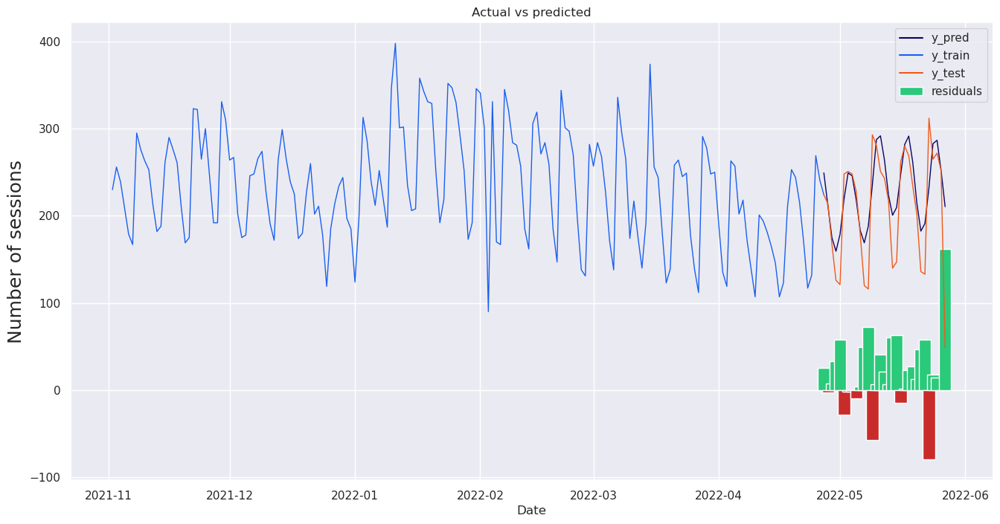

In [256]:
RNN_trial(df_session_exe_copy_demo_dummies_user_once_a_day_act_lvl, act_lvl_features, 
          'number_of_sessions', sequence_length = 25)

## Weekly approach

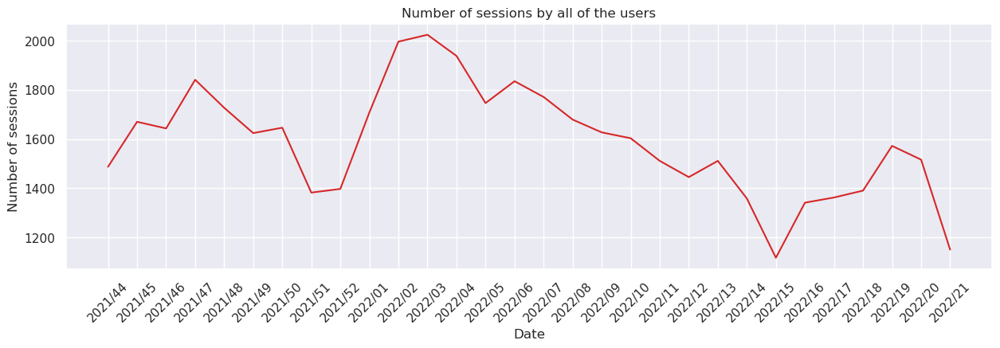

In [145]:
plot_df(sessions_a_week, x=sessions_a_week['YYYY/WW'], y=sessions_a_week['number_of_sessions'], title='Number of sessions by all of the users', tick_rot = 45)


### Check stationarity

In [146]:
sessions_a_week_i = sessions_a_week.set_index('YYYY/WW')

ADF Statistic: -1.532
p-value: 0.518
Critical Values:
Critical Values Over 1%: -3.679
Critical Values Over 5%: -2.968
Critical Values Over 10%: -2.623


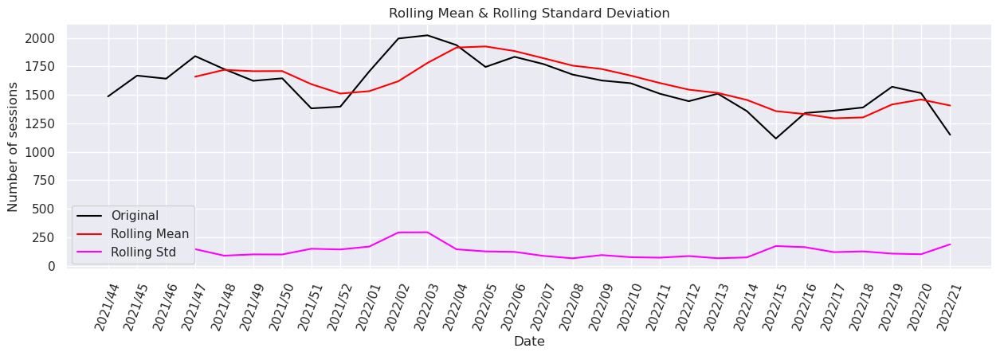

In [147]:
check_stationarity(sessions_a_week_i, win = 4, tick_rot = 70)

The data is not stationary. ADF Statistic is bigger than critical values and p-value is higher than significance level. Additionally, rolling mean (by month - 4 weeks) is not 'constant', rolling std is close to 'constant. 

In [148]:
check_stationarity_trend(sessions_a_week_i)

KPSS Statistic: 0.133
p-value: 0.075
Critical Values:
Critical Values Over 10%: 0.119
Critical Values Over 5%: 0.146
Critical Values Over 2.5%: 0.176
Critical Values Over 1%: 0.216


The p-value is bigger than significance level and the statistic is lower than most critical values, so we can say that the data is trend stationary.

### ACF and PACF

<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

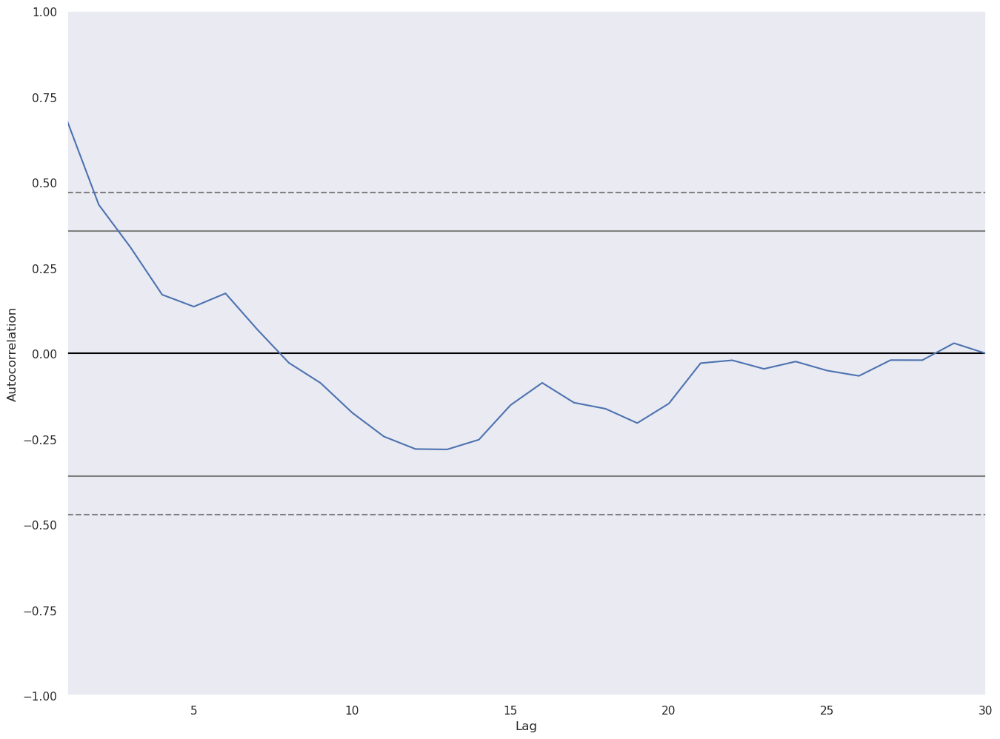

In [149]:
autocorrelation_plot(sessions_a_week_i)

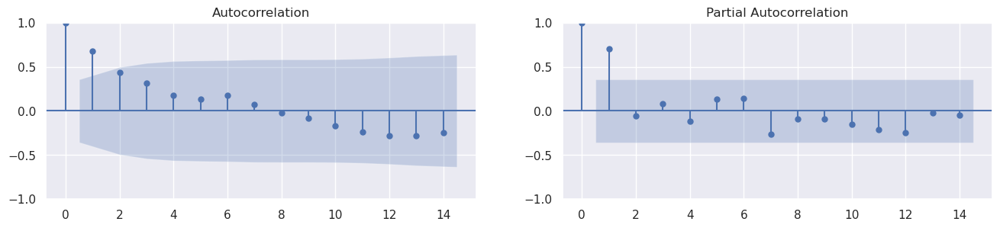

In [150]:
fig, axes = plt.subplots(1,2,figsize=(16,3))
plot_acf(sessions_a_week_i, lags = 14, ax=axes[0]);
plot_pacf(sessions_a_week_i, lags = 14, ax=axes[1]);

## Number of sessions in a day by groups

In [151]:
from statsmodels.tsa.stattools import grangercausalitytests

### By gender

In [152]:
def df_plot_by_cats(df, cat_col, freq = 'D', plot = True, dpi = 100, tick_rot = 0):
    
    df['date_session_execution'] = pd.to_datetime(df['updated_at_session_execution']).dt.date
    df2 = df.copy()
    
    df2 = df2.loc[:, ['id_session_execution', 'date_session_execution', cat_col]]
    
    df2['date_session_execution'] = pd.DatetimeIndex(df2['date_session_execution'])
    df2 = df2.set_index('date_session_execution').sort_values(by = 'date_session_execution').groupby([pd.Grouper(freq = freq), cat_col]).nunique()
    df2.reset_index(inplace = True)
    
    df_cat = df2.pivot(index = 'date_session_execution', columns = cat_col)
    df_cat.columns = df_cat.columns.droplevel().tolist()
    df_cat.reset_index(inplace = True)
    
    if plot == True:
        
        df_cat['date_session_execution'] = pd.to_datetime(df_cat['date_session_execution']).dt.date
        
        if len(df_cat.columns) in range(4):
            plt.figure(figsize=(15,5), dpi=dpi)
        elif len(df_cat.columns) in range(4,7):
            plt.figure(figsize=(15,7), dpi=dpi)
        else:
            plt.figure(figsize=(15,9), dpi=dpi)        
        
        for cat in range(1, len(df_cat.columns)):
            plt.plot(df_cat['date_session_execution'], df_cat.iloc[:, [cat]], 
                     label = df_cat.columns[cat])
        plt.gca().set(title = "Number of sessions by {}".format(cat_col), 
                      xlabel='Date', ylabel='number of sessions')
        plt.xticks(rotation = tick_rot)
        plt.legend()
        
        return df_cat, plt
    
    else: return df_cat


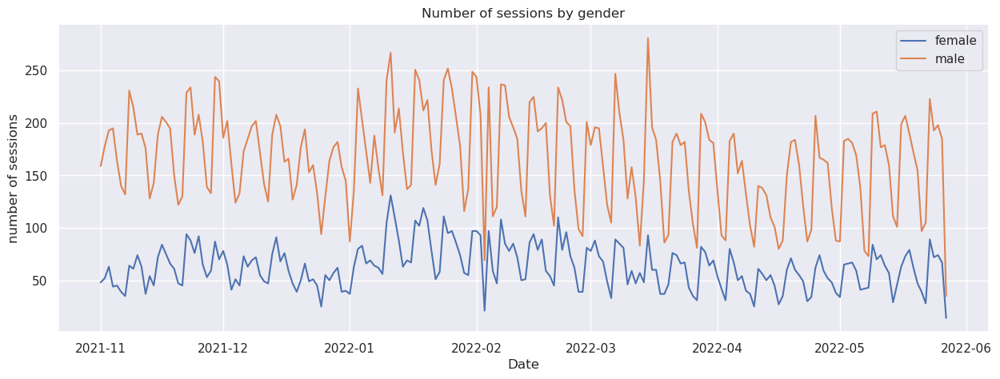

In [153]:
df_gender, plot_gender = df_plot_by_cats(df_session_exe, 'gender')

ADF Statistic: -2.402
p-value: 0.141
Critical Values:
Critical Values Over 1%: -3.464
Critical Values Over 5%: -2.876
Critical Values Over 10%: -2.575


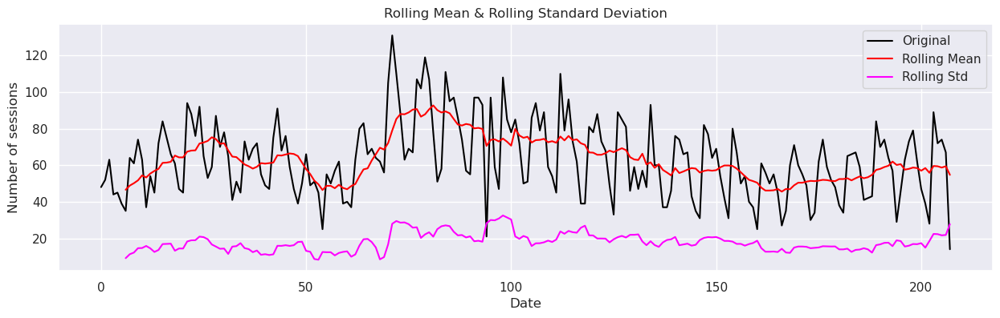

In [154]:
check_stationarity(df_gender.loc[:, ['female']])

ADF Statistic: -1.419
p-value: 0.573
Critical Values:
Critical Values Over 1%: -3.465
Critical Values Over 5%: -2.877
Critical Values Over 10%: -2.575


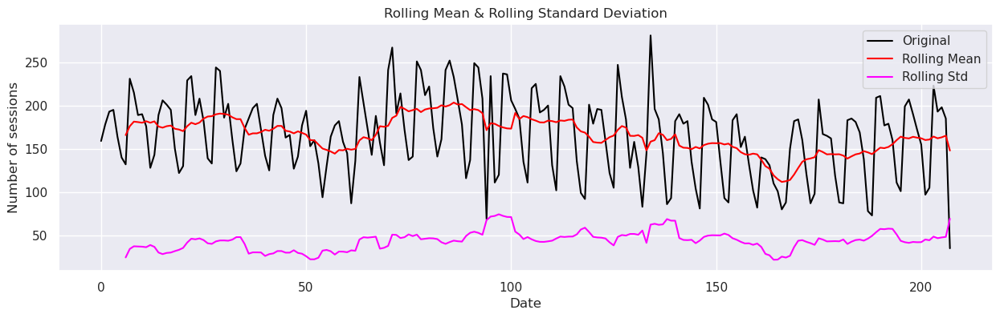

In [155]:
check_stationarity(df_gender.loc[:, ['male']])

In [156]:
def auto_arima_groups(df, split_date, split_plot = False, pred_plot = True, dpi = 100, tick_rot = 0):
    
    if 'date_session_execution' in df.columns:
        df.set_index('date_session_execution', inplace = True)
    
    train = df[df.index < pd.to_datetime(split_date, format = '%Y-%m-%d')]
    test = df[df.index >= pd.to_datetime(split_date, format = '%Y-%m-%d')]
    
    if split_plot == True:
        
        if len(df.columns) in range(3):
            plt.figure(figsize=(15,5), dpi=dpi)
        elif len(df.columns) in range(3,6):
            plt.figure(figsize=(15,7), dpi=dpi)
        else:
            plt.figure(figsize=(15,9), dpi=dpi)
        
        for cat in range(len(df.columns)):
            plt.plot(train.iloc[:, [cat]], 
                     label = "Train {}".format(df.columns[cat]))
            plt.plot(test.iloc[:, [cat]], 
                     label = "Test {}".format(df.columns[cat]))
        plt.gca().set(title = 'Train test split plot',
                      xlabel='Date', ylabel='number of sessions')
        plt.xticks(rotation = tick_rot)
        plt.legend(loc = 'best')
        plt.show()
    
    forecast_arima = pd.DataFrame(columns = df.columns, index = test.index)
    arima_results = pd.DataFrame(columns = df.columns, index = test.index)

    for col in range(len(df.columns)):

        model = auto_arima(train[[df.columns[col]]], trace=False, error_action='ignore', suppress_warnings=True)
        model.fit(train[[df.columns[col]]])

        forecast_arima_val = model.predict(n_periods=len(test[[df.columns[col]]]))
        forecast_arima[df.columns[col]] = forecast_arima_val
        forecast_arima_copy = forecast_arima.copy()
    
    if pred_plot == True:

        if len(df.columns) in range(3):
            plt.figure(figsize=(15,5), dpi=dpi)
        elif len(df.columns) in range(3,6):
            plt.figure(figsize=(15,7), dpi=dpi)
        else:
            plt.figure(figsize=(15,9), dpi=dpi)
        
        for col in range(len(df.columns)):
            plt.plot(train.iloc[:, [col]], 
                     label = "Train {}".format(df.columns[col]))
            plt.plot(test.iloc[:, [col]], 
                     label = "Test {}".format(df.columns[col]))
            plt.plot(forecast_arima.iloc[:, [col]], 
                     label = "Predicted {}".format(df.columns[col]))

        plt.gca().set(title = 'Predictions within groups',
                      xlabel='Date', ylabel='number of sessions')
        plt.xticks(rotation = tick_rot)
        plt.legend(loc = 'best')
        plt.show()
        
    evaluation_metrics = pd.DataFrame(columns = df.columns, index = ['RMSE', 'MSE', 'MAE', 'MAPE', 'SMAPE'])
    
    for col in range(len(df.columns)):
        metrics_vals = {'RMSE': round(rmse(test.iloc[:, [col]], forecast_arima.iloc[:, [col]]),3),
                        'MSE': round(mean_squared_error(test.iloc[:, [col]], forecast_arima.iloc[:, [col]]),3),
                        'MAE': round(mean_absolute_error(test.iloc[:, [col]], forecast_arima.iloc[:, [col]]),3),
                        'MAPE': round(mape(test.iloc[:, [col]], forecast_arima.iloc[:, [col]]), 3),
                        'SMAPE': round(calcsmape(test.iloc[:, [col]], forecast_arima.iloc[:, [col]]), 3)}
        
        evaluation_metrics[df.columns[col]] = metrics_vals
            
    for col in range(len(forecast_arima.columns)):
        forecast_arima_copy.rename(columns = {forecast_arima_copy.columns[col]: 'Predicted_{}'.format(forecast_arima.columns[col])},
                             inplace = True)

    arima_results = pd.concat([test, forecast_arima_copy], axis = 1)

    for col in range(len(df_gender.columns)):
        arima_results.rename(columns = {arima_results.columns[col]: 'Actual_{}'.format(df_gender.columns[col])},
                             inplace = True)
        
    return model, train, test, forecast_arima, arima_results, evaluation_metrics

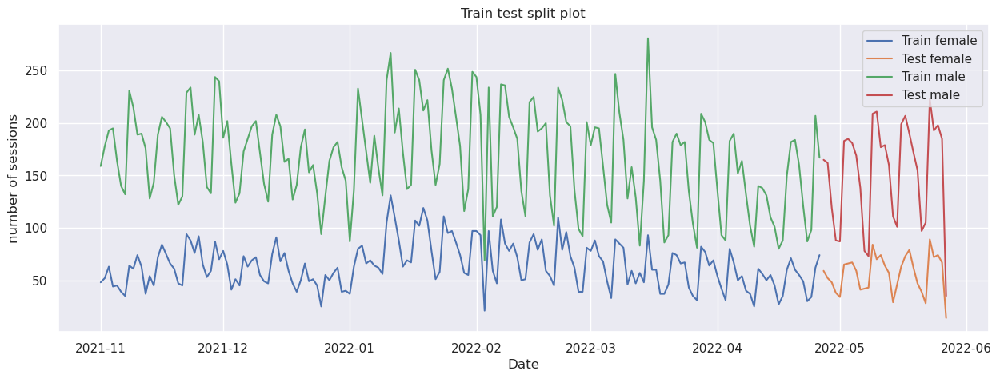

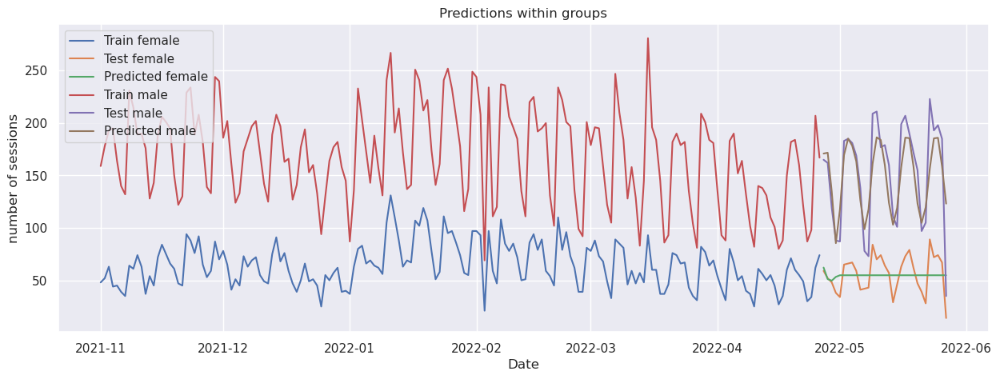

In [157]:
model_gender, train_gender, test_gender, forecast_arima_gender, arima_results_gender, evaluation_metrics_gender = auto_arima_groups(df_gender, '2022-04-27', split_plot = True)


In [158]:
evaluation_metrics_gender

,female,male
RMSE,17.56,28.86
MSE,308.48,832.88
MAE,14.81,21.24
MAPE,female 0.35 dtype: float64,male 0.21 dtype: float64
SMAPE,female 0.28 dtype: float64,male 0.16 dtype: float64


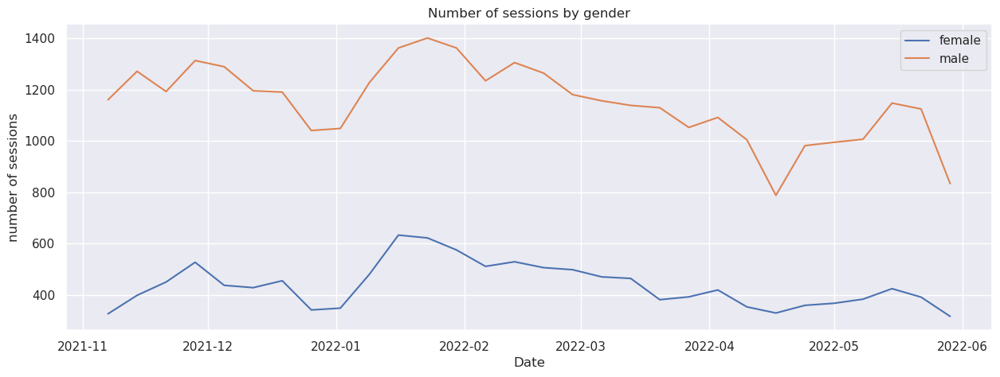

In [159]:
df_gender_week, plot_gender_week = df_plot_by_cats(df_session_exe, 'gender', freq = 'W')

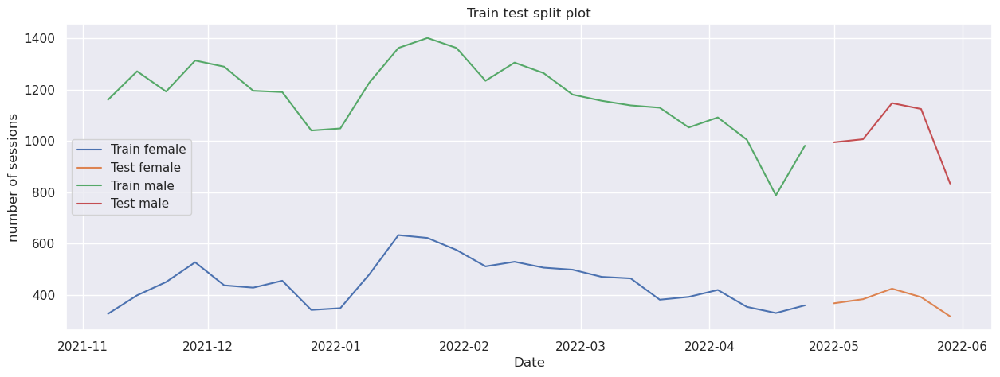

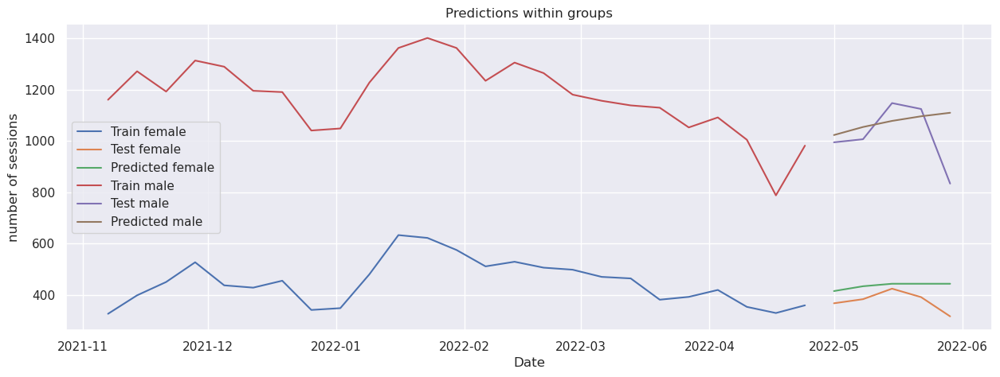

In [160]:
model_gender_week, train_gender_week, test_gender_week, forecast_arima_gender_week, arima_results_gender_week, evaluation_metrics_gender_week = auto_arima_groups(df_gender_week, '2022-04-27', split_plot = True)


In [161]:
evaluation_metrics_gender_week

,female,male
RMSE,69.42,130.39
MSE,4818.52,17002.07
MAE,59.35,90.05
MAPE,female 0.17 dtype: float64,male 0.10 dtype: float64
SMAPE,female 0.15 dtype: float64,male 0.09 dtype: float64


### By activity level

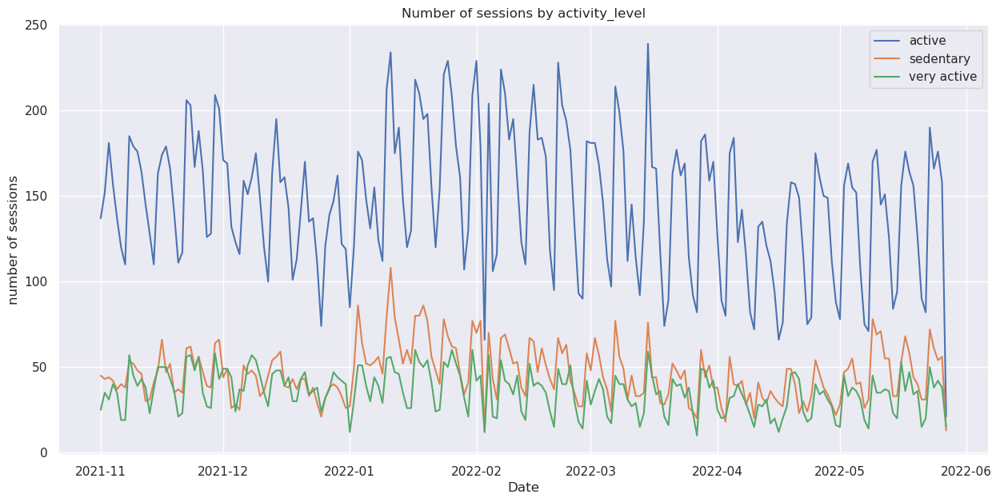

In [162]:
df_act_lvl, plot_act_lvl = df_plot_by_cats(df_session_exe, 'activity_level')

In [163]:
df_act_lvl.set_index('date_session_execution', inplace = True)

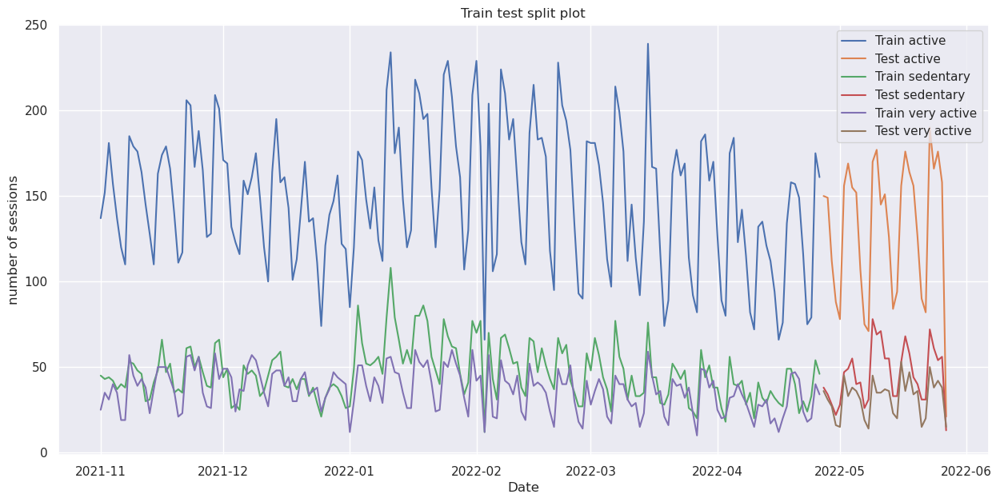

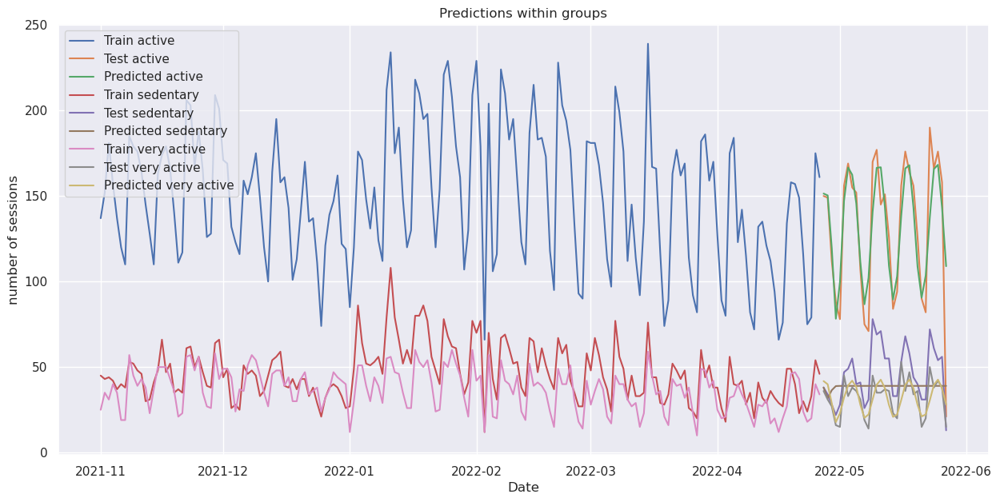

In [164]:
model_act_lvl, train_act_lvl, test_act_lvl, forecast_arima_act_lvl, arima_results_act_lvl, evaluation_metrics_act_lvl = auto_arima_groups(df_act_lvl, '2022-04-27', split_plot = True)


In [165]:
evaluation_metrics_act_lvl 

,active,sedentary,very active
RMSE,22.70,17.50,8.12
MSE,515.10,306.25,65.89
MAE,14.88,14.16,6.10
MAPE,active 0.23 dtype: float64,sedentary 0.34 dtype: float64,very active 0.21 dtype: float64
SMAPE,active 0.14 dtype: float64,sedentary 0.32 dtype: float64,very active 0.20 dtype: float64


### By clusters

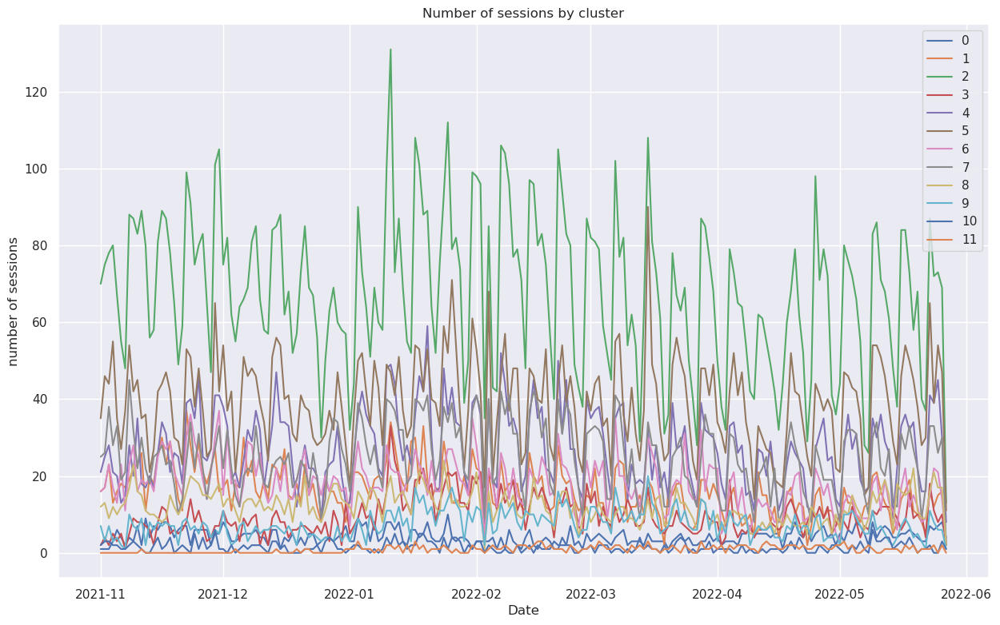

In [166]:
df_clusters, plot_clusters = df_plot_by_cats(df_session_exe, 'cluster')

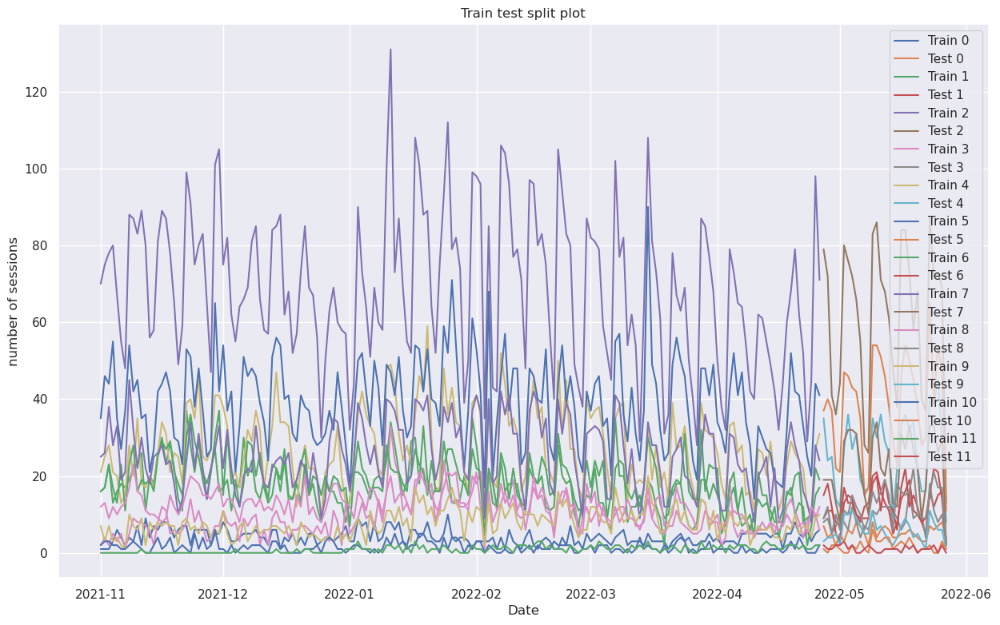

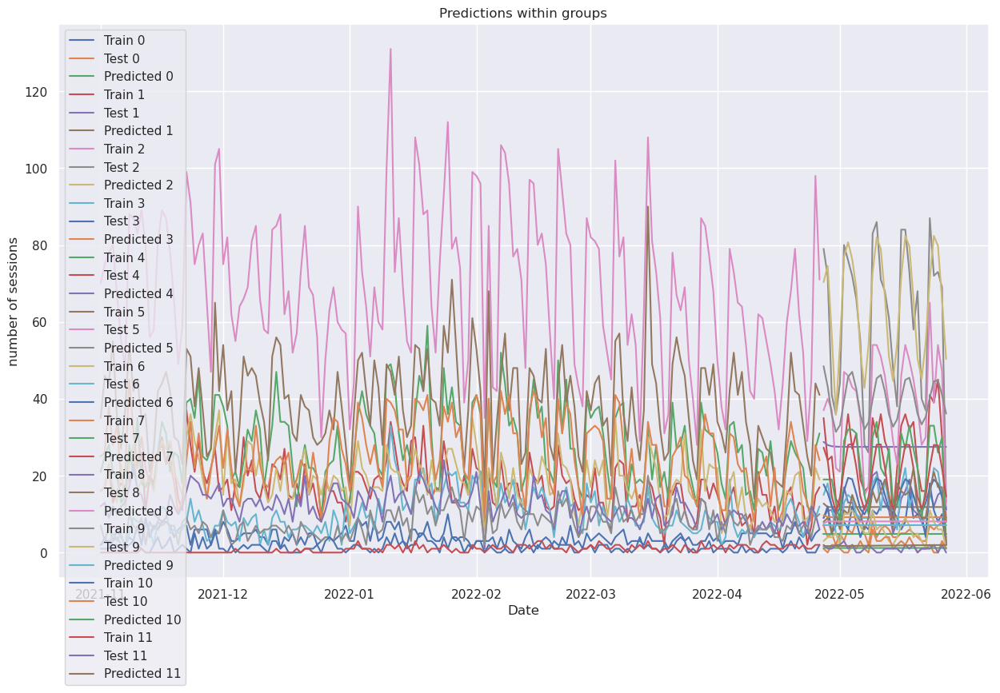

In [167]:
model_clusters, train_clusters, test_clusters, forecast_arima_clusters, arima_results_clusters, evaluation_metrics_clusters = auto_arima_groups(df_clusters, '2022-04-27', split_plot = True)


In [168]:
evaluation_metrics_clusters

,0,1,2,3,4,5,6,7,8,9,10,11
RMSE,1.69,4.45,12.41,3.34,9.61,10.00,4.00,6.41,6.52,3.14,1.59,1.11
MSE,2.86,19.81,154.06,11.15,92.39,100.02,15.99,41.07,42.54,9.87,2.52,1.24
MAE,1.37,3.58,9.47,2.60,8.03,7.74,3.22,5.64,5.33,2.66,1.22,0.92
MAPE,0 0.32 dtype: float64,1 0.47 dtype: float64,2 0.26 dtype: float64,3 0.42 dtype: float64,4 0.45 dtype: float64,5 0.29 dtype: float64,6 0.43 dtype: float64,7 0.45 dtype: float64,8 0.46 dtype: float64,9 0.93 dtype: float64,10 inf dtype: float64,11 inf dtype: float64
SMAPE,0 0.28 dtype: float64,1 0.32 dtype: float64,2 0.19 dtype: float64,3 0.30 dtype: float64,4 0.33 dtype: float64,5 0.23 dtype: float64,6 0.28 dtype: float64,7 0.30 dtype: float64,8 0.48 dtype: float64,9 0.47 dtype: float64,10 0.90 dtype: float64,11 0.81 dtype: float64
